## Imports

In [1]:
%matplotlib inline

import cv2
import csv
import numpy as np
import matplotlib.pyplot as plt
import random
import sys
import matplotlib
import os, re
from os import listdir
from os.path import isfile, join
import pickle

np.random.seed(1337)

from keras.applications.xception import Xception
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.resnet50 import ResNet50
from keras.applications.inception_v3 import InceptionV3
from keras.layers import Input, multiply, Dense, Flatten, concatenate, Dropout, average, Lambda
from keras.models import Model
from keras import optimizers
from keras.callbacks import ModelCheckpoint, Callback, ReduceLROnPlateau
from keras.regularizers import l2
from keras import backend as K

from sklearn.metrics import explained_variance_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

sys.argv[1] = '-c'
sys.argv[2] = '0'
import q_learn
import neural_network
import utils
import config

Using TensorFlow backend.


Couldn't import dot_parser, loading of dot files will not be possible.
Using config of  0
DATA COLLECTION CONFIG


## Set configuration parameters

In [2]:
MODE_ARR = ["DEVELOPMENT", "TRAINING"]
MODE_NUM = 1
MODE = MODE_ARR[MODE_NUM]

In [3]:
#Data configuration
PARENT_FOLDER = "../recording_data/"
CSV_FILE = "/webcam_kio_log2.csv"
ROW_LENGTH = 70#66 - for webcam_kio_log.csv
DATA_FOLDERS = {}
DATA_FOLDERS['MULTICOLOR'] = ["csv_folder-2017-04-28 12:53:43.993", "csv_folder-2017-05-01 14:44:36.901", "csv_folder-2017-05-02 15:56:53.861", "csv_folder-2017-05-03 05:24:35.160"]
DATA_FOLDERS['YELLOW'] = ["csv_folder-2017-05-02 15:11:04.247", "csv_folder-2017-05-02 15:50:59.126", "csv_folder-2017-05-03 05:55:18.885"]
DATA_FOLDERS['GOLDEN'] = ["csv_folder-2017-04-28 12:22:57.986", "csv_folder-2017-05-03 06:39:00.412"]
DATA_FOLDERS['PURPLE'] = ["csv_folder-2017-05-02 14:07:38.412", "csv_folder-2017-05-02 15:59:53.068", "csv_folder-2017-05-03 07:11:22.588"]
DATA_FOLDERS['ORANGE'] = ["csv_folder-2017-04-28 08:01:02.234", "csv_folder-2017-04-28 11:26:46.874", "csv_folder-2017-05-03 07:45:10.692"]
DATA_FOLDERS['RED'] = ["csv_folder-2017-04-28 11:44:53.774", "csv_folder-2017-05-03 09:44:25.828"]
DATA_FOLDERS['PINK'] = ["csv_folder-2017-04-28 07:32:07.155", "csv_folder-2017-05-03 10:13:47.002"]
DATA_FOLDERS['BLUE'] = ["csv_folder-2017-04-28 06:10:41.968", "csv_folder-2017-05-03 10:39:49.199"]
DATA_FOLDERS['WHITE'] = ["csv_folder-2017-05-02 14:38:33.927", "csv_folder-2017-05-02 15:54:05.490", "csv_folder-2017-05-03 11:10:28.564"]
VELOCITY_COMMAND_BIN_RANGES = [-1.01, -0.85, -0.70, -0.55, -0.4, -0.25, 0.25, 0.4, 0.55, 0.7, 0.85, 1.01]
TURNING_COMMAND_BIN_RANGES = [-1.01, -0.85, -0.70, -0.55, -0.4, -0.25, 0.25, 0.4, 0.55, 0.7, 0.85, 1.01]
TARGET_ANGLE_BIN_RANGES = [-1.01, -0.75, -0.60, -0.45, -0.30, -0.15, 0.0, 0.15, 0.30, 0.45, 0.60, 0.75, 1.01]
TARGET_BOUNDING_BOX_BIN_RANGES = [50,125,150,175,200,225,300]
CORRECT_TARGET_ANGLE_RANGE = [-0.5, 0.5] #For all [-1.2, 1.2]
CORRECT_TARGET_BBOX_RANGE = [210, 275] #For all [70, 350]
COMMAND_DEADZONE = 0.25
if MODE == "DEVELOPMENT":
    DATA_CAP_THRESHOLD = 15
elif MODE == "TRAINING":
    DATA_CAP_THRESHOLD = 100
STAY_DATA_COMPARED_TO_OTHER_DATA = 1.0
VAL_FOR_STAY_VELOCITY = 0.0
USE_STAY_IMGS = True
REMAP_VELOCITY = False
TARGET_FOLDERS = {}
TARGET_FOLDERS['MULTICOLOR'] = "csv_folder-2017-05-03 05:24:35.160"
TARGET_FOLDERS['YELLOW'] = "csv_folder-2017-05-03 05:55:18.885"
TARGET_FOLDERS['GOLDEN'] = "csv_folder-2017-05-03 06:39:00.412"
TARGET_FOLDERS['PURPLE'] = "csv_folder-2017-05-02 14:07:38.412"
TARGET_FOLDERS['ORANGE'] = "csv_folder-2017-05-03 07:45:10.692"
TARGET_FOLDERS['RED'] = "csv_folder-2017-05-03 09:44:25.828"
TARGET_FOLDERS['PINK'] = "csv_folder-2017-05-03 10:13:47.002"
TARGET_FOLDERS['BLUE'] = "csv_folder-2017-05-03 10:39:49.199"
TARGET_FOLDERS['WHITE'] = "csv_folder-2017-05-03 11:10:28.564"
if MODE == "DEVELOPMENT":
    TRAINING_COLORS = ['MULTICOLOR', 'YELLOW', 'GOLDEN']#, 'PURPLE', 'ORANGE', 'PINK', 'WHITE']
elif MODE == "TRAINING":
    TRAINING_COLORS = ['MULTICOLOR', 'YELLOW', 'GOLDEN', 'PURPLE', 'ORANGE', 'PINK', 'WHITE']
TESTING_COLORS = ['RED']
USE_EXTRA_TARGETS = True
DATA_BUILD_MODES = ["VEL_TURN_COMPARISON", #Siamese network which predicts velocity and turning and compares whether images are from the same leader
                    "VEL_TURN_ONLY", #Siamese network which predicts velocity and turning
                    "LIVE_ONLY",  #Convnet which predict velocity and turning without siamese
                    "COMPARISON_ONLY"] #Siamese which compares whether images are from the same leader
DATA_BUILD = 2
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]
PICKLED_VALIDATION_AND_TEST_SETS_FOLDER = "pickled_datasets/"
USE_BBOX_BINS = True

#Base network configuration
POSSIBLE_MODELS = ["XCEPTION", "VGG16", "VGG19", "RESNET50", "INCEPTIONV3"]
POSSIBLE_MODEL_INPUT_DIMENSIONS = [(299,299,3), (224,224,3), (224,224,3), (224,224,3), (299,299,3)]
WHICH_MODEL = 3
IMAGENET_MODEL = POSSIBLE_MODELS[WHICH_MODEL]
MODEL_INPUT_DIMENSIONS = POSSIBLE_MODEL_INPUT_DIMENSIONS[WHICH_MODEL]

#Neural network configuration
FCC_SIZE_ARRAY = [32,32]
L2_USE = [True, True]
L2_PARAMS = [0.01, 0.01]
DROPOUT_USE = [False, False, False]
DROPOUT_PARAMS = [0.5,0.2,0.2]
NUM_ACTIONS = 2
FCC_ACTIVATION = "elu"
VELOCITY_ACTIVATION = "sigmoid"
TURNING_ACTIVATION = "tanh"
MERGE_MODE = "CONCATENATE" #Could be CONCATENATE or MULTIPLY
HOW_MANY_TARGETS_THERE_ARE = 8
WHICH_TARGETS_TO_USE = [0]
AVERAGE_TARGET_CONVS = False
FCC_SIZE_ARRAY_AFTER_MERGE = [32,16,16]
L2_USE_AFTER_MERGE = [False, False, False]
L2_PARAMS_AFTER_MERGE = [0.01, 0.01, 0.01]
DROPOUT_USE_AFTER_MERGE = [False, False, False, False]
DROPOUT_PARAMS_AFTER_MERGE = [0.5,0.2,0.2,0.2]

#Training configuration
INITIAL_WEIGHTS_NAME = None
BATCH_SIZE = 32
EPOCHS = 5
LOSS = "mse"
OPTIMIZER = "adam"
WEIGH_SAMPLES_BASED_ON_FREQUENCY = True
AMOUNT_OF_ITERATIONS = 3
TRAINING_DATA_FOLDER = "training_results/"

#Callbacks to use
CALLBACK_MODEL_CHECKPOINT = False
CALLBACK_LOSS_HISTORY = True
CALLBACK_REDUCE_RL_PLATEAU = False

#Callback model checkpoint parameters
MODEL_CHECKPOINT_FILEPATH = TRAINING_DATA_FOLDER + "weights.{epoch:02d}-{val_loss:.2f}.hdf5"
MODEL_CHECKPOINT_MONITOR = 'val_loss'
MODEL_CHECKPOINT_SAVE_BEST_ONLY = True

#Callback loss history parameter
AFTER_HOW_MANY_BATCHES_EVALUATE_VAL = 1000
RECORD_BATCH_VAL_LOSS = True

## Util functions

In [4]:
def get_subplot_configuration(amount_of_subplots, amount_of_columns=4, figsize=(24, 9), pad=0.4, w_pad=1.0, h_pad=2.0):
    amount_of_rows = None
    if amount_of_subplots == 0:
        raise Exception('Can not make 0 subplots')
    else:
        if amount_of_subplots%amount_of_columns == 0:
            amount_of_rows = int(amount_of_subplots/amount_of_columns)
        else:
            amount_of_rows = int(amount_of_subplots/amount_of_columns) + 1
    f, ax = plt.subplots(amount_of_rows, amount_of_columns, figsize=figsize)
    f.tight_layout(pad=pad, w_pad=w_pad, h_pad=h_pad)
    return (f, ax)

## Classes for holding data

In [5]:
class ColorHolder: #Color holder stores data thanks to DataHolder class 
    def __init__(self, color):
        self.color = color
        self.data_holders = {}
        self.bin_count_matrix = None
        self.bbox_bin_count_matrix = None
        self.training_bin_count_matrix = None
        self.bbox_training_bin_count_matrix = None
        self.stay_img_paths = None
        self.stay_target_angles = None
        self.target_example_img = None
    def add_data_holder(self, data_holder):
        self.data_holders[data_holder.folder_path] = data_holder
    def calculate_data_holders_bin_counts(self):
        for folder_path, data_holder in self.data_holders.iteritems():
            data_holder.calculate_bins()
    def calculate_data_holders_training_bin_counts(self):
        for folder_path, data_holder in self.data_holders.iteritems():
            data_holder.calculate_training_bins()
    def calculate_data_holders_bbox_bin_counts(self):
        for folder_path, data_holder in self.data_holders.iteritems():
            data_holder.calculate_bbox_bins()
    def calculate_data_holders_bbox_training_bin_counts(self):
        for folder_path, data_holder in self.data_holders.iteritems():
            data_holder.calculate_bbox_training_bins()
    def calculate_bin_count_matrix(self):
        self.calculate_data_holders_bin_counts()
        self.bin_count_matrix = np.zeros((len(VELOCITY_COMMAND_BIN_RANGES)-1, len(TURNING_COMMAND_BIN_RANGES)-1))
        for folder_path, data_holder in self.data_holders.iteritems():
            self.bin_count_matrix += data_holder.bin_count_matrix
    def calculate_bbox_bin_count_matrix(self):
        self.calculate_data_holders_bbox_bin_counts()
        self.bbox_bin_count_matrix = np.zeros((len(TARGET_BOUNDING_BOX_BIN_RANGES)-1, len(TARGET_ANGLE_BIN_RANGES)-1))
        for folder_path, data_holder in self.data_holders.iteritems():
            self.bbox_bin_count_matrix += data_holder.bbox_bin_count_matrix
    def calculate_training_bin_count_matrix(self):
        self.calculate_data_holders_training_bin_counts()
        self.training_bin_count_matrix = np.zeros((len(VELOCITY_COMMAND_BIN_RANGES)-1, len(TURNING_COMMAND_BIN_RANGES)-1))
        for folder_path, data_holder in self.data_holders.iteritems():
            self.training_bin_count_matrix += data_holder.training_bin_count_matrix
    def calculate_bbox_training_bin_count_matrix(self):
        self.calculate_data_holders_bbox_training_bin_counts()
        self.bbox_training_bin_count_matrix = np.zeros((len(TARGET_BOUNDING_BOX_BIN_RANGES)-1, len(TARGET_ANGLE_BIN_RANGES)-1))
        for folder_path, data_holder in self.data_holders.iteritems():
            self.bbox_training_bin_count_matrix += data_holder.bbox_training_bin_count_matrix
    def visualize_color_data_bin_counts(self, fig, ax, display_training=False):
        vel0_bin = np.digitize(np.array([0.0]), VELOCITY_COMMAND_BIN_RANGES)[0]
        y_ticks = [None]
        for i in range(vel0_bin):
            y_ticks.append(str(VELOCITY_COMMAND_BIN_RANGES[i]) + " - " + str(VELOCITY_COMMAND_BIN_RANGES[i+1]))
        x_ticks = [None]
        for i in range(len(TURNING_COMMAND_BIN_RANGES)-1):
            x_ticks.append(str(TURNING_COMMAND_BIN_RANGES[i]) + " - " + str(TURNING_COMMAND_BIN_RANGES[i+1]))
        count = 0
        if self.bin_count_matrix is None and display_training == False:
            self.calculate_bin_count_matrix()
        if self.training_bin_count_matrix is None and display_training:
            self.calculate_training_bin_count_matrix()
        if display_training:
            cax = ax.matshow(self.training_bin_count_matrix[0:vel0_bin,:])
            count = self.training_bin_count_matrix.sum()
        elif display_training == False:
            cax = ax.matshow(self.bin_count_matrix[0:vel0_bin,:])
            count = self.bin_count_matrix.sum()
        fig.colorbar(cax, ax=ax)
        ax.set_xlabel('Turning')
        ax.set_ylabel('Velocity')
        ax.set_yticklabels(y_ticks)
        ax.set_xticklabels(x_ticks,rotation='vertical')
        ax.set_title(self.color + "\n" + "AMOUNT OF COMMANDS: " + str(count) + "\n" + "\n" + "\n" + "\n" + "\n")
    def visualize_bbox_bin_counts(self, fig, ax, display_training=False):
        y_ticks = [None]
        for i in range(len(TARGET_BOUNDING_BOX_BIN_RANGES)-1):
            y_ticks.append(str(TARGET_BOUNDING_BOX_BIN_RANGES[i]) + " - " + str(TARGET_BOUNDING_BOX_BIN_RANGES[i+1]))
        x_ticks = [None]
        for i in range(len(TARGET_ANGLE_BIN_RANGES)-1):
            x_ticks.append(str(TARGET_ANGLE_BIN_RANGES[i]) + " - " + str(TARGET_ANGLE_BIN_RANGES[i+1]))
        count = 0
        if self.bbox_bin_count_matrix is None and display_training == False:
            self.calculate_bbox_bin_count_matrix()
        if self.bbox_training_bin_count_matrix is None and display_training:
            self.calculate_bbox_training_bin_count_matrix()
        if display_training:
            cax = ax.matshow(self.bbox_training_bin_count_matrix)
            count = self.bbox_training_bin_count_matrix.sum()
        elif display_training == False:
            cax = ax.matshow(self.bbox_bin_count_matrix)
            count = self.bbox_bin_count_matrix.sum()
        fig.colorbar(cax, ax=ax)
        ax.set_xlabel('Angle')
        ax.set_ylabel('Height')
        ax.set_yticklabels(y_ticks)
        ax.set_xticklabels(x_ticks,rotation='vertical')
        ax.set_title(self.color + "\n" + "AMOUNT OF COMMANDS: " + str(count) + "\n" + "\n" + "\n" + "\n" + "\n")
    def include_in_training_data_with_probability(self, row_index, col_index, probability):
        for folder_path, data_holder in self.data_holders.iteritems():
            data_holder.include_in_training_data_with_probability(row_index, col_index, probability)
    def include_in_bbox_training_data_with_probability(self, row_index, col_index, probability):
        for folder_path, data_holder in self.data_holders.iteritems():
            data_holder.include_in_bbox_training_data_with_probability(row_index, col_index, probability)
    def determine_training_samples_based_on_threshold(self, threshold):
        if self.bin_count_matrix is None:
            self.calculate_bin_count_matrix()
        over_threshold_rows, over_threshold_cols = np.where(self.bin_count_matrix > threshold)
        for index, x in np.ndenumerate(self.bin_count_matrix):
            row_index = index[0]
            col_index = index[1]
            row_index_check = np.where(over_threshold_rows == row_index)[0]
            col_index_check = np.where(over_threshold_cols == col_index)[0]
            probability_of_keeping = 1.0
            if len(row_index_check) > 0 and len(col_index_check) > 0:
                if bool(set(row_index_check).intersection(col_index_check)) > 0:
                    probability_of_keeping = float(threshold)/float(self.bin_count_matrix[row_index][col_index])
            if row_index == 5 and col_index == 5: #Standstill commands
                probability_of_keeping = 1.0
            self.include_in_training_data_with_probability(row_index, col_index, probability_of_keeping)
    def determine_bbox_training_samples_based_on_threshold(self, threshold):
        if self.bbox_bin_count_matrix is None:
            self.calculate_bbox_bin_count_matrix()
        over_threshold_rows, over_threshold_cols = np.where(self.bbox_bin_count_matrix > threshold)
        for index, x in np.ndenumerate(self.bbox_bin_count_matrix):
            row_index = index[0]
            col_index = index[1]
            row_index_check = np.where(over_threshold_rows == row_index)[0]
            col_index_check = np.where(over_threshold_cols == col_index)[0]
            probability_of_keeping = 1.0
            if len(row_index_check) > 0 and len(col_index_check) > 0:
                if bool(set(row_index_check).intersection(col_index_check)) > 0:
                    probability_of_keeping = float(threshold)/float(self.bbox_bin_count_matrix[row_index][col_index])
            self.include_in_bbox_training_data_with_probability(row_index, col_index, probability_of_keeping)
    def append_stay_images_and_angles(self, stay_img_paths, stay_target_angles):
        if self.stay_img_paths is None:
            self.stay_img_paths = []
            self.stay_target_angles = []
        self.stay_img_paths += stay_img_paths
        self.stay_target_angles += stay_target_angles
    def throw_out_unusable_commands(self):
        amount_thrown_out = 0
        for folder_path, data_holder in self.data_holders.iteritems():
            amount_thrown_out += data_holder.throw_out_unusable_commands()
        return amount_thrown_out
    def init_stay_data_in_data_holders(self):
        for folder_path, data_holder in self.data_holders.iteritems():
            data_holder.stay_img_paths = []
            data_holder.stay_target_angles = []
    def distribute_samples_between_data_holders(self):
        self.init_stay_data_in_data_holders()
        training_color_count = self.training_bin_count_matrix.sum()
        assert len(self.stay_img_paths) == len(self.stay_target_angles)
        for i in range(len(self.stay_img_paths)):
            stay_img_path = self.stay_img_paths[i]
            stay_target_angle = self.stay_target_angles[i]
            random_num = random.uniform(0, 1)
            data_holder_count = 0
            for folder_path, data_holder in self.data_holders.iteritems():
                data_holder_count += data_holder.training_bin_count_matrix.sum()
                if random_num < float(data_holder_count)/float(training_color_count):
                    data_holder.stay_img_paths.append(stay_img_path)
                    data_holder.stay_target_angles.append(stay_target_angle)
                    break
        amount_of_stay_img_paths_in_data_holders = 0
        for folder_path, data_holder in self.data_holders.iteritems():
            amount_of_stay_img_paths_in_data_holders += len(data_holder.stay_img_paths)
        assert len(self.stay_img_paths) == amount_of_stay_img_paths_in_data_holders
    def get_training_bin_count_matrix_count(self, velocity_command, turning_command):
        velocity_bin = np.digitize(np.array([velocity_command]), VELOCITY_COMMAND_BIN_RANGES)[0] - 1
        turning_bin = np.digitize(np.array([turning_command]), TURNING_COMMAND_BIN_RANGES)[0] - 1
        count = self.training_bin_count_matrix[velocity_bin, turning_bin]
        return count
    def amount_of_data_per_color(self):
        amount_of_data = 0
        for folder_name, data_holder in self.data_holders.items():
            amount_of_data += len(data_holder.live_images)
        return amount_of_data
    def get_amount_of_suitable_images_for_targets(self):
        suitable_amount = 0
        for color, data_holder in self.data_holders.items():
            suitable_amount += data_holder.get_amount_of_suitable_images_for_targets()
        return suitable_amount
    def get_subsampled_data_arrays(self, use_bbox_bins=False):
        live_image_paths = []
        velocity_commands = []
        turning_commands = []
        extra_targets_paths = []
        original_targets_paths = []
        bbox_heights = []
        bbox_angles = []
        for folder_path, data_holder in self.data_holders.items():
            data_holder_indices_for_training = None
            if use_bbox_bins:
                data_holder_indices_for_training = data_holder.bbox_indices_for_training
            else:
                data_holder_indices_for_training = data_holder.indices_for_training
            for index_for_training in sorted(data_holder_indices_for_training):
                live_image_paths.append(data_holder.live_images[index_for_training])
                velocity_commands.append(data_holder.velocity_commands[index_for_training])
                turning_commands.append(data_holder.turning_commands[index_for_training])
                bbox_heights.append(data_holder.bbox_heights[index_for_training])
                bbox_angles.append(data_holder.tracked_angles[index_for_training])
            for idx, can_be_used_as_target in enumerate(data_holder.can_be_used_as_targets):
                if can_be_used_as_target:
                    extra_targets_paths.append(data_holder.live_images[idx])
        data_holder_for_original_targets = self.data_holders[TARGET_FOLDERS[self.color]]
        for position in sorted(data_holder_for_original_targets.initial_target_position_images.keys()):
            original_targets_paths.append(data_holder_for_original_targets.initial_target_position_images[position])
        return (live_image_paths, velocity_commands, turning_commands, extra_targets_paths, original_targets_paths, bbox_heights, bbox_angles)

class DataHolder:#Holds data for every folder
    def __init__(self, color, folder_path):
        self.color = color
        self.folder_path = folder_path
        self.initial_target_position_images = {}
        self.live_images = []
        self.velocity_commands = []
        self.turning_commands = []
        self.tracked_angles = []
        self.tracked_bboxes = []
        self.velocity_commands_binplace = None
        self.velocity_commands_bincount = None
        self.turning_commands_binplace = None
        self.turning_commands_bincount = None
        self.bin_count_matrix = None
        self.indices_for_training = []
        self.bbox_indices_for_training = []
        self.training_bin_count_matrix = None
        self.stay_img_paths = []
        self.stay_target_angles = []
        self.can_be_used_as_targets = []
        self.bbox_heights = []
    def append_target_position(self, position, img_path):
        if position in range(HOW_MANY_TARGETS_THERE_ARE):
            self.initial_target_position_images[position] = img_path
    def check_if_target_positions_loaded(self):
        if HOW_MANY_TARGETS_THERE_ARE == len(self.initial_target_position_images):
            return True
        return False
    def append_data(self, img_path, velocity_command, turning_command,tracked_angle, bbox):
        self.live_images.append(img_path)
        self.velocity_commands.append(velocity_command)
        self.turning_commands.append(turning_command)
        self.tracked_angles.append(tracked_angle)
        self.tracked_bboxes.append(bbox)
        self.can_be_used_as_targets.append(False)
        self.bbox_heights.append(bbox[3]-bbox[1])
    def calculate_velocity_bins(self):
        self.velocity_commands_binplace = np.digitize(self.velocity_commands, VELOCITY_COMMAND_BIN_RANGES)
        self.velocity_commands_bincount = np.bincount(self.velocity_commands_binplace)
    def calculate_turning_bins(self):
        self.turning_commands_binplace = np.digitize(self.turning_commands, TURNING_COMMAND_BIN_RANGES)
        self.turning_commands_bincount = np.bincount(self.turning_commands_binplace)
    def calculate_bins(self):
        self.calculate_velocity_bins()
        self.calculate_turning_bins()
        self.bin_count_matrix = np.zeros((len(VELOCITY_COMMAND_BIN_RANGES)-1, len(TURNING_COMMAND_BIN_RANGES)-1))
        assert len(self.velocity_commands_binplace) == len(self.turning_commands_binplace)
        for i in range(len(self.velocity_commands_binplace)):
            velocity_bin = self.velocity_commands_binplace[i] - 1
            turning_bin = self.turning_commands_binplace[i] - 1
            self.bin_count_matrix[velocity_bin, turning_bin] += 1
    def calculate_bbox_bins(self):
        self.bbox_bin_count_matrix = np.zeros((len(TARGET_BOUNDING_BOX_BIN_RANGES)-1, len(TARGET_ANGLE_BIN_RANGES)-1))
        assert(len(self.bbox_heights) == len(self.tracked_angles))
        self.bbox_heights_binplace = np.digitize(self.bbox_heights, TARGET_BOUNDING_BOX_BIN_RANGES)   
        self.bbox_angles_binplace = np.digitize(self.tracked_angles, TARGET_ANGLE_BIN_RANGES)
        for height_index in range(len(TARGET_BOUNDING_BOX_BIN_RANGES)-1):
            for angle_index in range(len(TARGET_ANGLE_BIN_RANGES)-1):
                heigh_indices = np.where(self.bbox_heights_binplace == (height_index+1))[0]
                angle_indices = np.where(self.bbox_angles_binplace == (angle_index+1))[0]
                bin_indices = set(heigh_indices).intersection(set(angle_indices))
                self.bbox_bin_count_matrix[height_index, angle_index] = len(bin_indices)
    def calculate_training_bins(self):
        self.calculate_velocity_bins()
        self.calculate_turning_bins()
        self.training_bin_count_matrix = np.zeros((len(VELOCITY_COMMAND_BIN_RANGES)-1, len(TURNING_COMMAND_BIN_RANGES)-1))
        assert len(self.velocity_commands_binplace) == len(self.turning_commands_binplace)
        for i in range(len(self.velocity_commands_binplace)):
            if i in self.indices_for_training:
                velocity_bin = self.velocity_commands_binplace[i] - 1
                turning_bin = self.turning_commands_binplace[i] - 1
                self.training_bin_count_matrix[velocity_bin, turning_bin] += 1
    def calculate_bbox_training_bins(self):
        self.bbox_training_bin_count_matrix = np.zeros((len(TARGET_BOUNDING_BOX_BIN_RANGES)-1, len(TARGET_ANGLE_BIN_RANGES)-1))
        assert(len(self.tracked_angles) == len(self.bbox_heights))
        for idx, tracked_angle in enumerate(self.tracked_angles):
            bbox_height = self.bbox_heights[idx]
            if idx in self.bbox_indices_for_training:
                height_bin = np.digitize(bbox_height, TARGET_BOUNDING_BOX_BIN_RANGES) - 1
                angle_bin = np.digitize(tracked_angle, TARGET_ANGLE_BIN_RANGES) - 1
                self.bbox_training_bin_count_matrix[height_bin, angle_bin] += 1
    def get_indices_for_bin(self, velocity_bin_bumber, steering_bin_number):
        velocity_indices = np.where(self.velocity_commands_binplace == velocity_bin_bumber)[0]
        turning_indices = np.where(self.turning_commands_binplace == steering_bin_number)[0]
        indices_for_bin = list(set(velocity_indices).intersection(turning_indices)) 
        return indices_for_bin
    def get_indices_for_bbox_bin(self, height_bin_bumber, angle_bin_number):
        height_indices = np.where(self.bbox_heights_binplace == height_bin_bumber)[0]
        angle_indices = np.where(self.bbox_angles_binplace == angle_bin_number)[0]
        indices_for_bin = list(set(height_indices).intersection(angle_indices)) 
        return indices_for_bin
    def include_in_training_data_with_probability(self, row_index, col_index, probability):
        bin_indices = self.get_indices_for_bin(row_index + 1, col_index + 1)
        amount_to_sample = int(len(bin_indices)*probability)
        indices_for_training = random.sample(bin_indices, amount_to_sample)
        self.indices_for_training += indices_for_training
    def include_in_bbox_training_data_with_probability(self, row_index, col_index, probability):
        bin_indices = self.get_indices_for_bbox_bin(row_index + 1, col_index + 1)
        amount_to_sample = int(len(bin_indices)*probability)
        indices_for_training = random.sample(bin_indices, amount_to_sample)
        self.bbox_indices_for_training += indices_for_training
    def throw_out_unusable_commands(self):
        indices_to_delete = []
        self.check_if_arrays_have_same_length()
        for i in range(len(self.velocity_commands)):
            velocity_command = self.velocity_commands[i]
            turning_command = self.turning_commands[i]
            bbox_angle = self.tracked_angles[i]
            bbox_height = self.bbox_heights[i]
            if velocity_command > COMMAND_DEADZONE: #Backwards command
                indices_to_delete.append(i)
            elif velocity_command > (-1)*COMMAND_DEADZONE and velocity_command <= COMMAND_DEADZONE and (turning_command < (-1)*COMMAND_DEADZONE or turning_command > COMMAND_DEADZONE):#Standstill in terms of velocity, but not in terms of turning
                indices_to_delete.append(i)
            #TODO IF TOO BIG OR SMALL BBOX HEIGHTS OR TOO BIG OR SMALL ANGLE
            elif bbox_angle >= max(TARGET_ANGLE_BIN_RANGES) or bbox_angle <= min(TARGET_ANGLE_BIN_RANGES):
                indices_to_delete.append(i)
            elif bbox_height >= max(TARGET_BOUNDING_BOX_BIN_RANGES) or bbox_height <= min(TARGET_BOUNDING_BOX_BIN_RANGES):
                indices_to_delete.append(i)
        indices_to_delete.sort(reverse=True)#To make sure that deletion is being done from back to front, so that there would not be issues with indices 
        for index in indices_to_delete:
            del self.velocity_commands[index]
            del self.turning_commands[index]
            del self.live_images[index]
            del self.tracked_angles[index]
            del self.tracked_bboxes[index]
            del self.can_be_used_as_targets[index]
            del self.bbox_heights[index]
        self.check_if_arrays_have_same_length()
        return len(indices_to_delete)
    def check_if_arrays_have_same_length(self, print_len=False):
        if print_len:
            print("Vel_com " + str(len(self.velocity_commands)))
            print("Turn_com " + str(len(self.turning_commands)))
            print("Live_img " + str(len(self.live_images)))
            print("Tr_ang " + str(len(self.tracked_angles)))
            print("Tr_bbox " + str(len(self.tracked_bboxes)))
            print("As_tar " + str(len(self.can_be_used_as_targets)))
            print("Bbox_height " + str(len(self.bbox_heights)))
        length = len(self.velocity_commands)
        assert all(len(lst) == length for lst in [self.turning_commands, self.live_images, self.tracked_angles, self.tracked_bboxes, self.can_be_used_as_targets, self.bbox_heights])
    def mark_suitable_images_for_targets(self, correct_target_angle_range, correct_target_bbox_range):
        self.check_if_arrays_have_same_length()
        target_angle_bins = np.digitize(self.tracked_angles, correct_target_angle_range)
        target_bbox_bins = np.digitize(self.bbox_heights, correct_target_bbox_range)
        suitable_angle_indices = np.where(target_angle_bins == 1)[0]
        suitable_bbox_indices = np.where(target_bbox_bins == 1)[0]
        suitable_indices = list(set(suitable_angle_indices) & set(suitable_bbox_indices))
        self.can_be_used_as_targets = [False]*len(self.live_images)
        for index in suitable_indices:
            self.can_be_used_as_targets[index] = True
    def get_amount_of_suitable_images_for_targets(self):
        return np.sum(np.array(self.can_be_used_as_targets))

## Load in data

In [6]:
def load_data(data_colors):
    data_to_return = {}
    for color in data_colors:
        folder_paths = DATA_FOLDERS[color]
        color_holder = ColorHolder(color)
        data_to_return[color] = color_holder
        for folder_path in folder_paths:
            data_holder = DataHolder(color, folder_path)
            color_holder.add_data_holder(data_holder)
            csv_file_path = PARENT_FOLDER + folder_path + CSV_FILE
            with open(csv_file_path, 'rb') as csvfile:
                datareader = csv.reader(csvfile, delimiter=',')
                for row in datareader:
                    if len(row) == ROW_LENGTH:
                        if not data_holder.check_if_target_positions_loaded():
                            position_index = 2#Start at 2, since position 0 at index 2
                            for i in range(8): #Since 8 positions for taking picture
                                if i in range(HOW_MANY_TARGETS_THERE_ARE):
                                    target_position_img_path = row[position_index]
                                    data_holder.append_target_position(i, target_position_img_path)
                                    if i == 0 and color_holder.target_example_img is None and folder_path == TARGET_FOLDERS[color]:
                                        target0_collected_from_this_color = True
                                        color_holder.target_example_img = target_position_img_path
                                position_index += 1
                        live_img_path = row[58]
                        tracked_angle = float(row[60])*(-1)
                        bbox_left_upper_x = int(row[61])
                        bbox_left_upper_y = int(row[62])
                        bbox_right_lower_x = int(row[63])
                        bbox_right_lower_y = int(row[64])
                        bbox = (bbox_left_upper_x, bbox_left_upper_y, bbox_right_lower_x, bbox_right_lower_y)
                        velocity_command = float(row[65])
                        turning_command = float(row[66])
                        data_holder.append_data(live_img_path, velocity_command, turning_command, tracked_angle, bbox)
    return data_to_return

training_data = load_data(TRAINING_COLORS)
testing_data = load_data(TESTING_COLORS)
print("Training/validation color(s) - " + str(training_data.keys()))
print("Testing color(s) - " + str(testing_data.keys()))            

Training/validation color(s) - ['PINK', 'GOLDEN', 'PURPLE', 'YELLOW', 'MULTICOLOR', 'ORANGE', 'WHITE']
Testing color(s) - ['RED']


## Show example images

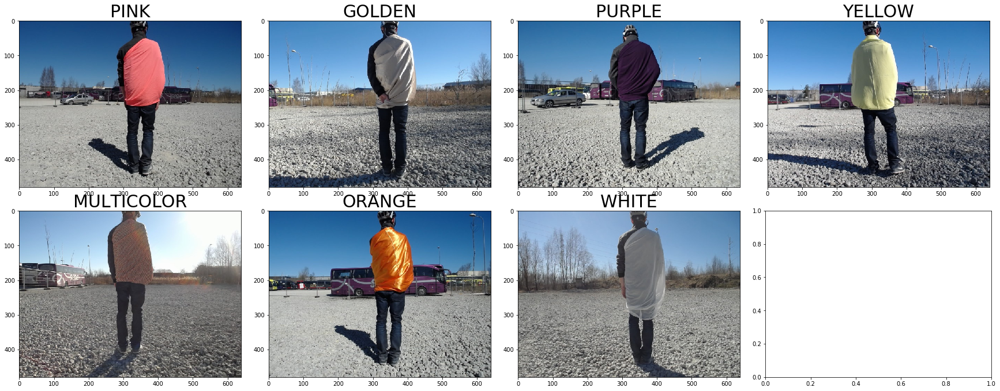

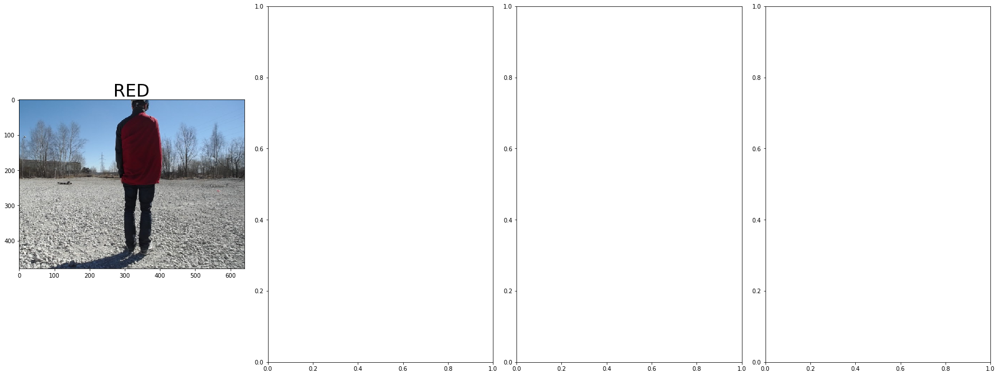

In [7]:
def show_example_images(data):
    f, ax = get_subplot_configuration(len(data.keys()))
    subplot_row_counter = 0
    subplot_column_counter = 0
    for color in data.keys():
        example_img_path = data[color].target_example_img
        img = utils.get_img_in_RGB(example_img_path)
        if hasattr(ax[0], '__len__'):
            ax[subplot_row_counter][subplot_column_counter].imshow(img)
            ax[subplot_row_counter][subplot_column_counter].set_title(color, fontsize=30)
            subplot_column_counter += 1
            if subplot_column_counter > len(ax[0])-1:
                subplot_column_counter = 0
                subplot_row_counter += 1
        else:
            ax[subplot_column_counter].imshow(img)
            ax[subplot_column_counter].set_title(color, fontsize=30)
            subplot_column_counter += 1
            
show_example_images(training_data)
show_example_images(testing_data)

## Show amount of data

Training data
Average - 12168.1428571
Maximum - YELLOW - 13094
Minimum - ORANGE - 11254
Testing data
Average - 11265.0
Maximum - RED - 11265
Minimum - RED - 11265


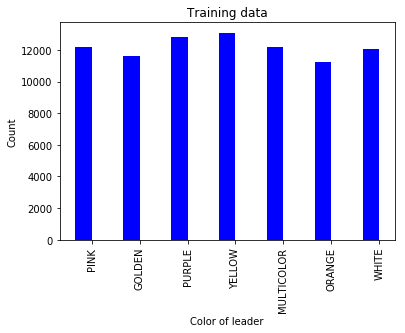

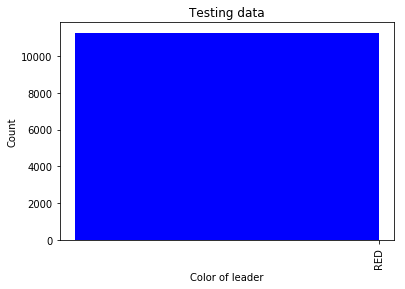

In [8]:
def show_amount_of_data_per_color(data, plot_title):    
    color_data_amounts = []
    color_names = []
    for color in data.keys():
        color_names.append(color)
        color_data_amounts.append(data[color].amount_of_data_per_color())
    ind = np.arange(len(color_names))  # the x locations for the groups
    width = 0.35       # the width of the bars
    fig, ax = plt.subplots()
    rects = ax.bar(ind, color_data_amounts, width, color='b')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(color_names, rotation='vertical')
    ax.set_ylabel('Count')
    ax.set_xlabel('Color of leader')
    ax.set_title(plot_title)
    ax.grid(False)
    most_samples_index = np.argmax(np.array(color_data_amounts))
    least_samples_index = np.argmin(np.array(color_data_amounts))
    print(plot_title)
    print("Average - " + str(np.mean(np.array(color_data_amounts))))
    print("Maximum - " + str(color_names[most_samples_index] + " - " + str(color_data_amounts[most_samples_index])))
    print("Minimum - " + str(color_names[least_samples_index] + " - " + str(color_data_amounts[least_samples_index])))

show_amount_of_data_per_color(training_data, 'Training data')
show_amount_of_data_per_color(testing_data, 'Testing data')

## Throw out unusable commands from data

PINK - 144
GOLDEN - 33
PURPLE - 60
YELLOW - 95
MULTICOLOR - 80
ORANGE - 116
WHITE - 96
On average thrown out - 89.1428571429
RED - 64
On average thrown out - 64.0
Training data
Average - 12079.0
Maximum - YELLOW - 12999
Minimum - ORANGE - 11138
Testing data
Average - 11201.0
Maximum - RED - 11201
Minimum - RED - 11201


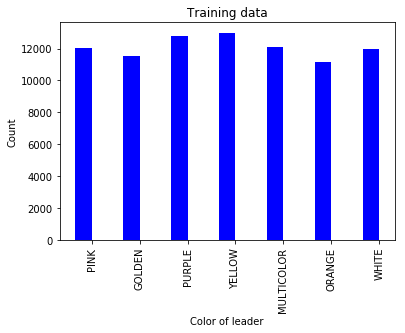

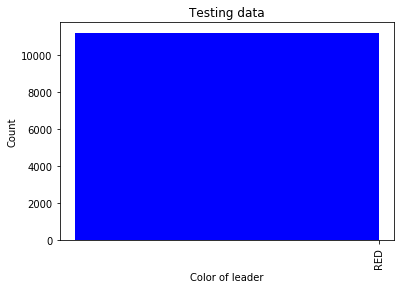

In [9]:
def throw_out_commands(data):
    thrown_out_amounts = []
    for color, color_holder in data.iteritems():
        amount_thrown_out = color_holder.throw_out_unusable_commands()
        print(color + " - " + str(amount_thrown_out))
        thrown_out_amounts.append(amount_thrown_out)
    print("On average thrown out - " + str(np.mean(np.array(thrown_out_amounts))))

throw_out_commands(training_data)
throw_out_commands(testing_data)

show_amount_of_data_per_color(training_data, 'Training data')
show_amount_of_data_per_color(testing_data, 'Testing data')

## Show how turning commands are distributed based on tracked angle

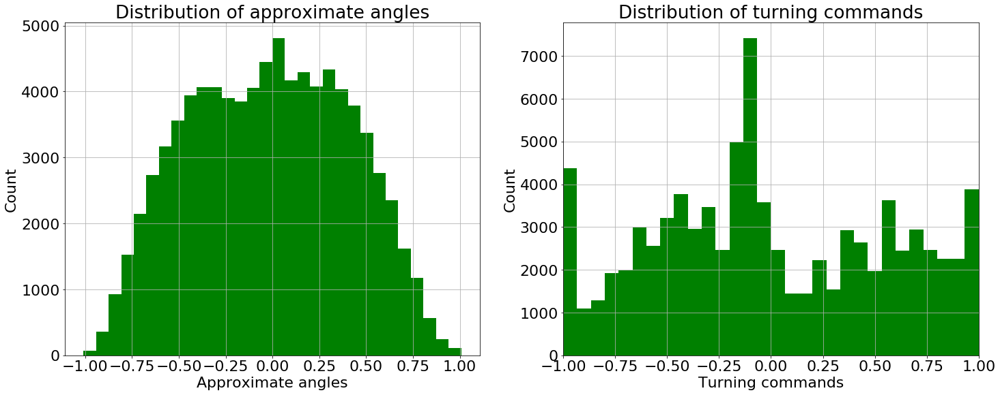

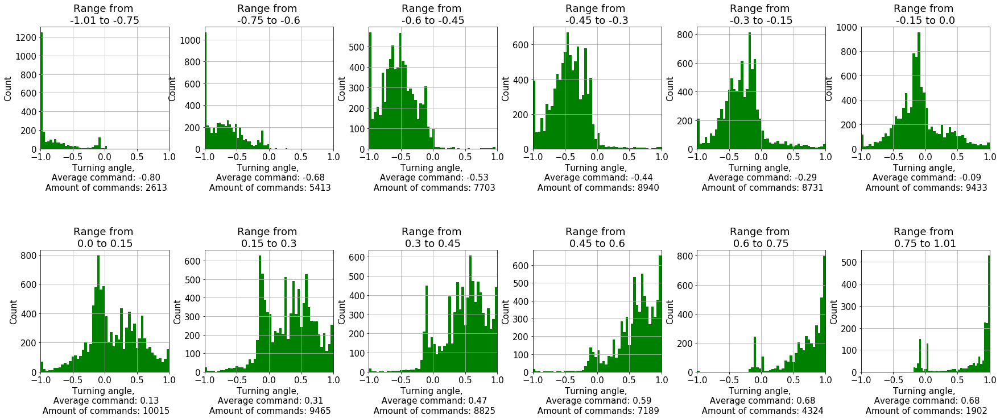

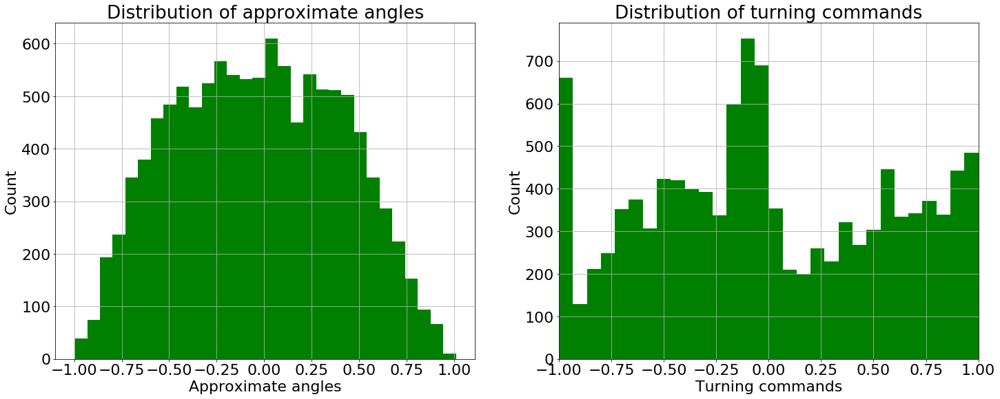

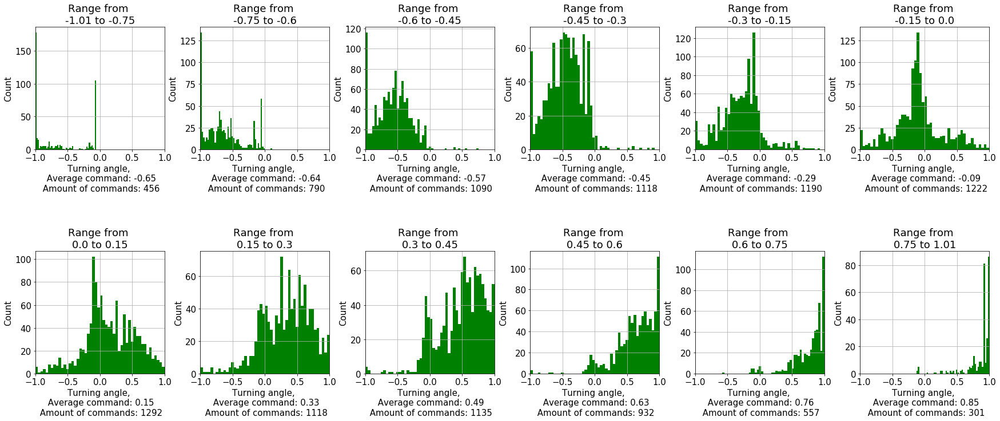

In [10]:
def show_turning_and_angle_distribution(data, data_name):
    all_angles = []
    all_turning_commands = []
    for color, color_holder in data.iteritems():
        for folder_path, data_holder in color_holder.data_holders.iteritems():
            all_angles += data_holder.tracked_angles
            all_turning_commands += data_holder.turning_commands

    matplotlib.rcParams.update({'font.size': 22})
    f, ax = plt.subplots(1, 2, figsize=(24, 9))
    ax[0].hist(all_angles, 30, facecolor='green')
    ax[0].set_xlabel('Approximate angles')
    ax[0].set_ylabel('Count')
    ax[0].set_title('Distribution of approximate angles')
    ax[0].grid(True)
    ax[1].hist(all_turning_commands, 30, facecolor='green')
    ax[1].set_xlabel('Turning commands')
    ax[1].set_ylabel('Count')
    ax[1].set_title('Distribution of turning commands')
    ax[1].set_xlim(-1.0,1.0)
    ax[1].grid(True)

    matplotlib.rcParams.update({'font.size': 15})

    all_turning_commands = np.array(all_turning_commands)

    angle_bin_place = np.digitize(all_angles, TARGET_ANGLE_BIN_RANGES)
    f, ax = plt.subplots(2, (len(TARGET_ANGLE_BIN_RANGES) - 1)/2, figsize=(24, 9))
    f.tight_layout(pad=0.4, w_pad=1.0, h_pad=10.0)
    subplot_row_counter = 0
    subplot_column_counter = 0
    for bin_number in np.sort(np.unique(angle_bin_place)):
        if bin_number != 0 and bin_number != len(TARGET_ANGLE_BIN_RANGES):
            indices_for_bin = np.where(angle_bin_place == bin_number)[0]
            turning_commands_in_bin = list(all_turning_commands[indices_for_bin])
            average_turning_command = sum(turning_commands_in_bin) / float(len(turning_commands_in_bin))
            amount_of_commands = len(turning_commands_in_bin)
            ax[subplot_row_counter][subplot_column_counter].hist(turning_commands_in_bin, 50, facecolor='green')
            ax[subplot_row_counter][subplot_column_counter].set_xlabel('Turning angle, \n Average command: ' + "{0:.2f}".format(average_turning_command) + "\n Amount of commands: " + str(amount_of_commands))
            ax[subplot_row_counter][subplot_column_counter].set_ylabel('Count')
            ax[subplot_row_counter][subplot_column_counter].set_title('Range from \n' + str(TARGET_ANGLE_BIN_RANGES[bin_number-1]) + " to " + str(TARGET_ANGLE_BIN_RANGES[bin_number]))
            ax[subplot_row_counter][subplot_column_counter].grid(True)
            ax[subplot_row_counter][subplot_column_counter].set_xlim(-1.0,1.0)
            subplot_column_counter += 1
            if subplot_column_counter > len(ax[0])-1:
                subplot_column_counter = 0
                subplot_row_counter += 1

show_turning_and_angle_distribution(training_data, 'Training data ')
show_turning_and_angle_distribution(testing_data, 'Testing data ')

## Show how velocity commands are distributed based on bboxes

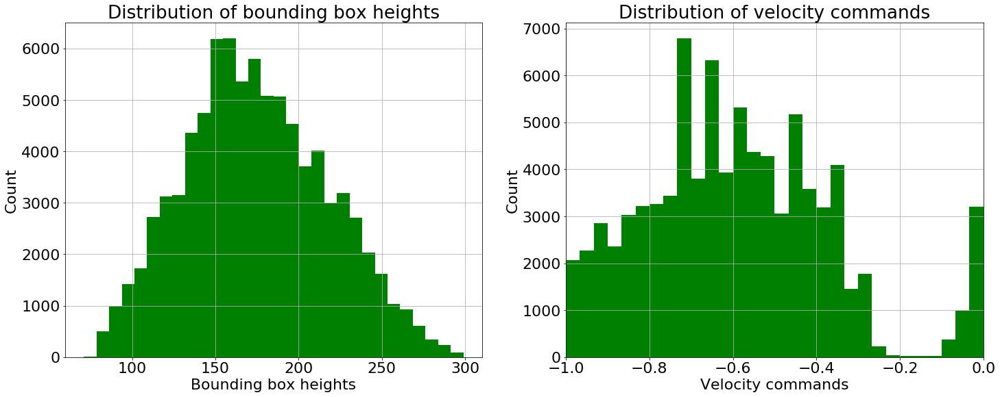

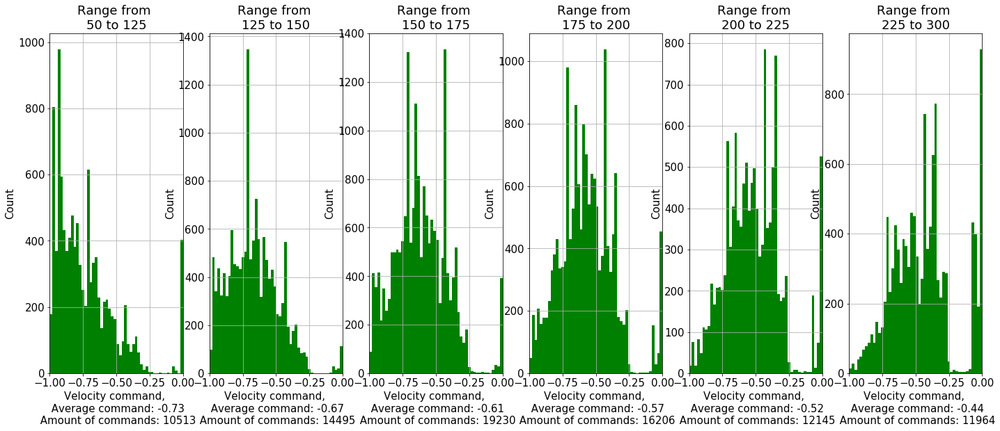

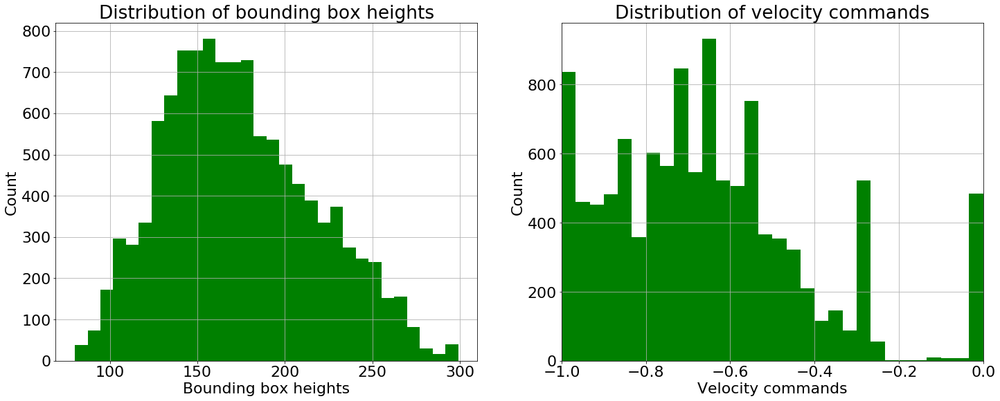

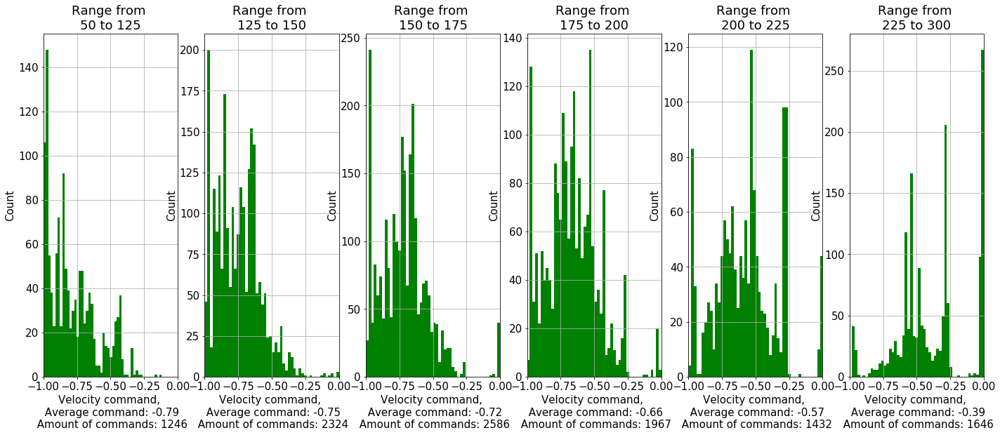

In [11]:
def show_velocity_and_bbox_height_distribution(data, data_name):
    all_bboxes = []
    all_velocity_commands = []
    for color, color_holder in data.iteritems():
        for folder_path, data_holder in color_holder.data_holders.iteritems():
            all_bboxes += data_holder.tracked_bboxes
            all_velocity_commands += data_holder.velocity_commands

    for i in range(len(all_velocity_commands)):
        velocity_command = all_velocity_commands[i]
        if velocity_command > 0.0:
            all_velocity_commands[i] = 0.0

    all_bbox_heights = []
    for bbox in all_bboxes:
        all_bbox_heights.append(bbox[3]-bbox[1])

    matplotlib.rcParams.update({'font.size': 22})

    f, ax = plt.subplots(1, 2, figsize=(24, 9))
    ax[0].hist(all_bbox_heights, 30, facecolor='green')
    ax[0].set_xlabel('Bounding box heights')
    ax[0].set_ylabel('Count')
    ax[0].set_title('Distribution of bounding box heights')
    ax[0].grid(True)
    ax[1].hist(all_velocity_commands, 30, facecolor='green')
    ax[1].set_xlabel('Velocity commands')
    ax[1].set_ylabel('Count')
    ax[1].set_title('Distribution of velocity commands')
    ax[1].set_xlim(-1.0,0.0)
    ax[1].grid(True)

    matplotlib.rcParams.update({'font.size': 15})

    all_velocity_commands = np.array(all_velocity_commands)

    bbox_bin_place = np.digitize(all_bbox_heights, TARGET_BOUNDING_BOX_BIN_RANGES)
    f, ax = plt.subplots(1, len(TARGET_BOUNDING_BOX_BIN_RANGES) - 1, figsize=(24, 9))
    for bin_number in np.sort(np.unique(bbox_bin_place)):
        if bin_number != 0 and bin_number != len(TARGET_BOUNDING_BOX_BIN_RANGES):
            indices_for_bin = np.where(bbox_bin_place == bin_number)[0]
            velocity_commands_in_bin = list(all_velocity_commands[indices_for_bin])
            average_velocity_command = sum(velocity_commands_in_bin) / float(len(velocity_commands_in_bin))
            amount_of_commands = len(velocity_commands_in_bin)
            ax[bin_number-1].hist(velocity_commands_in_bin, 50, facecolor='green')
            ax[bin_number-1].set_xlabel('Velocity command, \n Average command: ' + "{0:.2f}".format(average_velocity_command) + "\n Amount of commands: " + str(amount_of_commands))
            ax[bin_number-1].set_ylabel('Count')
            ax[bin_number-1].set_title('Range from \n' + str(TARGET_BOUNDING_BOX_BIN_RANGES[bin_number-1]) + " to " + str(TARGET_BOUNDING_BOX_BIN_RANGES[bin_number]))
            ax[bin_number-1].grid(True)
            ax[bin_number-1].set_xlim(-1.0,0.0)

show_velocity_and_bbox_height_distribution(training_data, 'Training data ')
show_velocity_and_bbox_height_distribution(testing_data, 'Testing data ')

## Mark those images which can be used as extra targets

In [12]:
def mark_images_that_can_be_used_as_targets(data):
    for color in data.keys():
        color_holder = data[color]
        for folder_path, data_holder in color_holder.data_holders.items():
            data_holder.mark_suitable_images_for_targets(CORRECT_TARGET_ANGLE_RANGE, CORRECT_TARGET_BBOX_RANGE)
        print(color + " -  Total: " + str(color_holder.amount_of_data_per_color()) + ", Suitable for targets: " + str(color_holder.get_amount_of_suitable_images_for_targets()))

mark_images_that_can_be_used_as_targets(training_data)
mark_images_that_can_be_used_as_targets(testing_data)

PINK -  Total: 12043, Suitable for targets: 1444
GOLDEN -  Total: 11552, Suitable for targets: 1098
PURPLE -  Total: 12770, Suitable for targets: 2022
YELLOW -  Total: 12999, Suitable for targets: 1638
MULTICOLOR -  Total: 12101, Suitable for targets: 2364
ORANGE -  Total: 11138, Suitable for targets: 1265
WHITE -  Total: 11950, Suitable for targets: 1290
RED -  Total: 11201, Suitable for targets: 1412


## Display the distribution of data

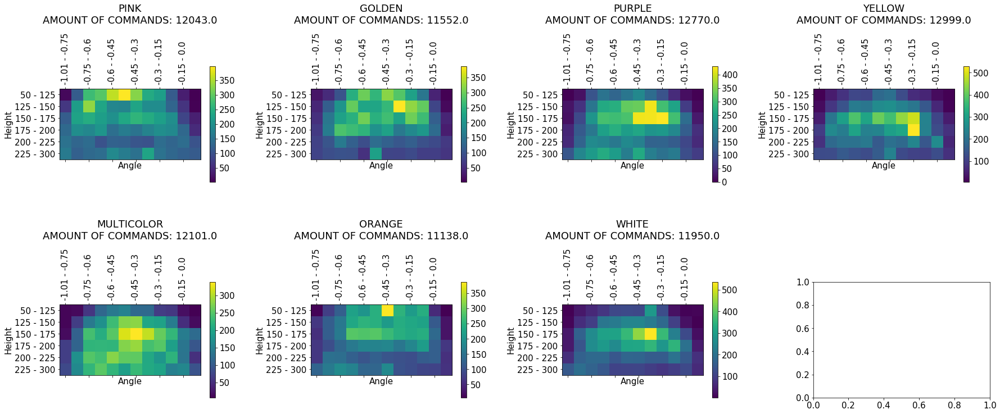

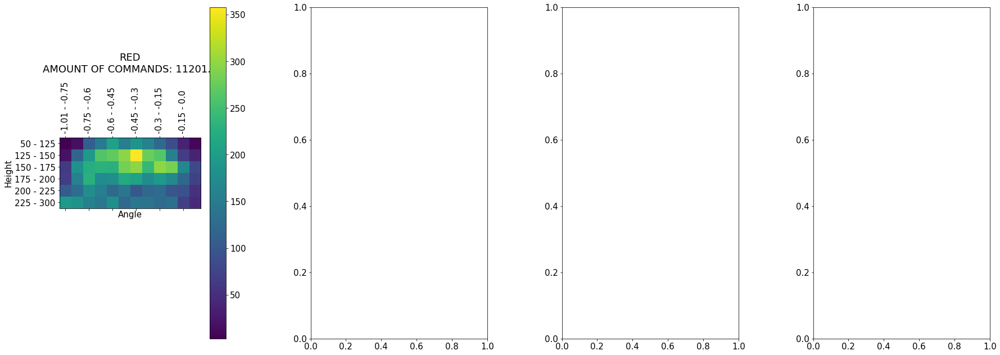

In [13]:
def display_distribution_of_data(data, display_training=False, use_bbox_bins=False):
    f, ax = get_subplot_configuration(len(data.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    subplot_row_counter = 0
    subplot_column_counter = 0
    for color, color_holder in data.iteritems():
        if hasattr(ax[0], '__len__'):
            current_ax = ax[subplot_row_counter][subplot_column_counter]
        else:
            current_ax = ax[subplot_column_counter]
        subplot_column_counter += 1
        if hasattr(ax[0], '__len__'):
            if subplot_column_counter > len(ax[0])-1:
                subplot_column_counter = 0
                subplot_row_counter += 1
        if use_bbox_bins:
            color_holder.visualize_bbox_bin_counts(f,current_ax, display_training)
        else:
            color_holder.visualize_color_data_bin_counts(f,current_ax, display_training)
display_distribution_of_data(training_data, use_bbox_bins=USE_BBOX_BINS)
display_distribution_of_data(testing_data, use_bbox_bins=USE_BBOX_BINS)



## Cap data distribution

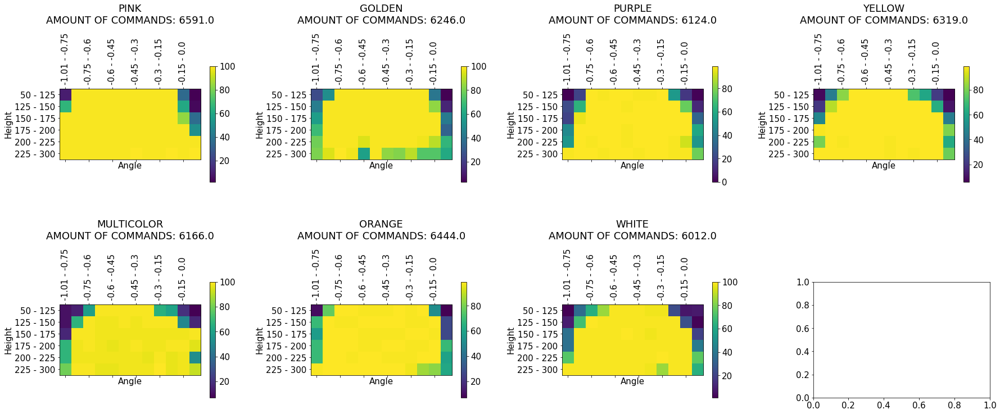

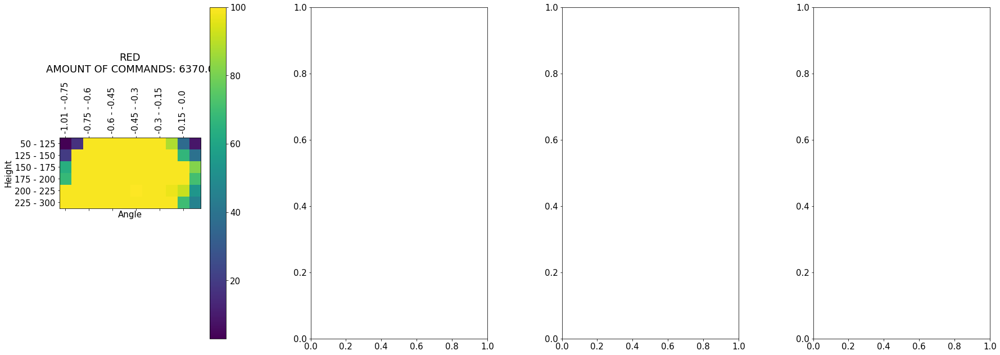

In [14]:
def cap_data_distribution_and_visualize_result(data, use_bbox_bins=False):
    for color, color_holder in data.iteritems():
        if use_bbox_bins:
            color_holder.determine_bbox_training_samples_based_on_threshold(DATA_CAP_THRESHOLD)
            color_holder.calculate_bbox_training_bin_count_matrix()
        else:
            color_holder.determine_training_samples_based_on_threshold(DATA_CAP_THRESHOLD)
            color_holder.calculate_training_bin_count_matrix()
    display_distribution_of_data(data, display_training=True,use_bbox_bins=use_bbox_bins)
  
cap_data_distribution_and_visualize_result(training_data, use_bbox_bins=USE_BBOX_BINS)
cap_data_distribution_and_visualize_result(testing_data, use_bbox_bins=USE_BBOX_BINS)

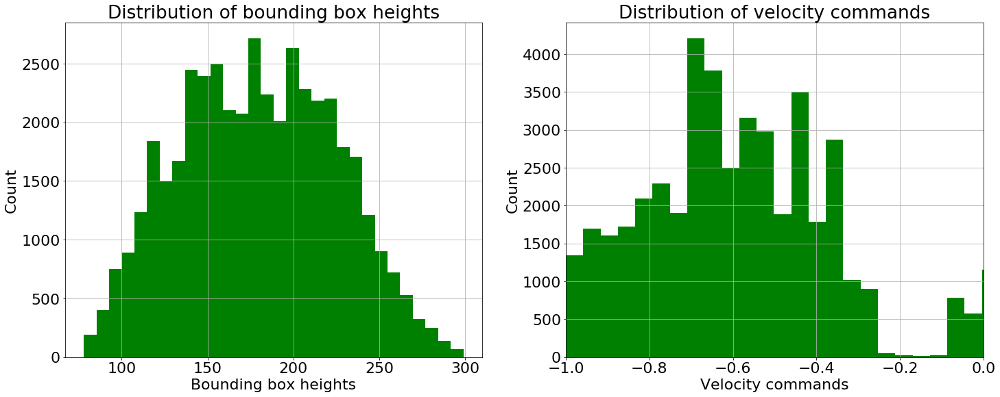

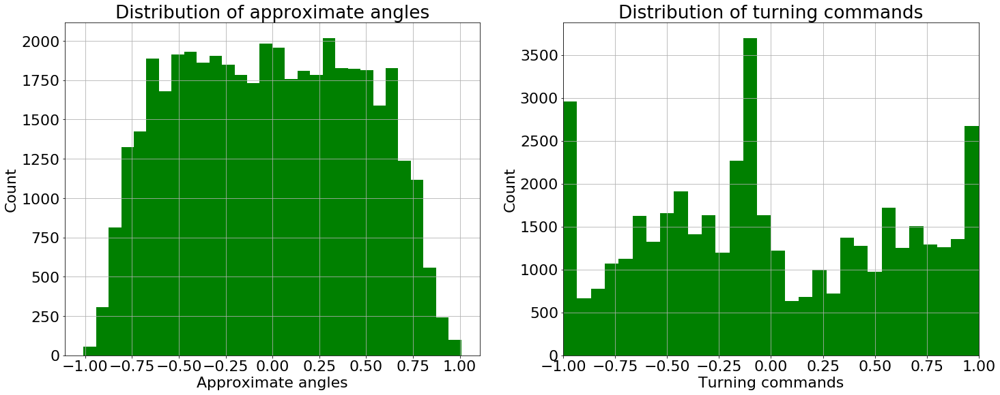

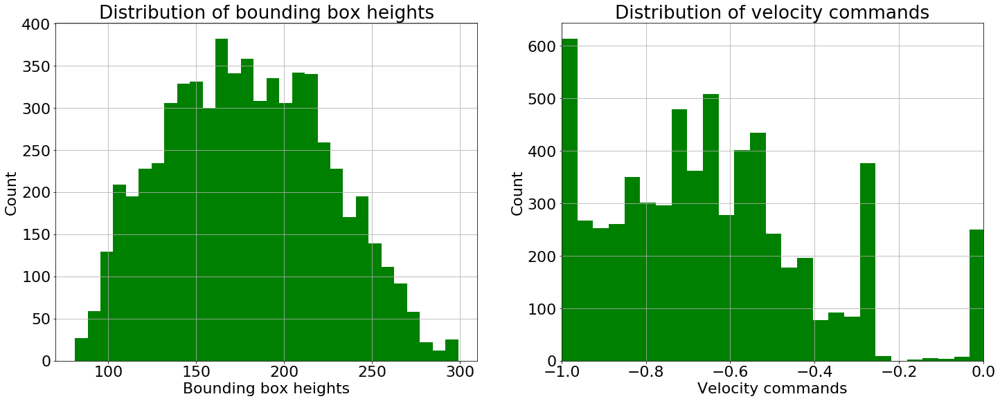

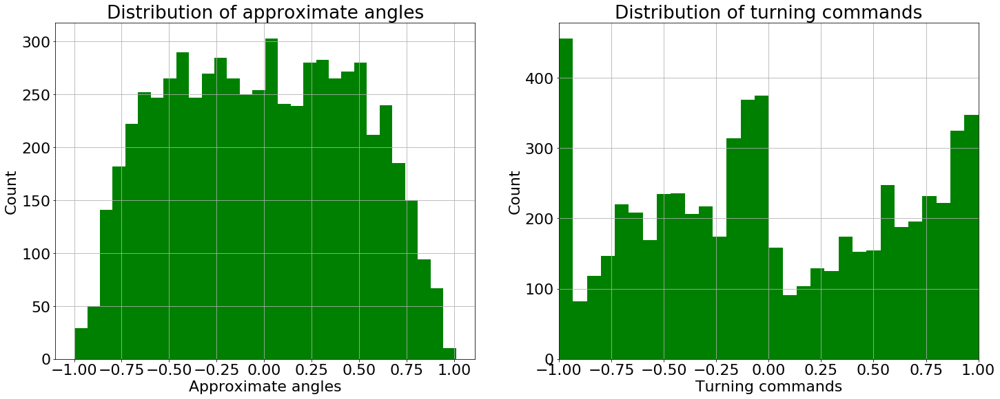

In [15]:
def show_distribution_of_commands_and_bboxes_after_capping(data, use_bbox_bins=False):
    all_velocity_commands = []
    all_turning_commands = []
    all_bbox_heights = []
    all_bbox_angles = []
    for color, color_holder in data.iteritems():
        for folder_name, data_holder in color_holder.data_holders.iteritems():
            data_holder_indices_for_training = None
            if use_bbox_bins:
                data_holder_indices_for_training = data_holder.bbox_indices_for_training
            else:
                data_holder_indices_for_training = data_holder.indices_for_training
            for index_for_training in sorted(data_holder_indices_for_training):
                all_velocity_commands.append(data_holder.velocity_commands[index_for_training])
                all_turning_commands.append(data_holder.turning_commands[index_for_training])
                all_bbox_heights.append(data_holder.bbox_heights[index_for_training])
                all_bbox_angles.append(data_holder.tracked_angles[index_for_training])
            matplotlib.rcParams.update({'font.size': 22})

    f, ax = plt.subplots(1, 2, figsize=(24, 9))
    ax[0].hist(all_bbox_heights, 30, facecolor='green')
    ax[0].set_xlabel('Bounding box heights')
    ax[0].set_ylabel('Count')
    ax[0].set_title('Distribution of bounding box heights')
    ax[0].grid(True)
    ax[1].hist(all_velocity_commands, 30, facecolor='green')
    ax[1].set_xlabel('Velocity commands')
    ax[1].set_ylabel('Count')
    ax[1].set_title('Distribution of velocity commands')
    ax[1].set_xlim(-1.0,0.0)
    ax[1].grid(True)

    matplotlib.rcParams.update({'font.size': 22})
    f2, ax2 = plt.subplots(1, 2, figsize=(24, 9))
    ax2[0].hist(all_bbox_angles, 30, facecolor='green')
    ax2[0].set_xlabel('Approximate angles')
    ax2[0].set_ylabel('Count')
    ax2[0].set_title('Distribution of approximate angles')
    ax2[0].grid(True)
    ax2[1].hist(all_turning_commands, 30, facecolor='green')
    ax2[1].set_xlabel('Turning commands')
    ax2[1].set_ylabel('Count')
    ax2[1].set_title('Distribution of turning commands')
    ax2[1].set_xlim(-1.0,1.0)
    ax2[1].grid(True)
            
show_distribution_of_commands_and_bboxes_after_capping(training_data, use_bbox_bins=USE_BBOX_BINS)
show_distribution_of_commands_and_bboxes_after_capping(testing_data, use_bbox_bins=USE_BBOX_BINS)

## Show what percentage of data was kept after capping

In [ ]:
def percentage_of_data_after_kept(data, use_bbox_bins=False):
    kept_percentage = []
    for color, color_holder in data.iteritems():
        if use_bbox_bins:
            total_data_count = color_holder.bbox_bin_count_matrix.sum()
            training_data_count = color_holder.bbox_training_bin_count_matrix.sum()
        else:
            total_data_count = color_holder.bin_count_matrix.sum()
            training_data_count = color_holder.training_bin_count_matrix.sum()
        kept = training_data_count/float(total_data_count)
        print(color + " kept: " + str(kept))
        kept_percentage.append(kept)
    print("Total average percentage kept: " + str(np.mean(np.array(kept_percentage))))
    
percentage_of_data_after_kept(training_data, use_bbox_bins=USE_BBOX_BINS)
percentage_of_data_after_kept(testing_data, use_bbox_bins=USE_BBOX_BINS)

PINK kept: 0.547288881508
GOLDEN kept: 0.540685595568
PURPLE kept: 0.4795614722
YELLOW kept: 0.486114316486
MULTICOLOR kept: 0.50954466573
ORANGE kept: 0.578559885078
WHITE kept: 0.50309623431
Total average percentage kept: 0.520693007269
RED kept: 0.568699223284
Total average percentage kept: 0.568699223284


## Predict convolution outputs with base network for training data

In [ ]:
base_network = neural_network.get_base_network(IMAGENET_MODEL, MODEL_INPUT_DIMENSIONS)

def predict_conv_outputs_if_nonexistent(data, base_network):
    for color, color_holder in data.items():
        print(color)
        for folder_path, data_holder in color_holder.data_holders.iteritems():
            print(folder_path)
            for position, target_img_path in data_holder.initial_target_position_images.iteritems():
                neural_network.predict_or_load_conv_output_from_memory(target_img_path, base_network)
            for live_image_path in data_holder.live_images:
                neural_network.predict_or_load_conv_output_from_memory(live_image_path, base_network)
                
predict_conv_outputs_if_nonexistent(training_data, base_network)
predict_conv_outputs_if_nonexistent(testing_data, base_network)

## Dataset creation

In [ ]:
def get_params_filenames(data_folder):
    filenames = []
    for f in os.listdir(data_folder):
        if re.match("params_", f):
            filenames.append(f)
    return filenames

def find_dataset_timestamp_with_same_params(data_folder=None, data_cap_threshold=None, use_stay_imgs=None, which_model=None, which_targets_to_use=None, target_folders=None,
                                 use_extra_targets=None, stay_data_compared_to_other_data=None, correct_target_angle_range=None,
                                 correct_target_bbox_range=None, weigh_samples_based_on_frequency=None, data_build_mode=None,
                                 training_colors=None, val_color=None, testing_colors=None):
    filenames = get_params_filenames(data_folder)
    for filename in filenames:
        params_dict = pickle.load(open(data_folder + filename, "rb" ))
        if params_dict["DATA_CAP_THRESHOLD"] == data_cap_threshold and params_dict["USE_STAY_IMGS"] == use_stay_imgs and \
        params_dict["WHICH_MODEL"] == which_model and \
        np.array_equal(params_dict["WHICH_TARGETS_TO_USE"], which_targets_to_use) and \
        params_dict["TARGET_FOLDERS"] == target_folders and \
        params_dict["USE_EXTRA_TARGETS"] == use_extra_targets and \
        params_dict["STAY_DATA_COMPARED_TO_OTHER_DATA"] == stay_data_compared_to_other_data and \
        np.array_equal(params_dict["CORRECT_TARGET_ANGLE_RANGE"], correct_target_angle_range) and \
        np.array_equal(params_dict["CORRECT_TARGET_BBOX_RANGE"], correct_target_bbox_range) and \
        params_dict["WEIGH_SAMPLES_BASED_ON_FREQUENCY"] == weigh_samples_based_on_frequency and \
        params_dict["DATA_BUILD_MODE"] == data_build_mode and \
        set(params_dict["TRAINING_COLORS"]) == set(training_colors) and \
        params_dict["VAL_COLOR"] == val_color and \
        set(params_dict["TESTING_COLORS"]) == set(testing_colors) and \
        params_dict["USE_BBOX_BINS"] == USE_BBOX_BINS:
            return filename.split("_")[1].split(".p")[0]
    return None

def convert_image_paths_to_conv_outputs(image_paths, which_model):
    live_image_convs = []
    base_network = neural_network.get_base_network(POSSIBLE_MODELS[which_model], POSSIBLE_MODEL_INPUT_DIMENSIONS[which_model])
    for image_path in image_paths:
        live_image_conv = neural_network.predict_or_load_conv_output_from_memory(image_path, base_network)
        live_image_convs.append(live_image_conv)
    return live_image_convs

def create_training_validation_sets_only_live(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, bbox_heights_dict, bbox_angle_dict):
    train_x = []
    train_y = []
    val_x = None
    val_y = None
    train_vel_bins = []
    train_turn_bins = []
    val_vel_bins = []
    val_turn_bins = []
    train_bbox_heights = []
    train_bbox_angles = []
    val_bbox_heights = []
    val_bbox_angles = []
    for color, color_holder in training_data.items():
        if color == validation_color:
            val_x = live_image_convs_dict[validation_color]
            val_y = zip(velocity_commands_dict[validation_color], turning_commands_dict[validation_color])
            val_bbox_heights = bbox_heights_dict[color]
            val_bbox_angles = bbox_angle_dict[color]
        else:
            train_x += live_image_convs_dict[color]
            train_y += zip(velocity_commands_dict[color], turning_commands_dict[color])
            train_bbox_heights += bbox_heights_dict[color]
            train_bbox_angles += bbox_angle_dict[color]
    val_vel_bins = np.digitize([i[0] for i in val_y], VELOCITY_COMMAND_BIN_RANGES)
    val_turn_bins = np.digitize([i[1] for i in val_y], TURNING_COMMAND_BIN_RANGES)
    train_vel_bins = np.digitize([i[0] for i in train_y], VELOCITY_COMMAND_BIN_RANGES)
    train_turn_bins = np.digitize([i[1] for i in train_y], TURNING_COMMAND_BIN_RANGES)
    sample_weights = []
    if USE_BBOX_BINS:
        train_bbox_heights_bins = np.digitize(train_bbox_heights, TARGET_BOUNDING_BOX_BIN_RANGES)
        train_bbox_angles_bins = np.digitize(train_bbox_angles, TARGET_ANGLE_BIN_RANGES)
        for height_bin, angle_bin in zip(train_bbox_heights_bins, train_bbox_angles_bins):
            height_indices = np.where(train_bbox_heights_bins == height_bin)[0]
            angle_indices = np.where(train_bbox_angles_bins == angle_bin)[0]
            amount_in_bin = len(list(set(height_indices).intersection(angle_indices)))
            sample_weights.append(1-(amount_in_bin/float(len(zip(train_bbox_heights_bins, train_bbox_angles_bins)))))
    else:
        for vel_bin, turn_bin in zip(train_vel_bins, train_turn_bins):
            velocity_indices = np.where(train_vel_bins == vel_bin)[0]
            turning_indices = np.where(train_turn_bins == turn_bin)[0]
            amount_in_bin = len(list(set(velocity_indices).intersection(turning_indices)))
            sample_weights.append(1-(amount_in_bin/float(len(zip(train_vel_bins, train_turn_bins)))))
    train_x = np.squeeze(np.array(train_x), axis=1)
    val_x = np.squeeze(np.array(val_x), axis=1)
    return (train_x, train_y, sample_weights, val_x, val_y, val_vel_bins, val_turn_bins, train_bbox_heights, train_bbox_angles, val_bbox_heights, val_bbox_angles)

def create_testing_sets_only_live(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_bbox_heights_dict, testing_bbox_angle_dict):
    test_x = []
    test_y = []
    test_vel_bins = []
    test_turn_bins = []
    test_bbox_heights = []
    test_bbox_angles = []
    for color in testing_data.keys():
        test_x += testing_live_image_convs_dict[color]
        test_y += zip(testing_velocity_commands_dict[color], testing_turning_commands_dict[color])
        test_bbox_heights += testing_bbox_heights_dict[color]
        test_bbox_angles += testing_bbox_angle_dict[color]
    test_vel_bins = np.digitize([i[0] for i in test_y], VELOCITY_COMMAND_BIN_RANGES)
    test_turn_bins = np.digitize([i[1] for i in test_y], TURNING_COMMAND_BIN_RANGES)
    test_x = np.squeeze(np.array(test_x), axis=1)
    return (test_x, test_y, test_vel_bins, test_turn_bins, test_bbox_heights, test_bbox_angles)

def create_training_validation_sets_comparison_only(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict):
    train_x = []
    train_x0 = []
    train_x1 = []
    train_y = []
    val_x = []
    val_x0 = []
    val_x1 = []
    val_y = []
    val_bbox_heights = []
    val_bbox_angles = []
    colors = training_data.keys()
    non_validation_colors = colors[:]
    non_validation_colors.remove(validation_color)
    amount_in_dicts = 0
    for color, color_holder in training_data.items():
        amount_in_dicts += len(live_image_convs_dict[color])
        if color == validation_color:
            for idx, live_image_conv in enumerate(live_image_convs_dict[color]):
                if USE_EXTRA_TARGETS:
                    other_color = random.choice(non_validation_colors)
                    #First put together with same color pair
                    val_x0.append(np.array(random.choice(extra_targets_convs_dict[color])))
                    val_x1.append(np.array(live_image_conv))
                    #Put together with different color pair
                    val_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                    val_x1.append(np.array(live_image_conv))
                    val_y.append([1])
                    val_y.append([0])
                    val_bbox_heights.append(bbox_heights_dict[color][idx])
                    val_bbox_heights.append(bbox_heights_dict[color][idx])
                    val_bbox_angles.append(bbox_angle_dict[color][idx])
                    val_bbox_angles.append(bbox_angle_dict[color][idx])
                else:
                    raise ValueError('Gives bad results')
        else:
            for idx, live_image_conv in enumerate(live_image_convs_dict[color]):
                if USE_EXTRA_TARGETS:
                    non_validation_without_current_color = non_validation_colors[:]
                    non_validation_without_current_color.remove(color)
                    other_color = random.choice(non_validation_without_current_color)
                    #First put together with same color pair
                    train_x0.append(np.array(random.choice(extra_targets_convs_dict[color])))
                    train_x1.append(np.array(live_image_conv))
                    #Put together with different color pair
                    train_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                    train_x1.append(np.array(live_image_conv))
                    train_y.append([1])
                    train_y.append([0])
                else:
                    raise ValueError('Gives bad results')
    val_x = [np.squeeze(np.array(val_x0), axis=1), np.squeeze(np.array(val_x1), axis=1)]
    train_x = [np.squeeze(np.array(train_x0), axis=1), np.squeeze(np.array(train_x1), axis=1)]
    return (train_x, train_y, val_x, val_y, val_bbox_heights, val_bbox_angles)

def create_testing_sets_comparison_only(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_extra_targets_convs_dict, testing_original_targets_convs_dict, testing_bbox_heights_dict, testing_bbox_angle_dict, 
                                                                 training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict):
    test_x = []
    test_x0 = []
    test_x1 = []
    test_y = []
    test_bbox_heights = []
    test_bbox_angles = []
    non_testing_colors = training_data.keys()
    for color, color_holder in testing_data.items():
        for idx, live_image_conv in enumerate(testing_live_image_convs_dict[color]):
            if USE_EXTRA_TARGETS:
                other_color = random.choice(non_testing_colors)
                if len(test_x) == 0:
                    #First put together with same color pair
                    test_x1.append(np.array(random.choice(testing_extra_targets_convs_dict[color])))
                    test_x0.append(np.array(live_image_conv))
                    #Put together with different color pair
                    test_x1.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                    test_x0.append(np.array(live_image_conv))
                    test_y.append([1])
                    test_y.append([0])
                    test_bbox_heights.append(testing_bbox_heights_dict[color][idx])
                    test_bbox_heights.append(testing_bbox_heights_dict[color][idx])
                    test_bbox_angles.append(testing_bbox_angle_dict[color][idx])
                    test_bbox_angles.append(testing_bbox_angle_dict[color][idx])
            else:
                raise ValueError('Gives bad results')
    test_x = [np.squeeze(np.array(test_x0), axis=1), np.squeeze(np.array(test_x1), axis=1)]
    return (test_x, test_y, test_bbox_heights, test_bbox_angles)

def create_training_validation_sets_vel_turn_only(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict):
    train_x = []
    train_x0 = []
    train_x1 = []
    train_y = []
    val_x = []
    val_x0 = []
    val_x1 = []
    val_y = []
    train_vel_bins = []
    train_turn_bins = []
    val_vel_bins = []
    val_turn_bins = []
    train_bbox_heights = []
    train_bbox_angles = []
    val_bbox_heights = []
    val_bbox_angles = []
    colors = training_data.keys()
    non_validation_colors = colors[:]
    non_validation_colors.remove(validation_color)
    for color, color_holder in training_data.items():
        if color == validation_color:
            for idx, live_image_conv in enumerate(live_image_convs_dict[color]):
                velocity_command = velocity_commands_dict[color][idx]
                turning_command = turning_commands_dict[color][idx]
                other_color = random.choice(non_validation_colors)
                if USE_EXTRA_TARGETS:
                    other_color = random.choice(non_validation_colors)
                    #First put together with same color pair
                    val_x0.append(np.array(random.choice(extra_targets_convs_dict[color])))
                    val_x1.append(np.array(live_image_conv))
                    #Put together with different color pair
                    val_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                    val_x1.append(np.array(live_image_conv))
                    val_y.append((velocity_command,turning_command))
                    val_y.append((0.0,0.0))
                    val_bbox_heights.append(bbox_heights_dict[color][idx])
                    val_bbox_heights.append(bbox_heights_dict[color][idx])
                    val_bbox_angles.append(bbox_angle_dict[color][idx])
                    val_bbox_angles.append(bbox_angle_dict[color][idx])
                else:
                    raise ValueError('Gives bad results')
        else:
            for idx, live_image_conv in enumerate(live_image_convs_dict[color]):
                velocity_command = velocity_commands_dict[color][idx]
                turning_command = turning_commands_dict[color][idx]
                non_validation_without_current_color = non_validation_colors[:]
                non_validation_without_current_color.remove(color)
                other_color = random.choice(non_validation_without_current_color)
                if USE_EXTRA_TARGETS:
                    if len(train_x) == 0:
                        #First put together with same color pair
                        train_x0.append(np.array(random.choice(extra_targets_convs_dict[color])))
                        train_x1.append(np.array(live_image_conv))
                        #Put together with different color pair
                        train_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                        train_x1.append(np.array(live_image_conv))
                        train_y.append((velocity_command,turning_command))
                        train_y.append((0.0,0.0))
                        train_bbox_heights.append(bbox_heights_dict[color][idx])
                        train_bbox_heights.append(bbox_heights_dict[color][idx])
                        train_bbox_angles.append(bbox_angle_dict[color][idx])
                        train_bbox_angles.append(bbox_angle_dict[color][idx])
                else:
                    raise ValueError('Gives bad results')
    val_vel_bins = np.digitize([i[0] for i in val_y], VELOCITY_COMMAND_BIN_RANGES)
    val_turn_bins = np.digitize([i[1] for i in val_y], TURNING_COMMAND_BIN_RANGES)
    train_vel_bins = np.digitize([i[0] for i in train_y], VELOCITY_COMMAND_BIN_RANGES)
    train_turn_bins = np.digitize([i[1] for i in train_y], TURNING_COMMAND_BIN_RANGES)
    
    sample_weights = []
    if USE_BBOX_BINS:
        train_bbox_heights_bins = np.digitize(train_bbox_heights, TARGET_BOUNDING_BOX_BIN_RANGES)
        train_bbox_angles_bins = np.digitize(train_bbox_angles, TARGET_ANGLE_BIN_RANGES)
        for height_bin, angle_bin in zip(train_bbox_heights_bins, train_bbox_angles_bins):
            height_indices = np.where(train_bbox_heights_bins == height_bin)[0]
            angle_indices = np.where(train_bbox_angles_bins == angle_bin)[0]
            amount_in_bin = len(list(set(height_indices).intersection(angle_indices)))
            sample_weights.append(1-(amount_in_bin/float(len(zip(train_bbox_heights_bins, train_bbox_angles_bins)))))
    else:
        for vel_bin, turn_bin in zip(train_vel_bins, train_turn_bins):
            velocity_indices = np.where(train_vel_bins == vel_bin)[0]
            turning_indices = np.where(train_turn_bins == turn_bin)[0]
            amount_in_bin = len(list(set(velocity_indices).intersection(turning_indices)))
            sample_weights.append(1-(amount_in_bin/float(len(zip(train_vel_bins, train_turn_bins)))))
    
    val_x = [np.squeeze(np.array(val_x0), axis=1), np.squeeze(np.array(val_x1), axis=1)]
    train_x = [np.squeeze(np.array(train_x0), axis=1), np.squeeze(np.array(train_x1), axis=1)]
    return (train_x, train_y, sample_weights, val_x, val_y, val_vel_bins, val_turn_bins, train_bbox_heights, train_bbox_angles, val_bbox_heights, val_bbox_angles)

def create_testing_sets_vel_turn_only(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_extra_targets_convs_dict, testing_original_targets_convs_dict, testing_bbox_heights_dict, testing_bbox_angle_dict, 
                                                                 training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict):
    test_x = []
    test_x0 = []
    test_x1 = []
    test_y = []
    test_vel_bins = []
    test_turn_bins = []
    test_bbox_heights = []
    test_bbox_angles = []
    non_testing_colors = training_data.keys()
    for color, color_holder in testing_data.items():
        for idx, live_image_conv in enumerate(testing_live_image_convs_dict[color]):
            velocity_command = testing_velocity_commands_dict[color][idx]
            turning_command = testing_turning_commands_dict[color][idx]
            if USE_EXTRA_TARGETS:
                other_color = random.choice(non_testing_colors)
                if len(test_x) == 0:
                    #First put together with same color pair
                    test_x0.append(np.array(random.choice(testing_extra_targets_convs_dict[color])))
                    test_x1.append(np.array(live_image_conv))
                    #Put together with different color pair
                    test_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                    test_x1.append(np.array(live_image_conv))
                    test_y.append((velocity_command,turning_command))
                    test_y.append((0.0,0.0))
                    test_bbox_heights.append(testing_bbox_heights_dict[color][idx])
                    test_bbox_heights.append(testing_bbox_heights_dict[color][idx])
                    test_bbox_angles.append(testing_bbox_angle_dict[color][idx])
                    test_bbox_angles.append(testing_bbox_angle_dict[color][idx])
            else:
                raise ValueError('Gives bad results')
    test_x = [np.squeeze(np.array(test_x0), axis=1), np.squeeze(np.array(test_x1), axis=1)]
    test_vel_bins = np.digitize([i[0] for i in test_y], VELOCITY_COMMAND_BIN_RANGES)
    test_turn_bins = np.digitize([i[1] for i in test_y], TURNING_COMMAND_BIN_RANGES)
    return (test_x, test_y, test_vel_bins, test_turn_bins, test_bbox_heights, test_bbox_angles)

def create_training_validation_sets_comparison_vel_turn(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict):
    train_x = []
    train_x0 = []
    train_x1 = []
    train_y = []
    train_y0 = []
    train_y1 = []
    val_x = []
    val_x0 = []
    val_x1 = []
    val_y = []
    val_y0 = []
    val_y1 = []
    train_vel_bins = []
    train_turn_bins = []
    val_vel_bins = []
    val_turn_bins = []
    train_bbox_heights = []
    train_bbox_angles = []
    val_bbox_heights = []
    val_bbox_angles = []
    colors = training_data.keys()
    non_validation_colors = colors[:]
    non_validation_colors.remove(validation_color)
    for color, color_holder in training_data.items():
        if color == validation_color:
            for idx, live_image_conv in enumerate(live_image_convs_dict[color]):
                velocity_command = velocity_commands_dict[color][idx]
                turning_command = turning_commands_dict[color][idx]
                other_color = random.choice(non_validation_colors)
                if USE_EXTRA_TARGETS:
                    #First put together with same color pair
                    val_x0.append(np.array(random.choice(extra_targets_convs_dict[color])))
                    val_x1.append(np.array(live_image_conv))
                    #Put together with different color pair
                    val_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                    val_x1.append(np.array(live_image_conv))
                    val_y0.append(np.array([1.0]))
                    val_y1.append(np.array([(velocity_command,turning_command)]))
                    val_y0.append(np.array([0.0]))
                    val_y1.append(np.array([(0.0, 0.0)]))
                    val_bbox_heights.append(bbox_heights_dict[color][idx])
                    val_bbox_heights.append(bbox_heights_dict[color][idx])
                    val_bbox_angles.append(bbox_angle_dict[color][idx])
                    val_bbox_angles.append(bbox_angle_dict[color][idx])
                else:
                    raise ValueError('Gives bad results')
        else:
            for idx, live_image_conv in enumerate(live_image_convs_dict[color]):
                velocity_command = velocity_commands_dict[color][idx]
                turning_command = turning_commands_dict[color][idx]
                non_validation_without_current_color = non_validation_colors[:]
                non_validation_without_current_color.remove(color)
                other_color = random.choice(non_validation_without_current_color)
                if USE_EXTRA_TARGETS:
                    #First put together with same color pair
                    train_x0.append(np.array(random.choice(extra_targets_convs_dict[color])))
                    train_x1.append(np.array(live_image_conv))
                    #Put together with different color pair
                    train_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                    train_x1.append(np.array(live_image_conv))
                    train_y0.append(np.array([1.0]))
                    train_y1.append(np.array([(velocity_command,turning_command)]))
                    train_y0.append(np.array([0.0]))
                    train_y1.append(np.array([(0.0,0.0)]))
                    train_bbox_heights.append(bbox_heights_dict[color][idx])
                    train_bbox_heights.append(bbox_heights_dict[color][idx])
                    train_bbox_angles.append(bbox_angle_dict[color][idx])
                    train_bbox_angles.append(bbox_angle_dict[color][idx])
                else:
                    raise ValueError('Gives bad results')    
    val_x = [np.squeeze(np.array(val_x0), axis=1), np.squeeze(np.array(val_x1), axis=1)]
    val_y = [np.squeeze(np.array(val_y0), axis=1), np.squeeze(np.array(val_y1), axis=1)]
    train_x = [np.squeeze(np.array(train_x0), axis=1), np.squeeze(np.array(train_x1), axis=1)]
    train_y = [np.squeeze(np.array(train_y0), axis=1), np.squeeze(np.array(train_y1), axis=1)]
    
    val_vel_bins = np.digitize([i[0] for i in val_y[1]], VELOCITY_COMMAND_BIN_RANGES)
    val_turn_bins = np.digitize([i[1] for i in val_y[1]], TURNING_COMMAND_BIN_RANGES)
    train_vel_bins = np.digitize([i[0] for i in train_y[1]], VELOCITY_COMMAND_BIN_RANGES)
    train_turn_bins = np.digitize([i[1] for i in train_y[1]], TURNING_COMMAND_BIN_RANGES)
    
    sample_weights = []
    if USE_BBOX_BINS:
        train_bbox_heights_bins = np.digitize(train_bbox_heights, TARGET_BOUNDING_BOX_BIN_RANGES)
        train_bbox_angles_bins = np.digitize(train_bbox_angles, TARGET_ANGLE_BIN_RANGES)
        for height_bin, angle_bin in zip(train_bbox_heights_bins, train_bbox_angles_bins):
            height_indices = np.where(train_bbox_heights_bins == height_bin)[0]
            angle_indices = np.where(train_bbox_angles_bins == angle_bin)[0]
            amount_in_bin = len(list(set(height_indices).intersection(angle_indices)))
            sample_weights.append(1-(amount_in_bin/float(len(zip(train_bbox_heights_bins, train_bbox_angles_bins)))))
    else:
        for vel_bin, turn_bin in zip(train_vel_bins, train_turn_bins):
            velocity_indices = np.where(train_vel_bins == vel_bin)[0]
            turning_indices = np.where(train_turn_bins == turn_bin)[0]
            amount_in_bin = len(list(set(velocity_indices).intersection(turning_indices)))
            sample_weights.append(1-(amount_in_bin/float(len(zip(train_vel_bins, train_turn_bins)))))
    sample_weights = [np.array(sample_weights), np.array(sample_weights)]
    return (train_x, train_y, sample_weights, val_x, val_y, val_vel_bins, val_turn_bins, train_bbox_heights, train_bbox_angles, val_bbox_heights, val_bbox_angles)

def create_testing_sets_comparison_vel_turn(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_extra_targets_convs_dict, testing_original_targets_convs_dict, testing_bbox_heights_dict, testing_bbox_angle_dict,
                                                                 training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict):
    test_x = []
    test_x0 = []
    test_x1 = []
    test_y = []
    test_y0 = []
    test_y1 = []
    test_vel_bins = []
    test_turn_bins = []
    test_bbox_heights = []
    test_bbox_angles = []
    non_testing_colors = training_data.keys()
    for color, color_holder in testing_data.items():
        for idx, live_image_conv in enumerate(testing_live_image_convs_dict[color]):
            velocity_command = testing_velocity_commands_dict[color][idx]
            turning_command = testing_turning_commands_dict[color][idx]
            if USE_EXTRA_TARGETS:
                other_color = random.choice(non_testing_colors)
                #First put together with same color pair
                test_x0.append(np.array(random.choice(testing_extra_targets_convs_dict[color])))
                test_x1.append(np.array(live_image_conv))
                #Put together with different color pair
                test_x0.append(np.array(random.choice(extra_targets_convs_dict[other_color])))
                test_x1.append(np.array(live_image_conv))
                test_y0.append(np.array([1.0]))
                test_y1.append(np.array([(velocity_command,turning_command)]))
                test_y0.append(np.array([0.0]))
                test_y1.append(np.array([(0.0,0.0)]))
                test_bbox_heights.append(testing_bbox_heights_dict[color][idx])
                test_bbox_heights.append(testing_bbox_heights_dict[color][idx])
                test_bbox_angles.append(testing_bbox_angle_dict[color][idx])
                test_bbox_angles.append(testing_bbox_angle_dict[color][idx])
            else:
                raise ValueError('Gives bad results')
    test_x = [np.squeeze(np.array(test_x0), axis=1), np.squeeze(np.array(test_x1), axis=1)]
    test_y = [np.squeeze(np.array(test_y0), axis=1), np.squeeze(np.array(test_y1), axis=1)]
    test_vel_bins = np.digitize([i[0] for i in test_y[1]], VELOCITY_COMMAND_BIN_RANGES)
    test_turn_bins = np.digitize([i[1] for i in test_y[1]], TURNING_COMMAND_BIN_RANGES)
    return (test_x, test_y, test_vel_bins, test_turn_bins, test_bbox_heights, test_bbox_angles)

def get_current_dataset_params(training_colors=None, validation_color=None, testing_colors=None, data_cap_threshold=None, use_stay_imgs=None, 
                              which_model=None, which_targets_to_use=None, target_folders=None, use_extra_targets=None, stay_data_compared_to_other_data=None,
                              correct_target_angle_range=None, correct_target_bbox_range=None, weigh_samples_based_on_frequency=None, data_build_mode=None):
    params_dict = {}
    params_dict["DATA_CAP_THRESHOLD"] = data_cap_threshold
    params_dict["USE_STAY_IMGS"] = use_stay_imgs
    params_dict["WHICH_MODEL"] = which_model
    params_dict["WHICH_TARGETS_TO_USE"] = which_targets_to_use
    params_dict["TARGET_FOLDERS"] = target_folders
    params_dict["USE_EXTRA_TARGETS"] = use_extra_targets
    params_dict["STAY_DATA_COMPARED_TO_OTHER_DATA"] = stay_data_compared_to_other_data
    params_dict["CORRECT_TARGET_ANGLE_RANGE"] = correct_target_angle_range
    params_dict["CORRECT_TARGET_BBOX_RANGE"] = correct_target_bbox_range
    params_dict["WEIGH_SAMPLES_BASED_ON_FREQUENCY"] = weigh_samples_based_on_frequency
    params_dict["DATA_BUILD_MODE"] = data_build_mode
    params_dict["TRAINING_COLORS"] = training_colors
    params_dict["VAL_COLOR"] = validation_color
    params_dict["TESTING_COLORS"] = testing_colors
    params_dict["USE_BBOX_BINS"] = USE_BBOX_BINS
    return params_dict

def dump_dataset(dataset=None, data_folder=None, training_colors=None, validation_color=None, testing_colors=None, data_cap_threshold=None, use_stay_imgs=None, 
                              which_model=None, which_targets_to_use=None, target_folders=None, use_extra_targets=None, stay_data_compared_to_other_data=None,
                              correct_target_angle_range=None, correct_target_bbox_range=None, weigh_samples_based_on_frequency=None, data_build_mode=None):
    current_timestamp = utils.get_datetime_in_millisecond_precision()
    params_to_save = get_current_dataset_params(training_colors=training_colors, validation_color=validation_color, testing_colors=testing_colors, data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
    pickle.dump(params_to_save, open(data_folder + "params_" + str(current_timestamp) + ".p", "wb" ))
    pickle.dump(dataset, open(data_folder + str(current_timestamp) + ".p", "wb" ))

def create_datasets(training_data=None, testing_data=None, data_folder=None, data_cap_threshold=None, use_stay_imgs=None, which_model=None, which_targets_to_use=None, target_folders=None,
                                 use_extra_targets=None, stay_data_compared_to_other_data=None, correct_target_angle_range=None,
                                 correct_target_bbox_range=None, weigh_samples_based_on_frequency=None, data_build_mode=None):
    #Extracting information from training_data
    live_image_convs_dict = {}
    velocity_commands_dict = {}
    turning_commands_dict = {}
    extra_targets_convs_dict = {}
    original_targets_convs_dict = {}
    bbox_heights_dict = {}
    bbox_angle_dict = {}
    print("EXTRACTING TRAINING INFORMATION")
    for color, training_color_holder in training_data.items():
        print(color)
        live_image_paths, velocity_commands, turning_commands, extra_targets_paths, original_target_paths, bbox_heights, bbox_angles = training_color_holder.get_subsampled_data_arrays(use_bbox_bins=USE_BBOX_BINS)
        live_image_convs = convert_image_paths_to_conv_outputs(live_image_paths, which_model)
        live_image_convs_dict[color] = live_image_convs
        velocity_commands_dict[color] = [abs(k) for k in velocity_commands]
        turning_commands_dict[color] = turning_commands
        extra_targets_convs_dict[color] = convert_image_paths_to_conv_outputs(extra_targets_paths, which_model)
        original_targets_convs_dict[color] = convert_image_paths_to_conv_outputs(original_target_paths, which_model)
        bbox_heights_dict[color] = bbox_heights
        bbox_angle_dict[color] = bbox_angles
    print("EXTRACTED INFORMATION FROM TRAINING DATA")
    #Extracting information from testing_data
    testing_live_image_convs_dict = {}
    testing_velocity_commands_dict = {}
    testing_turning_commands_dict = {}
    testing_extra_targets_convs_dict = {}
    testing_original_targets_convs_dict = {}
    testing_bbox_heights_dict = {}
    testing_bbox_angle_dict = {}
    print("EXTRACTING TESTING INFORMATION")
    for color, testing_color_holder in testing_data.items():
        print(color)
        testing_live_image_paths, testing_velocity_commands, testing_turning_commands, testing_extra_targets_paths, testing_original_target_paths, testing_bbox_heights, testing_bbox_angles = testing_color_holder.get_subsampled_data_arrays(use_bbox_bins=USE_BBOX_BINS)
        testing_live_image_convs = convert_image_paths_to_conv_outputs(testing_live_image_paths, which_model)
        testing_live_image_convs_dict[color] = testing_live_image_convs
        testing_velocity_commands_dict[color] = [abs(k) for k in testing_velocity_commands]
        testing_turning_commands_dict[color] = testing_turning_commands
        testing_extra_targets_convs_dict[color] = convert_image_paths_to_conv_outputs(testing_extra_targets_paths, which_model)
        testing_original_targets_convs_dict[color] = convert_image_paths_to_conv_outputs(testing_original_target_paths, which_model)
        testing_bbox_heights_dict[color] = testing_bbox_heights
        testing_bbox_angle_dict[color] = testing_bbox_angles
    print("EXTRACTED INFORMATION FROM TESTING DATA")
    validation_timestamps = {}
    for validation_color in training_data.keys():
        training_colors_without_validation = training_data.keys()[:]
        training_colors_without_validation.remove(validation_color)
        validation_timestamp = find_dataset_timestamp_with_same_params(data_folder=data_folder, data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders,
                                 use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data, correct_target_angle_range=correct_target_angle_range,
                                 correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode,
                                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])
        validation_timestamps[validation_color] = validation_timestamp
    testing_dataset_timestamp = find_dataset_timestamp_with_same_params(data_folder=data_folder, data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders,
                                 use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data, correct_target_angle_range=correct_target_angle_range,
                                 correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode,
                                 training_colors=training_data.keys(), val_color=None, testing_colors=testing_data.keys())
    if data_build_mode == "LIVE_ONLY":#Create those where there is no target image, but only live
        #Deal with validation
        for validation_color in training_data.keys():#Deal with training, validation_first
            dataset_timestamp = validation_timestamps[validation_color]
            if dataset_timestamp is not None:
                print("EXISTS - LIVE ONLY VALIDATION- " + str(validation_color))
            else:
                training_colors_without_validation = training_data.keys()[:]
                training_colors_without_validation.remove(validation_color)
                val_dataset = create_training_validation_sets_only_live(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, bbox_heights_dict, bbox_angle_dict)
                dump_dataset(dataset=val_dataset, data_folder=data_folder, training_colors=training_colors_without_validation, validation_color=validation_color, testing_colors=[], data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
                print("CREATED - LIVE ONLY - " + str(validation_color))
        #Deal with testing
        if testing_dataset_timestamp is not None:
            print("EXISTS - LIVE ONLY TESTING- " + str(testing_data.keys()))
        else:
            testing_dataset = create_testing_sets_only_live(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_bbox_heights_dict, testing_bbox_angle_dict)
            dump_dataset(dataset=testing_dataset, data_folder=data_folder, training_colors=training_data.keys(), validation_color=None, testing_colors=testing_data.keys(), data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
            print("CREATED - LIVE ONLY - " + str(testing_data.keys()))
    elif data_build_mode == "COMPARISON_ONLY":
        #Deal with validation
        for validation_color in training_data.keys():#Deal with training, validation_first
            dataset_timestamp = validation_timestamps[validation_color]
            if dataset_timestamp is not None:
                print("EXISTS - COMPARISON ONLY VALIDATION- " + str(validation_color))
            else:
                training_colors_without_validation = training_data.keys()[:]
                training_colors_without_validation.remove(validation_color)
                val_dataset = create_training_validation_sets_comparison_only(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict)
                dump_dataset(dataset=val_dataset, data_folder=data_folder, training_colors=training_colors_without_validation, validation_color=validation_color, testing_colors=[], data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
                print("CREATED - COMPARISON ONLY - " + str(validation_color))
        #Deal with testing
        if testing_dataset_timestamp is not None:
            print("EXISTS - COMPARISON ONLY TESTING- " + str(testing_data.keys()))
        else:
            testing_dataset = create_testing_sets_comparison_only(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_extra_targets_convs_dict, testing_original_targets_convs_dict, testing_bbox_heights_dict, testing_bbox_angle_dict, 
                                                                 training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict)
            dump_dataset(dataset=testing_dataset, data_folder=data_folder, training_colors=training_data.keys(), validation_color=None, testing_colors=testing_data.keys(), data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
            print("CREATED - COMPARISON ONLY - " + str(testing_data.keys()))
    elif data_build_mode == "VEL_TURN_ONLY":
        #Deal with validation
        for validation_color in training_data.keys():#Deal with training, validation_first
            dataset_timestamp = validation_timestamps[validation_color]
            if dataset_timestamp is not None:
                print("EXISTS - VEL_TURN_ONLY VALIDATION- " + str(validation_color))
            else:
                training_colors_without_validation = training_data.keys()[:]
                training_colors_without_validation.remove(validation_color)
                val_dataset = create_training_validation_sets_vel_turn_only(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict)
                dump_dataset(dataset=val_dataset, data_folder=data_folder, training_colors=training_colors_without_validation, validation_color=validation_color, testing_colors=[], data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
                print("CREATED - VEL_TURN_ONLY - " + str(validation_color))
        #Deal with testing
        if testing_dataset_timestamp is not None:
            print("EXISTS - VEL_TURN_ONLY TESTING- " + str(testing_data.keys()))
        else:
            testing_dataset = create_testing_sets_vel_turn_only(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_extra_targets_convs_dict, testing_original_targets_convs_dict, testing_bbox_heights_dict, testing_bbox_angle_dict, 
                                                                 training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict)
            dump_dataset(dataset=testing_dataset, data_folder=data_folder, training_colors=training_data.keys(), validation_color=None, testing_colors=testing_data.keys(), data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
            print("CREATED - VEL_TURN_ONLY - " + str(testing_data.keys()))
    elif data_build_mode == "VEL_TURN_COMPARISON":
        #Deal with validation
        for validation_color in training_data.keys():#Deal with training, validation_first
            dataset_timestamp = validation_timestamps[validation_color]
            if dataset_timestamp is not None:
                print("EXISTS - VEL_TURN_COMPARISON VALIDATION- " + str(validation_color))
            else:
                training_colors_without_validation = training_data.keys()[:]
                training_colors_without_validation.remove(validation_color)
                val_dataset = create_training_validation_sets_comparison_vel_turn(training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict)
                dump_dataset(dataset=val_dataset, data_folder=data_folder, training_colors=training_colors_without_validation, validation_color=validation_color, testing_colors=[], data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
                print("CREATED - VEL_TURN_COMPARISON - " + str(validation_color))
        #Deal with testing
        if testing_dataset_timestamp is not None:
            print("EXISTS - VEL_TURN_COMAPRISON TESTING- " + str(testing_data.keys()))
        else:
            testing_dataset = create_testing_sets_comparison_vel_turn(testing_data, testing_live_image_convs_dict, testing_velocity_commands_dict, testing_turning_commands_dict, testing_extra_targets_convs_dict, testing_original_targets_convs_dict, testing_bbox_heights_dict, testing_bbox_angle_dict, 
                                                                 training_data, validation_color, live_image_convs_dict, velocity_commands_dict, turning_commands_dict, extra_targets_convs_dict, original_targets_convs_dict, bbox_heights_dict, bbox_angle_dict)
            dump_dataset(dataset=testing_dataset, data_folder=data_folder, training_colors=training_data.keys(), validation_color=None, testing_colors=testing_data.keys(), data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, 
                              which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders, use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data,
                              correct_target_angle_range=correct_target_angle_range, correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode)
            print("CREATED - VEL_TURN_COMPARISON - " + str(testing_data.keys()))


In [ ]:
"""
DATA_BUILD_MODES = ["VEL_TURN_COMPARISON", #Siamese network which predicts velocity and turning and compares whether images are from the same leader
                    "VEL_TURN_ONLY", #Siamese network which predicts velocity and turning
                    "LIVE_ONLY",  #Convnet which predict velocity and turning without siamese
                    "COMPARISON_ONLY"] #Siamese which compares whether images are from the same leader
"""
"""
DATA_BUILD = 0
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]
create_datasets(training_data=training_data, testing_data=testing_data, data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE)
"""

## Dataset loading

In [ ]:
def get_dataset_timestamp(data_folder=None, data_cap_threshold=None, use_stay_imgs=None, which_model=None, which_targets_to_use=None, target_folders=None,
                                 use_extra_targets=None, stay_data_compared_to_other_data=None, correct_target_angle_range=None,
                                 correct_target_bbox_range=None, weigh_samples_based_on_frequency=None, data_build_mode=None,
                                 training_colors=None, val_color=None, testing_colors=None):
    dataset_timestamp = find_dataset_timestamp_with_same_params(data_folder=data_folder, data_cap_threshold=data_cap_threshold, use_stay_imgs=use_stay_imgs, which_model=which_model, which_targets_to_use=which_targets_to_use, target_folders=target_folders,
                                 use_extra_targets=use_extra_targets, stay_data_compared_to_other_data=stay_data_compared_to_other_data, correct_target_angle_range=correct_target_angle_range,
                                 correct_target_bbox_range=correct_target_bbox_range, weigh_samples_based_on_frequency=weigh_samples_based_on_frequency, data_build_mode=data_build_mode,
                                 training_colors=training_colors, val_color=val_color, testing_colors=testing_colors)
    if dataset_timestamp is None:
        raise ValueError('DATASET HAS NOT BEEN CREATED')
    return dataset_timestamp
def load_dataset(data_folder, dataset_timestamp):
    dataset = pickle.load(open(data_folder + dataset_timestamp + ".p", "rb"))
    return dataset

## General training functions

In [ ]:
def print_training_params():
    print("FCC_SIZE_ARRAY - " + str(FCC_SIZE_ARRAY))
    print("NUM_ACTIONS - " + str(NUM_ACTIONS))
    print("MERGE_MODE - " + str(MERGE_MODE))
    print("L2_USE - " + str(L2_USE))
    print("L2_PARAMS - " + str(L2_PARAMS))
    print("DROPOUT_USE - " + str(DROPOUT_USE))
    print("DROPOUT_PARAMS - " + str(DROPOUT_PARAMS))
    print("AMOUNT_OF_ITERATIONS - " + str(AMOUNT_OF_ITERATIONS))
    print("WEIGH_SAMPLES_BASED_ON_FREQUENCY - " + str(WEIGH_SAMPLES_BASED_ON_FREQUENCY))
    print("CALLBACK_MODEL_CHECKPOINT - " + str(CALLBACK_MODEL_CHECKPOINT) + " ||| " + \
          "MODEL_CHECKPOINT_FILEPATH - " + str(MODEL_CHECKPOINT_FILEPATH) + " ||| " + \
          "MODEL_CHECKPOINT_MONITOR - " + str(MODEL_CHECKPOINT_MONITOR) + " ||| " + \
          "MODEL_CHECKPOINT_SAVE_BEST_ONLY - " + str(MODEL_CHECKPOINT_SAVE_BEST_ONLY))
    print("CALLBACK_LOSS_HISTORY - " + str(CALLBACK_LOSS_HISTORY) + " ||| " + \
          "RECORD_BATCH_VAL_LOSS - " + str(RECORD_BATCH_VAL_LOSS) + " ||| " + \
          "AFTER_HOW_MANY_BATCHES_EVALUATE_VAL - " + str(AFTER_HOW_MANY_BATCHES_EVALUATE_VAL))
    print("CALLBACK_REDUCE_RL_PLATEAU - " + str(CALLBACK_REDUCE_RL_PLATEAU))
    print("LOSS - " +str(LOSS))
    print("OPTIMIZER - " + str(OPTIMIZER))
    print("FCC_ACTIVATION - " + str(FCC_ACTIVATION))
    print("VELOCITY_ACTIVATION - " + str(VELOCITY_ACTIVATION))
    print("TURNING_ACTIVATION - " + str(TURNING_ACTIVATION))
    print("TRAINING_COLORS - " + str(TRAINING_COLORS))
    print("TESTING_COLORS - " + str(TESTING_COLORS))
    print("BATCH_SIZE - "  + str(BATCH_SIZE))
    print("EPOCHS - " + str(EPOCHS))
    print("FCC_SIZE_ARRAY_AFTER_MERGE - " + str(FCC_SIZE_ARRAY_AFTER_MERGE))
    print("L2_USE_AFTER_MERGE - " + str(L2_USE_AFTER_MERGE))
    print("L2_PARAMS_AFTER_MERGE - " + str(L2_PARAMS_AFTER_MERGE))
    print("DROPOUT_USE_AFTER_MERGE - " + str(DROPOUT_USE_AFTER_MERGE))
    print("DROPOUT_PARAMS_AFTER_MERGE - " + str(DROPOUT_PARAMS_AFTER_MERGE))

def folder_exists(folder_path):
    return os.path.isdir(folder_path)

def create_folder(folder_path):
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    
def find_training_timestamp_with_same_params(training_folder=None, model_name=None, training_colors=None, dataset_timestamps=None, 
                                          fcc_size_array=None, num_actions=None, merge_mode=None, l2_use=None, l2_params=None, 
                                          dropout_use=None, dropout_params=None, amount_of_iterations=None, weigh_samples_based_on_frequency=None,
                                          callback_loss_history=None, record_batch_val_loss=None,
                                          after_how_many_batches_evaluate_val=None, callback_reduce_rl_plateau=None, 
                                          loss=None, optimizer=None, fcc_activation=None, 
                                          velocity_activation=None, turning_activation=None, batch_size=None, epochs=None, 
                                          fcc_size_array_after_merge=None, l2_use_after_merge=None, l2_params_after_merge=None, 
                                          dropout_use_after_merge=None, dropout_params_after_merge=None):
    filenames = get_params_filenames(training_folder + model_name + "/")
    for filename in filenames:
        params_dict = pickle.load(open(training_folder + model_name + "/" + filename, "rb" ))
        if np.array_equal(params_dict["TRAINING_COLORS"], training_colors) and \
        params_dict["DATASET_TIMESTAMPS"] == dataset_timestamps and \
        np.array_equal(params_dict["FCC_SIZE_ARRAY"], fcc_size_array) and \
        params_dict["NUM_ACTIONS"] == num_actions and \
        params_dict["MERGE_MODE"] == merge_mode and \
        np.array_equal(params_dict["L2_USE"], l2_use) and \
        np.array_equal(params_dict["L2_PARAMS"], l2_params) and \
        np.array_equal(params_dict["DROPOUT_USE"], dropout_use) and \
        np.array_equal(params_dict["DROPOUT_PARAMS"], dropout_params) and \
        params_dict["AMOUNT_OF_ITERATIONS"] == amount_of_iterations and \
        params_dict["WEIGH_SAMPLES_BASED_ON_FREQUENCY"] == weigh_samples_based_on_frequency and \
        params_dict["CALLBACK_LOSS_HISTORY"] == callback_loss_history and \
        params_dict["RECORD_BATCH_VAL_LOSS"] == record_batch_val_loss and \
        params_dict["AFTER_HOW_MANY_BATCHES_EVALUATE_VAL"] == after_how_many_batches_evaluate_val and \
        params_dict["CALLBACK_REDUCE_RL_PLATEAU"] == callback_reduce_rl_plateau and \
        params_dict["LOSS"] == loss and \
        params_dict["OPTIMIZER"] == optimizer and \
        params_dict["FCC_ACTIVATION"] == fcc_activation and \
        params_dict["VELOCITY_ACTIVATION"] == velocity_activation and \
        params_dict["TURNING_ACTIVATION"] == turning_activation and \
        params_dict["BATCH_SIZE"] == batch_size and \
        params_dict["EPOCHS"] == epochs:
            if model_name == "live_only" or model_name == "euc_distance":#These models don't have parameters after merge
                return filename.split("_")[1].split(".p")[0]
            else:
                if np.array_equal(params_dict["FCC_SIZE_ARRAY_AFTER_MERGE"], fcc_size_array_after_merge) and \
                np.array_equal(params_dict["L2_USE_AFTER_MERGE"], l2_use_after_merge) and \
                np.array_equal(params_dict["L2_PARAMS_AFTER_MERGE"], l2_params_after_merge) and \
                np.array_equal(params_dict["DROPOUT_USE_AFTER_MERGE"], dropout_use_after_merge) and \
                np.array_equal(params_dict["DROPOUT_PARAMS_AFTER_MERGE"], dropout_params_after_merge):
                    return filename.split("_")[1].split(".p")[0]
    return None

def save_training_params_create_folder_and_return_timestamp(training_folder=None, model_name=None, training_colors=None, dataset_timestamps=None, 
                                          fcc_size_array=None, num_actions=None, merge_mode=None, l2_use=None, l2_params=None, 
                                          dropout_use=None, dropout_params=None, amount_of_iterations=None, weigh_samples_based_on_frequency=None,
                                          callback_loss_history=None, record_batch_val_loss=None,
                                          after_how_many_batches_evaluate_val=None, callback_reduce_rl_plateau=None, 
                                          loss=None, optimizer=None, fcc_activation=None, 
                                          velocity_activation=None, turning_activation=None, batch_size=None, epochs=None, 
                                          fcc_size_array_after_merge=None, l2_use_after_merge=None, l2_params_after_merge=None, 
                                          dropout_use_after_merge=None, dropout_params_after_merge=None):
    params_dict = {}
    params_dict["TRAINING_COLORS"] = training_colors
    params_dict["DATASET_TIMESTAMPS"] = dataset_timestamps
    params_dict["FCC_SIZE_ARRAY"] = fcc_size_array
    params_dict["NUM_ACTIONS"] = num_actions
    params_dict["MERGE_MODE"] = merge_mode
    params_dict["L2_USE"] = l2_use
    params_dict["L2_PARAMS"] = l2_params
    params_dict["DROPOUT_USE"] = dropout_use
    params_dict["DROPOUT_PARAMS"] = dropout_params
    params_dict["AMOUNT_OF_ITERATIONS"] = amount_of_iterations
    params_dict["WEIGH_SAMPLES_BASED_ON_FREQUENCY"] = weigh_samples_based_on_frequency
    params_dict["CALLBACK_LOSS_HISTORY"] = callback_loss_history
    params_dict["RECORD_BATCH_VAL_LOSS"] = record_batch_val_loss
    params_dict["AFTER_HOW_MANY_BATCHES_EVALUATE_VAL"] = after_how_many_batches_evaluate_val
    params_dict["CALLBACK_REDUCE_RL_PLATEAU"] = callback_reduce_rl_plateau
    params_dict["LOSS"] = loss
    params_dict["OPTIMIZER"] = optimizer
    params_dict["FCC_ACTIVATION"] = fcc_activation
    params_dict["VELOCITY_ACTIVATION"] = velocity_activation
    params_dict["TURNING_ACTIVATION"] = turning_activation
    params_dict["BATCH_SIZE"] = batch_size
    params_dict["EPOCHS"] = epochs
    if not (model_name == "live_only" or model_name == "euc_distance"):#Because they don't have parameters after merge
        params_dict["FCC_SIZE_ARRAY_AFTER_MERGE"] = fcc_size_array_after_merge
        params_dict["L2_USE_AFTER_MERGE"] = l2_use_after_merge
        params_dict["L2_PARAMS_AFTER_MERGE"] = l2_params_after_merge
        params_dict["DROPOUT_USE_AFTER_MERGE"] = dropout_use_after_merge
        params_dict["DROPOUT_PARAMS_AFTER_MERGE"] = dropout_params_after_merge
    timestamp = utils.get_datetime_in_millisecond_precision()
    pickle.dump(params_dict, open(training_folder + model_name +  "/" + "params_" + str(timestamp) + ".p", "wb" ))
    create_folder(training_folder + model_name + "/" + str(timestamp) + "/")
    return timestamp
    
#'' both tanh
#'diff_output' - tanh and sigmoid
#'only_live' - without target
def represents_int(s):
    try: 
        int(s)
        return True
    except ValueError:
        return False

def extract_loss_from_filename(filename):
    name_splits = filename.split('_')
    whole_number = name_splits[-2]
    decimal_number = name_splits[-1].split('.')[0]
    if represents_int(whole_number) and represents_int(decimal_number):
        divider = float("1" + "0"*len(decimal_number))
        loss = float(whole_number) + float(decimal_number)/divider
        return loss
    return None

def get_filenames(training_data_folder, model_name, training_timestamp, color):
    filenames = []
    for f in os.listdir(training_data_folder + model_name + "/" + training_timestamp + "/"):
        if re.match(color + "_", f):
            filenames.append(f)
    return filenames

def get_filename_with_lowest_loss(training_data_folder, model_name, training_timestamp, color):
    filename_with_lowest_loss = None
    current_lowest_loss = float("inf")
    filenames = get_filenames(training_data_folder, model_name, training_timestamp, color)
    if len(filenames) > 0:
        for filename in filenames:
            loss_from_filename = extract_loss_from_filename(filename)  
            if loss_from_filename is not None:
                if loss_from_filename < current_lowest_loss:
                    filename_with_lowest_loss = filename
                    current_lowest_loss = loss_from_filename
        return filename_with_lowest_loss
    return None

def make_filename_for_best_loss(training_data_folder, model_name, training_timestamp, color, loss):
    filename = training_data_folder + model_name + "/" + training_timestamp  + "/" + color + "_" + str(round(loss,4)).replace('.', '_') + ".h5"
    return filename

def save_loss_information(training_data_folder, model_name, training_timestamp, color, training_losses, validation_losses):
    np.save(training_data_folder + model_name + "/" + training_timestamp + "/" + color + '_training_loss.npy', training_losses)
    np.save(training_data_folder + model_name + "/" + training_timestamp + "/" + color + '_validation_loss.npy', validation_losses)
    
def load_loss_information(training_data_folder, model_name, training_timestamp, color):
    training_losses = np.load(training_data_folder + model_name + "/" + training_timestamp + "/" + color + '_training_loss.npy').item()
    validation_losses = np.load(training_data_folder + model_name + "/" + training_timestamp + "/" + color + '_validation_loss.npy').item()
    return (training_losses, validation_losses)

class LossHistory(Callback):
    def __init__(self, training_data_folder, model_name, training_timestamp, X_val, Y_val, color, record_batch_val_loss, evaluate_after_n_batches=500):
        self.best_val_loss = 10.0
        self.evaluate_after_n_batches = evaluate_after_n_batches
        self.X_val = X_val
        self.Y_val = Y_val
        self.color = color
        self.record_batch_val_loss = record_batch_val_loss
        self.best_model_found = False
        self.training_data_folder = training_data_folder
        self.model_name = model_name
        self.training_timestamp = training_timestamp

    def save_best_model(self, new_loss):
        if new_loss < self.best_val_loss:
            self.best_val_loss = new_loss
            current_filename_with_lowest_loss = get_filename_with_lowest_loss(self.training_data_folder, self.model_name, self.training_timestamp, self.color)
            if current_filename_with_lowest_loss is not None:
                loss_from_filename = extract_loss_from_filename(current_filename_with_lowest_loss)
                if loss_from_filename > new_loss:
                    os.remove(self.training_data_folder + self.model_name + "/" + self.training_timestamp + "/" + current_filename_with_lowest_loss)
                    new_filename = make_filename_for_best_loss(self.training_data_folder, self.model_name, self.training_timestamp, self.color, new_loss)
                    self.model.save_weights(new_filename)
                    self.best_model_found = True
            else:
                new_filename = make_filename_for_best_loss(self.training_data_folder, self.model_name, self.training_timestamp, self.color, new_loss)
                self.model.save_weights(new_filename)
                self.best_model_found = True
        
    def on_train_begin(self, logs={}):
        self.which_epoch = 0
        self.train_losses = {}
        self.val_losses = {}

    def on_train_end(self, logs=None):
        if self.best_model_found:
            save_loss_information(self.training_data_folder, self.model_name, self.training_timestamp, self.color, self.train_losses, self.val_losses)
    
    def on_epoch_begin(self, epoch, logs={}):
        self.train_losses[self.which_epoch] = []
        self.val_losses[self.which_epoch] = {}
        self.batches_processed = 0
        if self.record_batch_val_loss:
            evaluation_result = self.model.evaluate(self.X_val, self.Y_val, batch_size=BATCH_SIZE, verbose=1)
            if hasattr(evaluation_result, '__len__'):
                loss = evaluation_result[0]    
            else:
                loss = evaluation_result
            self.save_best_model(loss)
            self.val_losses[self.which_epoch][self.batches_processed] = loss
    
    def on_epoch_end(self, epoch, logs={}):
        if self.record_batch_val_loss:
            evaluation_result = self.model.evaluate(self.X_val, self.Y_val, batch_size=BATCH_SIZE, verbose=1)
            if hasattr(evaluation_result, '__len__'):
                loss = evaluation_result[0]    
            else:
                loss = evaluation_result
            self.save_best_model(loss)
            self.val_losses[self.which_epoch][self.batches_processed] = loss
        self.which_epoch += 1

    def on_batch_end(self, batch, logs={}):
        if self.model_name == "euc_distance" or self.model_name == "vel_turn_comparison" or self.model_name == "vel_turn_only_separate_outputs":
            self.train_losses[self.which_epoch].append(logs.get('loss'))
        else:
            self.train_losses[self.which_epoch].append(logs.get('mean_squared_error'))
        if self.batches_processed % self.evaluate_after_n_batches == 0:
            if self.record_batch_val_loss:
                evaluation_result = self.model.evaluate(self.X_val, self.Y_val, batch_size=BATCH_SIZE, verbose=1)
                if hasattr(evaluation_result, '__len__'):
                    loss = evaluation_result[0]    
                else:
                    loss = evaluation_result
                self.save_best_model(loss)
                self.val_losses[self.which_epoch][self.batches_processed] = loss
        self.batches_processed += 1

## Live only neural network definition

In [ ]:
def live_only_network(fcc_size_array=None, l2_use=None, l2_params=None, dropout_use=None, dropout_params=None, fcc_activation=None, velocity_activation=None, turning_activation=None):
    assert len(fcc_size_array) > 0, 'There has to be atleast 1 FCC layer'
    assert len(fcc_size_array) == len(l2_use) and len(fcc_size_array) == len(l2_params) and (len(fcc_size_array)+1) == len(dropout_use) and (len(fcc_size_array)+1) == len(dropout_params)
    
    live_input = Input(shape=(1, 1, 2048))#Dimension from output of resnet50

    currentlayer = Flatten()(live_input)
    if dropout_use[0]:
        currentlayer = Dropout(dropout_params[0])(currentlayer)
    
    for index in range(len(fcc_size_array)):
        fcc_size = fcc_size_array[index]
        if l2_use[index]:
            currentlayer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params[index]))(currentlayer)
        else:
            currentlayer = Dense(fcc_size, activation=fcc_activation)(currentlayer)
        if dropout_use[index+1]:
            currentlayer = Dropout(dropout_params[index+1])(currentlayer)
            
    vel_pred = Dense(1, activation=velocity_activation)(currentlayer)
    turn_pred = Dense(1, activation=turning_activation)(currentlayer)

    predictions = concatenate([vel_pred, turn_pred])

    model = Model(inputs=live_input, outputs=predictions)
    return model


## Train live only neural network

In [46]:
print_training_params()

FCC_SIZE_ARRAY - [32, 32]
NUM_ACTIONS - 2
MERGE_MODE - CONCATENATE
L2_USE - [True, True]
L2_PARAMS - [0.01, 0.01]
DROPOUT_USE - [False, False, False]
DROPOUT_PARAMS - [0.5, 0.2, 0.2]
AMOUNT_OF_ITERATIONS - 3
WEIGH_SAMPLES_BASED_ON_FREQUENCY - True
CALLBACK_MODEL_CHECKPOINT - False ||| MODEL_CHECKPOINT_FILEPATH - training_results/weights.{epoch:02d}-{val_loss:.2f}.hdf5 ||| MODEL_CHECKPOINT_MONITOR - val_loss ||| MODEL_CHECKPOINT_SAVE_BEST_ONLY - True
CALLBACK_LOSS_HISTORY - True ||| RECORD_BATCH_VAL_LOSS - True ||| AFTER_HOW_MANY_BATCHES_EVALUATE_VAL - 1000
CALLBACK_REDUCE_RL_PLATEAU - False
LOSS - mse
OPTIMIZER - adam
FCC_ACTIVATION - relu
VELOCITY_ACTIVATION - sigmoid
TURNING_ACTIVATION - tanh
TRAINING_COLORS - ['MULTICOLOR', 'YELLOW', 'GOLDEN', 'PURPLE', 'ORANGE', 'PINK', 'WHITE']
TESTING_COLORS - ['RED']
BATCH_SIZE - 32
EPOCHS - 5


In [ ]:
FCC_SIZE_ARRAY = [32,16,16]
L2_USE = [False, False, False]
L2_PARAMS = [0.01,0.01,0.01]
DROPOUT_USE = [False, False, False, False]
DROPOUT_PARAMS = [0.5,0.2,0.2,0.2]

model_name = "live_only"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 2
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)

for i in range(AMOUNT_OF_ITERATIONS):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))
    for validation_color in TRAINING_COLORS:  
        #Get model
        live__network = live_only_network(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION)
        live__network.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=['mse', 'mae'])

        #Get data for training
        dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
        X = dataset[0]
        Y = dataset[1]
        weights_for_samples = dataset[2]
        X_val = dataset[3]
        Y_val = dataset[4]
        val_vel_bins = dataset[5]
        val_turn_bins = dataset[6]
        train_bbox_heights = dataset[7]
        train_bbox_angles = dataset[8]
        val_bbox_heights = dataset[9]
        val_bbox_angles = dataset[10]

        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        if CALLBACK_REDUCE_RL_PLATEAU:
            reduce_rl_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, verbose=1, mode='auto', epsilon=0.0001, cooldown=0, min_lr=0)
            callbacks_for_fitting.append(reduce_rl_callback)
        if WEIGH_SAMPLES_BASED_ON_FREQUENCY:
            weights_for_samples = np.array(weights_for_samples)
        print(validation_color)
        validation_data = (X_val, Y_val)
        loss, mse, mae = live__network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=2)
        print('Initial validation loss: {}, mae: {}\n'.format(loss, mae))
        live__network.fit(X, Y, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting, sample_weight=weights_for_samples)

## General functions to show training results

In [43]:
def get_timestamps_from_params_filenames(array_of_params_timestamp_filenames):
    timestamps = []
    for params_timestamp_filename in array_of_params_timestamp_filenames:
        params_timestamp_filename.split("_")
        timestamps.append(params_timestamp_filename.split("_")[1].split(".p")[0])
    return timestamps

def get_training_timestamps_for_model(training_folder, model_name):
    training_runs = []
    params_filenames = get_params_filenames(training_folder + model_name + "/")#Check which param files exists
    params_timestamps = get_timestamps_from_params_filenames(params_filenames)
    for params_timestamp in params_timestamps:
        if folder_exists(training_folder + model_name + "/" + params_timestamp):#Check that folder containing training information also exists
            training_runs.append(params_timestamp)
    return training_runs

def return_and_print_training_params(training_folder, model_name, timestamps):
    training_params = {}
    for timestamp in timestamps:
        params_filepath = training_folder + model_name + "/" + "params_" + timestamp + ".p"
        params = pickle.load(open(params_filepath, "rb" ))
        print("TRAINING RUN - " + str(timestamp))
        for key, value in params.items():
            print(str(key) + " - " + str(value))
        print("----------------------------------")
        training_params[timestamp] = params
    return training_params

def get_filenames_in_folder(folder_path):
    filenames = [f for f in listdir(folder_path) if isfile(join(folder_path, f))]
    return filenames

def barplot_losses(training_param_set, training_folder, model_name, timestamp):
    losses = []
    validation_colors = training_param_set["TRAINING_COLORS"]
    folder_path = training_folder + model_name + "/" + timestamp + "/"
    onlyfiles = get_filenames_in_folder(folder_path)
    for validation_color in validation_colors:
        for filename in onlyfiles:
            if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
                losses.append(extract_loss_from_filename(filename))
    if len(validation_colors) != len(losses):
        raise("Some training result files are missing")
    ind = np.arange(len(validation_colors))  # the x locations for the groups
    width = 0.35       # the width of the bars
    fig, ax = plt.subplots()
    rects = ax.bar(ind, losses, width, color='b')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(validation_colors, rotation='vertical')
    ax.set_ylabel('Loss')
    ax.set_xlabel('Validation colors')
    ax.set_title(str(model_name) + " - " + str(timestamp) + "; mean: " + str(np.mean(losses)) + "; min: " + str(min(losses)) + "; max: " + str(max(losses)))
    ax.grid(False)

def display_loss_graphs(training_param_set, training_folder, model_name, timestamp, y_lim_upper=None):
    validation_colors = training_param_set["TRAINING_COLORS"]
    f, ax = plt.subplots(len(validation_colors), 1, figsize=(48, 96))
    f.tight_layout()

    color_counter = 0
    matplotlib.rcParams.update({'font.size': 22})

    for color in validation_colors:
        training_losses, validation_losses = load_loss_information(training_folder, model_name, timestamp, color)
        amount_of_batches_in_epoch = None
        train_losses = []
        x_val_losses = []
        y_val_losses = []
        x_val_loss_index = 0
        for epoch in np.sort(training_losses.keys()):
            train_losses += training_losses[epoch]
            amount_of_batches_in_epoch = len(training_losses[epoch])
            for batch_nr in np.sort(validation_losses[epoch].keys()):
                x_val_losses.append(x_val_loss_index + batch_nr)
                y_val_losses.append(validation_losses[epoch][batch_nr])
            x_val_loss_index += amount_of_batches_in_epoch
        ax[color_counter].plot(range(len(train_losses)),train_losses)
        ax[color_counter].plot(x_val_losses,y_val_losses)
        ax[color_counter].set_title(color + ' validation model loss, amount of epochs = ' + str(len(training_losses.keys())))
        ax[color_counter].set_ylabel('training loss')
        ax[color_counter].set_xlabel('batches')
        ax[color_counter].grid(True)
        ax[color_counter].legend(['train', 'test'], loc='upper left')
        if y_lim_upper is None:
            ax[color_counter].set_ylim(0.0,0.35)
        else:
            ax[color_counter].set_ylim(0.0,y_lim_upper)
        labels = ax[color_counter].get_xticks().tolist()

        color_counter += 1

def plot_validation_and_test_explained_variance(test_true_and_pred, val_true_and_pred):
    assert(set(test_true_and_pred.keys()) == set(val_true_and_pred.keys()))
    test_vel_explained_variance = []
    test_turn_explained_variance = []
    val_vel_explained_variance = []
    val_turn_explained_variance = []
    colors = []
    for color in test_true_and_pred.keys():
        colors.append(color)
        test_vel_explained_variance.append(explained_variance_score(np.array(test_true_and_pred[color][0])[:,0], test_true_and_pred[color][1][:,0]))
        test_turn_explained_variance.append(explained_variance_score(np.array(test_true_and_pred[color][0])[:,1], test_true_and_pred[color][1][:,1]))
        val_vel_explained_variance.append(explained_variance_score(np.array(val_true_and_pred[color][0])[:,0], val_true_and_pred[color][1][:,0]))
        val_turn_explained_variance.append(explained_variance_score(np.array(val_true_and_pred[color][0])[:,1], val_true_and_pred[color][1][:,1]))
    N = len(test_true_and_pred.keys())
    ind = np.arange(N)  # the x locations for the groups
    width = 0.35       # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(ind, test_vel_explained_variance, width, color='r')
    rects2 = ax.bar(ind + width, val_vel_explained_variance, width, color='y')
    # add some text for labels, title and axes ticks
    ax.set_ylabel('Explained variance')
    ax.set_title('Explained variance for all colors')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(colors, rotation='vertical')
    ax.grid(True)
    ax.set_ylim(0.0,1.0)
    ax.legend((rects1[0], rects2[0]), ('Test set: velocity\'s explained variance', 'Validation set: velocity\'s explained variance'), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    fig, ax = plt.subplots()
    rects1 = ax.bar(ind, test_turn_explained_variance, width, color='r')
    rects2 = ax.bar(ind + width, val_turn_explained_variance, width, color='y')
    # add some text for labels, title and axes ticks
    ax.set_ylabel('Explained variance')
    ax.set_title('Explained variance for all colors')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(colors, rotation='vertical')
    ax.grid(True)
    ax.set_ylim(0.0,1.0)
    ax.legend((rects1[0], rects2[0]), ('Test set: turning\'s explained variance', 'Validation set: turning\'s explained variance'), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

def get_indices_where_color_the_same(commands_tuple_array):
    correct_pair_indices = []
    for idx, (vel_command, turn_command) in enumerate(commands_tuple_array):
        if vel_command == 0.0 and turn_command == 0.0:
            continue
        else:
            correct_pair_indices.append(idx)
    return correct_pair_indices
    
def plot_original_and_predicted_command_distributions(original_commands_dict, predicted_commands_dict, target_angles_dict, target_bbox_heights_dict):
    assert(set(original_commands_dict.keys()) == set(predicted_commands_dict.keys()))
    matplotlib.rcParams.update({'font.size': 15})
    f, ax = plt.subplots(4, len(original_commands_dict.keys()), figsize=(24, 9))
    f.tight_layout(pad=1.0, w_pad=1.0, h_pad=3.0)
    color_counter = 0

    for color in original_commands_dict.keys():
        correct_pair_indices = get_indices_where_color_the_same(original_commands_dict[color])
        orginal_velocity_commands = np.array([original_commands_dict[color][correct_index][0] for correct_index in correct_pair_indices])
        orginal_turning_commands = np.array([original_commands_dict[color][correct_index][1] for correct_index in correct_pair_indices])
        predicted_velocity_commands = np.array([predicted_commands_dict[color][correct_index][0] for correct_index in correct_pair_indices])
        predicted_turning_commands = np.array([predicted_commands_dict[color][correct_index][1] for correct_index in correct_pair_indices])
        target_angles = np.array([target_angles_dict[color][correct_index] for correct_index in correct_pair_indices])
        target_bbox_heights = np.array([target_bbox_heights_dict[color][correct_index] for correct_index in correct_pair_indices])
        
        ax[0][color_counter].hist(orginal_velocity_commands, 50, facecolor='green')
        ax[0][color_counter].set_xlabel('Velocity')
        ax[0][color_counter].set_ylabel('Count')
        ax[0][color_counter].set_title(color + "-orig_vel")
        ax[0][color_counter].grid(True)
        ax[0][color_counter].set_xlim(0.0,1.0)

        ax[1][color_counter].hist(orginal_turning_commands, 50, facecolor='green')
        ax[1][color_counter].set_xlabel('Turning')
        ax[1][color_counter].set_ylabel('Count')
        ax[1][color_counter].set_title(color + "-orig_turn")
        ax[1][color_counter].grid(True)
        ax[1][color_counter].set_xlim(-1.0,1.0)

        ax[2][color_counter].hist(predicted_velocity_commands, 50, facecolor='green')
        ax[2][color_counter].set_xlabel('Velocity')
        ax[2][color_counter].set_ylabel('Count')
        ax[2][color_counter].set_title(color + "-pred_vel")
        ax[2][color_counter].grid(True)
        ax[2][color_counter].set_xlim(0.0,1.0)

        ax[3][color_counter].hist(predicted_turning_commands, 50, facecolor='green')
        ax[3][color_counter].set_xlabel('Turning')
        ax[3][color_counter].set_ylabel('Count')
        ax[3][color_counter].set_title(color + "-pred_turn")
        ax[3][color_counter].grid(True)
        ax[3][color_counter].set_xlim(-1.0,1.0)

        f2, ax2 = plt.subplots(2, (len(TARGET_ANGLE_BIN_RANGES) - 1)/2, figsize=(24, 9))
        f2.tight_layout(pad=1.0, w_pad=1.0, h_pad=6.0)
        f5, ax5 = plt.subplots(2, (len(TARGET_ANGLE_BIN_RANGES) - 1)/2, figsize=(24, 9))
        f5.tight_layout(pad=1.0, w_pad=1.0, h_pad=6.0)

        angle_bin_place = np.digitize(target_angles, TARGET_ANGLE_BIN_RANGES)
        subplot_row_counter = 0
        subplot_column_counter = 0
        for bin_number in np.sort(np.unique(angle_bin_place)):
            if bin_number != 0 and bin_number != len(TARGET_ANGLE_BIN_RANGES):
                indices_for_bin = np.where(angle_bin_place == bin_number)[0]
                turning_commands_in_bin = list(predicted_turning_commands[indices_for_bin])
                average_turning_command = sum(turning_commands_in_bin) / float(len(turning_commands_in_bin))
                amount_of_commands = len(turning_commands_in_bin)
                ax2[subplot_row_counter][subplot_column_counter].hist(turning_commands_in_bin, 50, facecolor='green')
                ax2[subplot_row_counter][subplot_column_counter].set_xlabel('Turning angle, \n average: ' + "{0:.2f}".format(average_turning_command) + "\n amount: " + str(amount_of_commands))
                ax2[subplot_row_counter][subplot_column_counter].set_ylabel('Count')
                ax2[subplot_row_counter][subplot_column_counter].set_title(color + " " + str(TARGET_ANGLE_BIN_RANGES[bin_number-1]) + " to " + str(TARGET_ANGLE_BIN_RANGES[bin_number]))
                ax2[subplot_row_counter][subplot_column_counter].grid(True)
                ax2[subplot_row_counter][subplot_column_counter].set_xlim(-1.0,1.0)

                turning_commands_in_bin = list(orginal_turning_commands[indices_for_bin])
                average_turning_command = sum(turning_commands_in_bin) / float(len(turning_commands_in_bin))
                amount_of_commands = len(turning_commands_in_bin)
                ax5[subplot_row_counter][subplot_column_counter].hist(turning_commands_in_bin, 50, facecolor='green')
                ax5[subplot_row_counter][subplot_column_counter].set_xlabel('Turning angle, \n average: ' + "{0:.2f}".format(average_turning_command) + "\n amount: " + str(amount_of_commands))
                ax5[subplot_row_counter][subplot_column_counter].set_ylabel('Count')
                ax5[subplot_row_counter][subplot_column_counter].set_title(color + " " + str(TARGET_ANGLE_BIN_RANGES[bin_number-1]) + " to " + str(TARGET_ANGLE_BIN_RANGES[bin_number]))
                ax5[subplot_row_counter][subplot_column_counter].grid(True)
                ax5[subplot_row_counter][subplot_column_counter].set_xlim(-1.0,1.0)

                subplot_column_counter += 1
                if subplot_column_counter > len(ax2[0])-1:
                    subplot_column_counter = 0
                    subplot_row_counter += 1
                    
        bbox_bin_place = np.digitize(target_bbox_heights, TARGET_BOUNDING_BOX_BIN_RANGES)
        f3, ax3 = plt.subplots(1, len(TARGET_BOUNDING_BOX_BIN_RANGES) - 1, figsize=(24, 9))
        f3.tight_layout()
        f4, ax4 = plt.subplots(1, len(TARGET_BOUNDING_BOX_BIN_RANGES) - 1, figsize=(24, 9))
        f4.tight_layout()
        for bin_number in np.sort(np.unique(bbox_bin_place))[::-1]:
            if bin_number != 0 and bin_number != len(TARGET_BOUNDING_BOX_BIN_RANGES):
                indices_for_bin = np.where(bbox_bin_place == bin_number)[0]
                velocity_commands_in_bin = list(predicted_velocity_commands[indices_for_bin])
                average_velocity_command = sum(velocity_commands_in_bin) / float(len(velocity_commands_in_bin))
                amount_of_commands = len(velocity_commands_in_bin)
                ax3[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].hist(velocity_commands_in_bin, 50, facecolor='green')
                ax3[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_xlabel('Velocity command, \n Average command: ' + "{0:.2f}".format(average_velocity_command) + "\n Amount of commands: " + str(amount_of_commands))
                ax3[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_ylabel('Count')
                ax3[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_title(color + '\nRange from \n' + str(TARGET_BOUNDING_BOX_BIN_RANGES[bin_number-1]) + " to " + str(TARGET_BOUNDING_BOX_BIN_RANGES[bin_number]))
                ax3[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].grid(True)
                ax3[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_xlim(0.0,1.0)

                velocity_commands_in_bin = list(orginal_velocity_commands[indices_for_bin])
                average_velocity_command = sum(velocity_commands_in_bin) / float(len(velocity_commands_in_bin))
                amount_of_commands = len(velocity_commands_in_bin)
                ax4[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].hist(velocity_commands_in_bin, 50, facecolor='green')
                ax4[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_xlabel('Velocity command, \n Average command: ' + "{0:.2f}".format(average_velocity_command) + "\n Amount of commands: " + str(amount_of_commands))
                ax4[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_ylabel('Count')
                ax4[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_title(color + '\nRange from \n' + str(TARGET_BOUNDING_BOX_BIN_RANGES[bin_number-1]) + " to " + str(TARGET_BOUNDING_BOX_BIN_RANGES[bin_number]))
                ax4[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].grid(True)
                ax4[len(TARGET_BOUNDING_BOX_BIN_RANGES)-1-bin_number].set_xlim(0.0,1.0)

        color_counter += 1

def visualize_vel_turn_performance_in_target_bins(original_commands_dict, predicted_commands_dict, target_angles_dict, target_bbox_heights_dict, target_angle_bin_ranges, target_bbox_bin_ranges, what_to_visualize):
    assert(set(original_commands_dict.keys()) == set(predicted_commands_dict.keys()))
    
    fig, ax = get_subplot_configuration(len(original_commands_dict.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    fig2, ax2 = get_subplot_configuration(len(original_commands_dict.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    
    subplot_row_counter = 0
    subplot_column_counter = 0
    subplot_row_counter2 = 0
    subplot_column_counter2 = 0
    
    for color in original_commands_dict.keys():
        correct_pair_indices = get_indices_where_color_the_same(original_commands_dict[color])
        orginal_velocity_commands = np.array([original_commands_dict[color][correct_index][0] for correct_index in correct_pair_indices])
        orginal_turning_commands = np.array([original_commands_dict[color][correct_index][1] for correct_index in correct_pair_indices])
        predicted_velocity_commands = np.array([predicted_commands_dict[color][correct_index][0] for correct_index in correct_pair_indices])
        predicted_turning_commands = np.array([predicted_commands_dict[color][correct_index][1] for correct_index in correct_pair_indices])
        target_angles = np.array([target_angles_dict[color][correct_index] for correct_index in correct_pair_indices])
        target_bbox_heights = np.array([target_bbox_heights_dict[color][correct_index] for correct_index in correct_pair_indices])

        vel_metrics_matrix = np.zeros((len(target_bbox_bin_ranges)-1, len(target_angle_bin_ranges)-1))
        turn_metrics_matrix = np.zeros((len(target_bbox_bin_ranges)-1, len(target_angle_bin_ranges)-1))
        bbox_height_bins = np.digitize(np.array(target_bbox_heights), target_bbox_bin_ranges)
        bbox_angle_bins = np.digitize(np.array(target_angles), target_angle_bin_ranges)
        for height_index in range(len(target_bbox_bin_ranges)-1):
            for angle_index in range(len(target_angle_bin_ranges)-1):
                heigh_indices = np.where(bbox_height_bins == (height_index+1))[0]
                angle_indices = np.where(bbox_angle_bins == (angle_index+1))[0]
                bin_indices = set(heigh_indices).intersection(set(angle_indices))
                orig_vel_in_bin = [orginal_velocity_commands[bin_index] for bin_index in bin_indices]
                orig_turn_in_bin = [orginal_turning_commands[bin_index] for bin_index in bin_indices]
                pred_vel_in_bin = [predicted_velocity_commands[bin_index] for bin_index in bin_indices]
                pred_turn_in_bin = [predicted_turning_commands[bin_index] for bin_index in bin_indices]
                vel_bin_content = 0.0
                turn_bin_content = 0.0
                if what_to_visualize == "ORIG_AVG":
                    vel_bin_content = np.mean(orig_vel_in_bin)
                    turn_bin_content = np.mean(orig_turn_in_bin)
                elif what_to_visualize == "PRED_AVG":
                    vel_bin_content = np.mean(pred_vel_in_bin)
                    turn_bin_content = np.mean(pred_turn_in_bin)
                elif what_to_visualize == "ORIG_VAR":
                    vel_bin_content = np.var(orig_vel_in_bin)
                    turn_bin_content = np.var(orig_turn_in_bin)
                elif what_to_visualize == "PRED_VAR":
                    vel_bin_content = np.var(pred_vel_in_bin)
                    turn_bin_content = np.var(pred_turn_in_bin)
                elif what_to_visualize == "AVG_MSE":
                    if len(bin_indices) != 0:
                        vel_bin_content = np.mean(mean_squared_error(orig_vel_in_bin, pred_vel_in_bin))
                        turn_bin_content = np.mean(mean_squared_error(orig_turn_in_bin, pred_turn_in_bin))
                elif what_to_visualize == "EXPLAINED VARIANCE":
                    if len(bin_indices) != 0:
                        vel_bin_content = explained_variance_score(orig_vel_in_bin, pred_vel_in_bin)
                        turn_bin_content = explained_variance_score(orig_turn_in_bin, pred_turn_in_bin)
                vel_metrics_matrix[height_index,angle_index] = vel_bin_content
                turn_metrics_matrix[height_index,angle_index] = turn_bin_content
        
        y_ticks = [None]
        for i in range(len(target_bbox_bin_ranges)-1):
            y_ticks.append(str(target_bbox_bin_ranges[i]) + " - " + str(target_bbox_bin_ranges[i+1]))
        x_ticks = [None]
        for i in range(len(target_angle_bin_ranges)-1):
            x_ticks.append(str(target_angle_bin_ranges[i]) + " - " + str(target_angle_bin_ranges[i+1]))
        
        if hasattr(ax[0], '__len__'):
            current_ax = ax[subplot_row_counter][subplot_column_counter]
        else:
            current_ax = ax[subplot_column_counter]
        subplot_column_counter += 1
        if hasattr(ax[0], '__len__'):
            if subplot_column_counter > len(ax[0])-1:
                subplot_column_counter = 0
                subplot_row_counter += 1
        if what_to_visualize == "EXPLAINED VARIANCE":
            cax = current_ax.matshow(vel_metrics_matrix, vmin=0.0, vmax=1.0)
        elif what_to_visualize == "ORIG_AVG" or what_to_visualize == "PRED_AVG":
            cax = current_ax.matshow(vel_metrics_matrix, vmin=0.0, vmax=1.0)
        else:
            cax = current_ax.matshow(vel_metrics_matrix)
        fig.colorbar(cax, ax=current_ax)
        current_ax.set_xlabel('Angle')
        current_ax.set_ylabel('Height')
        current_ax.set_yticklabels(y_ticks)
        current_ax.set_xticklabels(x_ticks,rotation='vertical')
        current_ax.set_title(what_to_visualize + " - " + color + " - VELOCITY" + "\n" + "\n" + "\n" + "\n" + "\n")
        
        if hasattr(ax[0], '__len__'):
            current_ax2 = ax2[subplot_row_counter2][subplot_column_counter2]
        else:
            current_ax2 = ax2[subplot_column_counter2]
        subplot_column_counter2 += 1
        if hasattr(ax2[0], '__len__'):
            if subplot_column_counter2 > len(ax2[0])-1:
                subplot_column_counter2 = 0
                subplot_row_counter2 += 1
        if what_to_visualize == "EXPLAINED VARIANCE":
            cax2 = current_ax2.matshow(turn_metrics_matrix, vmin=0.0, vmax=1.0)
        elif what_to_visualize == "ORIG_AVG" or what_to_visualize == "PRED_AVG":
            cax2 = current_ax2.matshow(turn_metrics_matrix, vmin=-1.0, vmax=1.0)
        else:
            cax2 = current_ax2.matshow(turn_metrics_matrix)
        fig2.colorbar(cax2, ax=current_ax2)
        current_ax2.set_xlabel('Angle')
        current_ax2.set_ylabel('Height')
        current_ax2.set_yticklabels(y_ticks)
        current_ax2.set_xticklabels(x_ticks,rotation='vertical')
        current_ax2.set_title(what_to_visualize + " - " + color + " - TURNING" + "\n" + "\n" + "\n" + "\n" + "\n")
    
def visualize_classification_performance_in_target_bins(original_classes_dict, predicted_classes_dict, target_angles_dict, target_bbox_heights_dict, target_angle_bin_ranges, target_bbox_bin_ranges):
    assert(set(original_classes_dict.keys()) == set(predicted_classes_dict.keys()))
    
    fig, ax = get_subplot_configuration(len(original_classes_dict.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    fig2, ax2 = get_subplot_configuration(len(original_classes_dict.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    fig3, ax3 = get_subplot_configuration(len(original_classes_dict.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    fig4, ax4 = get_subplot_configuration(len(original_classes_dict.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    fig5, ax5 = get_subplot_configuration(len(original_classes_dict.keys()), pad=1.0, w_pad=6.0, h_pad=10.0)
    
    subplot_row_counter = 0
    subplot_column_counter = 0
    
    for color in original_classes_dict.keys():
        original_same_indices = np.where(np.array(original_classes_dict[color]) == 1)[0]
        original_diff_indices = np.where(np.array(original_classes_dict[color]) == 0)[0]
        prediction_same_indices = np.where(predicted_classes_dict[color] < 0.5)[0]
        prediction_diff_indices = np.where(predicted_classes_dict[color] >= 0.5)[0]
        target_angles = target_angles_dict[color]
        target_bbox_heights = target_bbox_heights_dict[color]

        acc_metric_matrix = np.zeros((len(target_bbox_bin_ranges)-1, len(target_angle_bin_ranges)-1))
        same_precision_matrix = np.zeros((len(target_bbox_bin_ranges)-1, len(target_angle_bin_ranges)-1))
        same_recall_matrix = np.zeros((len(target_bbox_bin_ranges)-1, len(target_angle_bin_ranges)-1))
        diff_precision_matrix = np.zeros((len(target_bbox_bin_ranges)-1, len(target_angle_bin_ranges)-1))
        diff_recall_matrix = np.zeros((len(target_bbox_bin_ranges)-1, len(target_angle_bin_ranges)-1))
        
        bbox_height_bins = np.digitize(np.array(target_bbox_heights_dict[color]), target_bbox_bin_ranges)
        bbox_angle_bins = np.digitize(np.array(target_angles_dict[color]), target_angle_bin_ranges)
        
        for height_index in range(len(target_bbox_bin_ranges)-1):
            for angle_index in range(len(target_angle_bin_ranges)-1):
                heigh_indices = np.where(bbox_height_bins == (height_index+1))[0]
                angle_indices = np.where(bbox_angle_bins == (angle_index+1))[0]
                bin_indices = set(heigh_indices).intersection(set(angle_indices))
                
                orig_same_indices = set(bin_indices).intersection(set(original_same_indices))
                orig_diff_indices = set(bin_indices).intersection(set(original_diff_indices))
                pred_same_indices = set(bin_indices).intersection(set(prediction_same_indices))
                pred_diff_indices = set(bin_indices).intersection(set(prediction_diff_indices))
                
                acc_metric_matrix[height_index,angle_index] = compute_accuracy([predicted_classes_dict[color][bin_index] for bin_index in bin_indices], [original_classes_dict[color][bin_index] for bin_index in bin_indices])
                same_precision_matrix[height_index,angle_index] = compute_precision([predicted_classes_dict[color][bin_index] for bin_index in pred_same_indices], [original_classes_dict[color][bin_index] for bin_index in pred_same_indices], 1)
                same_recall_matrix[height_index,angle_index] = compute_recall([predicted_classes_dict[color][bin_index] for bin_index in orig_same_indices], [original_classes_dict[color][bin_index] for bin_index in orig_same_indices], 1)
                diff_precision_matrix[height_index,angle_index] = compute_precision([predicted_classes_dict[color][bin_index] for bin_index in pred_diff_indices], [original_classes_dict[color][bin_index] for bin_index in pred_diff_indices], 0)
                diff_recall_matrix[height_index,angle_index] = compute_recall([predicted_classes_dict[color][bin_index] for bin_index in orig_diff_indices], [original_classes_dict[color][bin_index] for bin_index in orig_diff_indices], 0)
        
        y_ticks = [None]
        for i in range(len(target_bbox_bin_ranges)-1):
            y_ticks.append(str(target_bbox_bin_ranges[i]) + " - " + str(target_bbox_bin_ranges[i+1]))
        x_ticks = [None]
        for i in range(len(target_angle_bin_ranges)-1):
            x_ticks.append(str(target_angle_bin_ranges[i]) + " - " + str(target_angle_bin_ranges[i+1]))
        
        if hasattr(ax[0], '__len__'):
            current_ax = ax[subplot_row_counter][subplot_column_counter]
            current_ax2 = ax2[subplot_row_counter][subplot_column_counter]
            current_ax3 = ax3[subplot_row_counter][subplot_column_counter]
            current_ax4 = ax4[subplot_row_counter][subplot_column_counter]
            current_ax5 = ax5[subplot_row_counter][subplot_column_counter]
        else:
            current_ax = ax[subplot_column_counter]
            current_ax2 = ax2[subplot_column_counter]
            current_ax3 = ax3[subplot_column_counter]
            current_ax4 = ax4[subplot_column_counter]
            current_ax5 = ax5[subplot_column_counter]
        subplot_column_counter += 1
        if hasattr(ax[0], '__len__'):
            if subplot_column_counter > len(ax[0])-1:
                subplot_column_counter = 0
                subplot_row_counter += 1

        cax = current_ax.matshow(acc_metric_matrix, vmin=0.0, vmax=1.0)
        fig.colorbar(cax, ax=current_ax)
        current_ax.set_xlabel('Angle')
        current_ax.set_ylabel('Height')
        current_ax.set_yticklabels(y_ticks)
        current_ax.set_xticklabels(x_ticks,rotation='vertical')
        current_ax.set_title(color + " - ACCURACY" + "\n" + "\n" + "\n" + "\n" + "\n")
        
        cax2 = current_ax2.matshow(same_precision_matrix, vmin=0.0, vmax=1.0)
        fig2.colorbar(cax2, ax=current_ax2)
        current_ax2.set_xlabel('Angle')
        current_ax2.set_ylabel('Height')
        current_ax2.set_yticklabels(y_ticks)
        current_ax2.set_xticklabels(x_ticks,rotation='vertical')
        current_ax2.set_title(color + " - SAME PRECISION" + "\n" + "\n" + "\n" + "\n" + "\n")
        
        cax3 = current_ax3.matshow(same_recall_matrix, vmin=0.0, vmax=1.0)
        fig3.colorbar(cax3, ax=current_ax3)
        current_ax3.set_xlabel('Angle')
        current_ax3.set_ylabel('Height')
        current_ax3.set_yticklabels(y_ticks)
        current_ax3.set_xticklabels(x_ticks,rotation='vertical')
        current_ax3.set_title(color + " - SAME RECALL " + "\n" + "\n" + "\n" + "\n" + "\n")
        
        cax4 = current_ax4.matshow(diff_precision_matrix, vmin=0.0, vmax=1.0)
        fig4.colorbar(cax4, ax=current_ax4)
        current_ax4.set_xlabel('Angle')
        current_ax4.set_ylabel('Height')
        current_ax4.set_yticklabels(y_ticks)
        current_ax4.set_xticklabels(x_ticks,rotation='vertical')
        current_ax4.set_title(color + " - DIFF PRECISION" + "\n" + "\n" + "\n" + "\n" + "\n")
        
        cax5 = current_ax5.matshow(diff_recall_matrix, vmin=0.0, vmax=1.0)
        fig5.colorbar(cax5, ax=current_ax5)
        current_ax5.set_xlabel('Angle')
        current_ax5.set_ylabel('Height')
        current_ax5.set_yticklabels(y_ticks)
        current_ax5.set_xticklabels(x_ticks,rotation='vertical')
        current_ax5.set_title(color + " - DIFF RECALL" + "\n" + "\n" + "\n" + "\n" + "\n")     
def plot_comparison_validation_and_test_metrics(test_original_classes_dict, test_predicted_classes_dict, val_original_classes_dict, val_predicted_classes_dict):
    assert(set(test_original_classes_dict.keys()) == set(test_predicted_classes_dict.keys()))
    assert(set(val_original_classes_dict.keys()) == set(val_predicted_classes_dict.keys()))
    assert(set(test_original_classes_dict.keys()) == set(val_predicted_classes_dict.keys()))
    colors = []
    test_accuracies = []
    test_same_precisions = []
    test_same_recalls = []
    test_diff_precisions = []
    test_diff_recalls = []
    val_accuracies = []
    val_same_precisions = []
    val_same_recalls = []
    val_diff_precisions = []
    val_diff_recalls = []
    for color in test_original_classes_dict.keys():
        colors.append(color)
        
        test_original_same_indices = np.where(np.array(test_original_classes_dict[color]) == 1)[0]
        test_original_diff_indices = np.where(np.array(test_original_classes_dict[color]) == 0)[0]
        test_prediction_same_indices = np.where(test_predicted_classes_dict[color] < 0.5)[0]
        test_prediction_diff_indices = np.where(test_predicted_classes_dict[color] >= 0.5)[0]
        
        val_original_same_indices = np.where(np.array(val_original_classes_dict[color]) == 1)[0]
        val_original_diff_indices = np.where(np.array(val_original_classes_dict[color]) == 0)[0]
        val_prediction_same_indices = np.where(val_predicted_classes_dict[color] < 0.5)[0]
        val_prediction_diff_indices = np.where(val_predicted_classes_dict[color] >= 0.5)[0]
       
        test_accuracies.append(compute_accuracy(test_predicted_classes_dict[color], test_original_classes_dict[color]))
        test_same_precisions.append(compute_precision([test_predicted_classes_dict[color][bin_index] for bin_index in test_prediction_same_indices], [test_original_classes_dict[color][bin_index] for bin_index in test_prediction_same_indices], 1))
        test_same_recalls.append(compute_recall([test_predicted_classes_dict[color][bin_index] for bin_index in test_original_same_indices], [test_original_classes_dict[color][bin_index] for bin_index in test_original_same_indices], 1))
        test_diff_precisions.append(compute_precision([test_predicted_classes_dict[color][bin_index] for bin_index in test_prediction_diff_indices], [test_original_classes_dict[color][bin_index] for bin_index in test_prediction_diff_indices], 0))
        test_diff_recalls.append(compute_recall([test_predicted_classes_dict[color][bin_index] for bin_index in test_original_diff_indices], [test_original_classes_dict[color][bin_index] for bin_index in test_original_diff_indices], 0))
        
        val_accuracies.append(compute_accuracy(val_predicted_classes_dict[color], val_original_classes_dict[color]))
        val_same_precisions.append(compute_precision([val_predicted_classes_dict[color][bin_index] for bin_index in val_prediction_same_indices], [val_original_classes_dict[color][bin_index] for bin_index in val_prediction_same_indices], 1))
        val_same_recalls.append(compute_recall([val_predicted_classes_dict[color][bin_index] for bin_index in val_original_same_indices], [val_original_classes_dict[color][bin_index] for bin_index in val_original_same_indices], 1))
        val_diff_precisions.append(compute_precision([val_predicted_classes_dict[color][bin_index] for bin_index in val_prediction_diff_indices], [val_original_classes_dict[color][bin_index] for bin_index in val_prediction_diff_indices], 0))
        val_diff_recalls.append(compute_recall([val_predicted_classes_dict[color][bin_index] for bin_index in val_original_diff_indices], [val_original_classes_dict[color][bin_index] for bin_index in val_original_diff_indices], 0))
    
    N = len(test_original_classes_dict.keys())
    ind = np.arange(N)  # the x locations for the groups
    width = 0.35       # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(ind, test_accuracies, width, color='r')
    rects2 = ax.bar(ind + width, val_accuracies, width, color='y')
    # add some text for labels, title and axes ticks
    ax.set_ylabel('Accuracies')
    ax.set_title('Accuracies for all colors')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(colors, rotation='vertical')
    ax.grid(True)
    ax.set_ylim(0.0,1.0)
    ax.legend((rects1[0], rects2[0]), ('Test set accuracy. Max: ' + str(max(test_accuracies)) + ". Min: " + str(min(test_accuracies)) + ". Mean: " + str(np.mean(test_accuracies)), 'Validation set accuracy. Max: ' + str(max(val_accuracies)) + ". Min: " + str(min(val_accuracies)) + ". Mean: " + str(np.mean(val_accuracies))), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    fig, ax = plt.subplots()
    rects1 = ax.bar(ind, test_same_precisions, width, color='r')
    rects2 = ax.bar(ind + width, val_same_precisions, width, color='y')
    # add some text for labels, title and axes ticks
    ax.set_ylabel('Same class precision')
    ax.set_title('Same class precisions for all colors')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(colors, rotation='vertical')
    ax.grid(True)
    ax.set_ylim(0.0,1.0)
    ax.legend((rects1[0], rects2[0]), ('Test set same class precisions. Max: ' + str(max(test_same_precisions)) + ". Min: " + str(min(test_same_precisions)) + ". Mean: " + str(np.mean(test_same_precisions)), 'Validation set same class precisions. Max: ' + str(max(val_same_precisions)) + ". Min: " + str(min(val_same_precisions)) + ". Mean: " + str(np.mean(val_same_precisions))), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    fig, ax = plt.subplots()
    rects1 = ax.bar(ind, test_same_recalls, width, color='r')
    rects2 = ax.bar(ind + width, val_same_recalls, width, color='y')
    # add some text for labels, title and axes ticks
    ax.set_ylabel('Same class recalls')
    ax.set_title('Same class recalls for all colors')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(colors, rotation='vertical')
    ax.grid(True)
    ax.set_ylim(0.0,1.0)
    ax.legend((rects1[0], rects2[0]), ('Test set same class recalls. Max: ' + str(max(test_same_recalls)) + ". Min: " + str(min(test_same_recalls)) + ". Mean: " + str(np.mean(test_same_recalls)), 'Validation set same class recalls. Max: ' + str(max(val_same_recalls)) + ". Min: " + str(min(val_same_recalls)) + ". Mean: " + str(np.mean(val_same_recalls))), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    fig, ax = plt.subplots()
    rects1 = ax.bar(ind, test_diff_precisions, width, color='r')
    rects2 = ax.bar(ind + width, val_diff_precisions, width, color='y')
    # add some text for labels, title and axes ticks
    ax.set_ylabel('Different class precisions')
    ax.set_title('Different class precisions for all colors')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(colors, rotation='vertical')
    ax.grid(True)
    ax.set_ylim(0.0,1.0)
    ax.legend((rects1[0], rects2[0]), ('Test set different class precisions. Max: ' + str(max(test_diff_precisions)) + ". Min: " + str(min(test_diff_precisions)) + ". Mean: " + str(np.mean(test_diff_precisions)), 'Validation set different class precisions. Max: ' + str(max(val_diff_precisions)) + ". Min: " + str(min(val_diff_precisions)) + ". Mean: " + str(np.mean(val_diff_precisions))), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    fig, ax = plt.subplots()
    rects1 = ax.bar(ind, test_diff_recalls, width, color='r')
    rects2 = ax.bar(ind + width, val_diff_recalls, width, color='y')
    # add some text for labels, title and axes ticks
    ax.set_ylabel('Different class recalls')
    ax.set_title('Different class recalls for all colors')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(colors, rotation='vertical')
    ax.grid(True)
    ax.set_ylim(0.0,1.0)
    ax.legend((rects1[0], rects2[0]), ('Test set different class recalls. Max: ' + str(max(test_diff_recalls)) + ". Min: " + str(min(test_diff_recalls)) + ". Mean: " + str(np.mean(test_diff_recalls)), 'Validation set different class recalls. Max: ' + str(max(val_diff_recalls)) + ". Min: " + str(min(val_diff_recalls)) + ". Mean: " + str(np.mean(val_diff_recalls))), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## Show results of all live only NN training

TRAINING RUN - 2017-08-10 13:47:28.708
MERGE_MODE - CONCATENATE
EPOCHS - 7
FCC_SIZE_ARRAY - [32, 16, 16]
OPTIMIZER - adam
BATCH_SIZE - 32
LOSS - mse
CALLBACK_REDUCE_RL_PLATEAU - False
AMOUNT_OF_ITERATIONS - 10
CALLBACK_LOSS_HISTORY - True
DROPOUT_USE - [False, False, False, False]
WEIGH_SAMPLES_BASED_ON_FREQUENCY - True
DATASET_TIMESTAMPS - {'PINK': '2017-08-10 12:24:01.604', 'GOLDEN': '2017-08-10 12:30:16.618', 'PURPLE': '2017-08-10 12:36:38.860', 'YELLOW': '2017-08-10 12:42:55.230', 'MULTICOLOR': '2017-08-10 12:49:16.319', 'ORANGE': '2017-08-10 12:55:33.913', 'WHITE': '2017-08-10 13:02:00.433', 'RED': '2017-08-10 13:08:20.546'}
AFTER_HOW_MANY_BATCHES_EVALUATE_VAL - 1000
DROPOUT_PARAMS - [0.5, 0.2, 0.2, 0.2]
FCC_ACTIVATION - relu
L2_PARAMS - [0.01, 0.01, 0.01]
RECORD_BATCH_VAL_LOSS - True
NUM_ACTIONS - 2
VELOCITY_ACTIVATION - sigmoid
TURNING_ACTIVATION - tanh
L2_USE - [False, False, False]
TRAINING_COLORS - ['MULTICOLOR', 'YELLOW', 'GOLDEN', 'PURPLE', 'ORANGE', 'RED', 'PINK', 'WHITE']

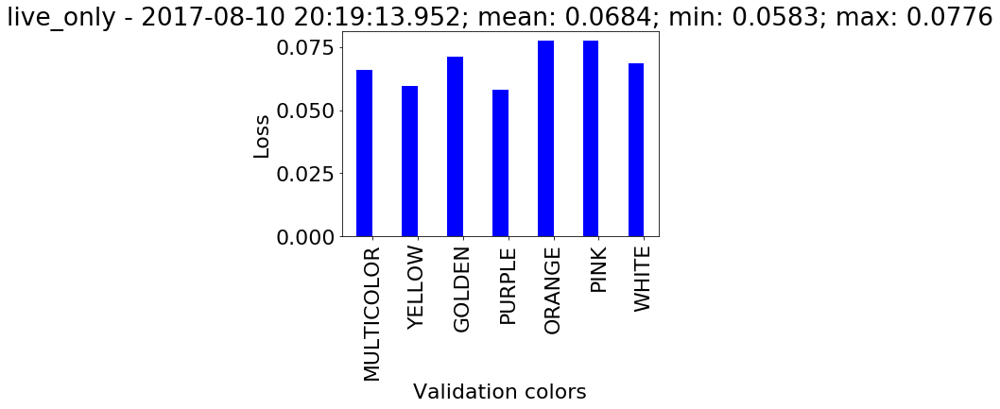

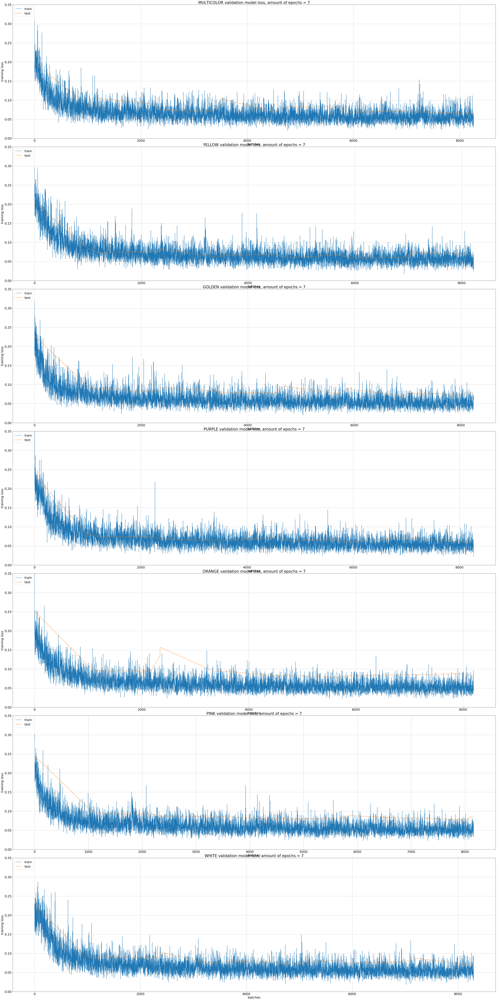

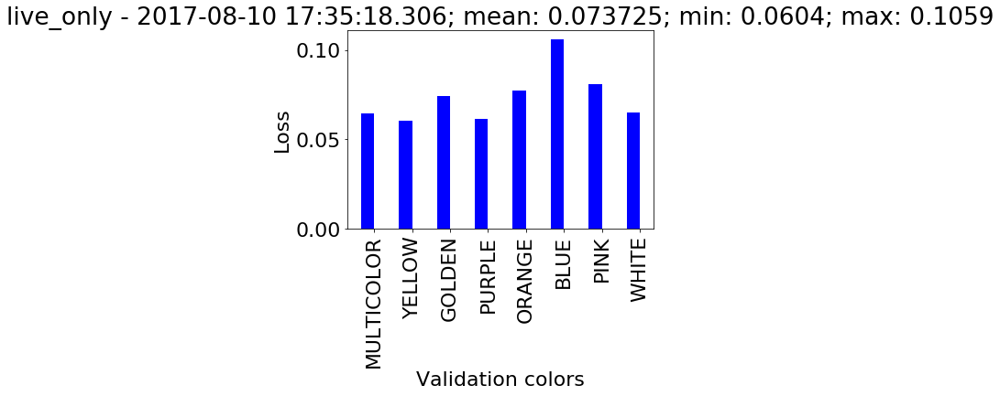

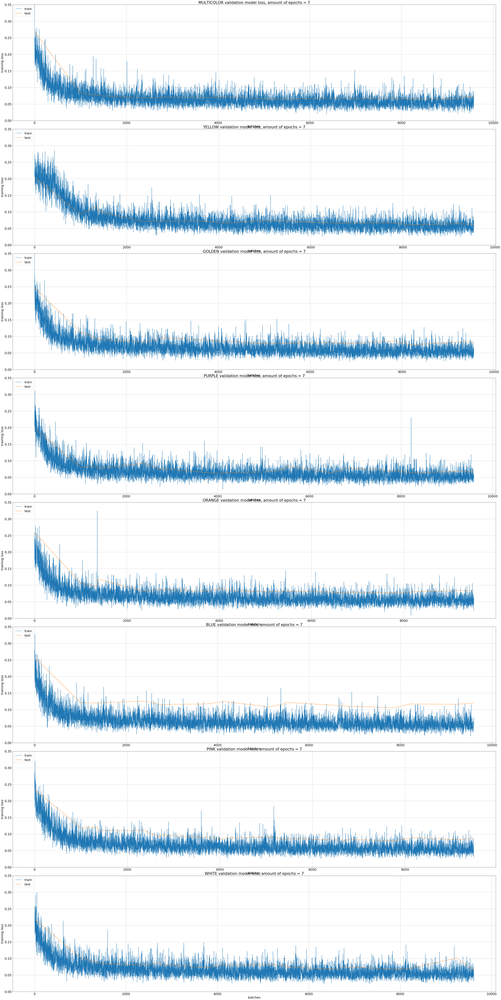

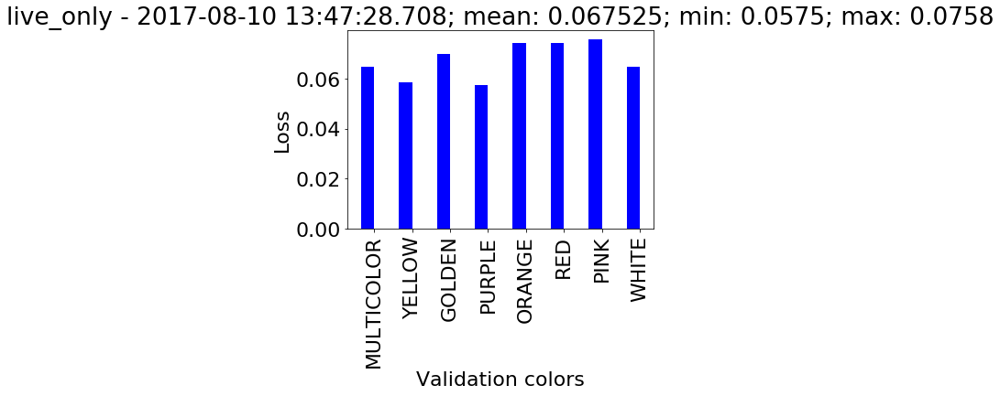

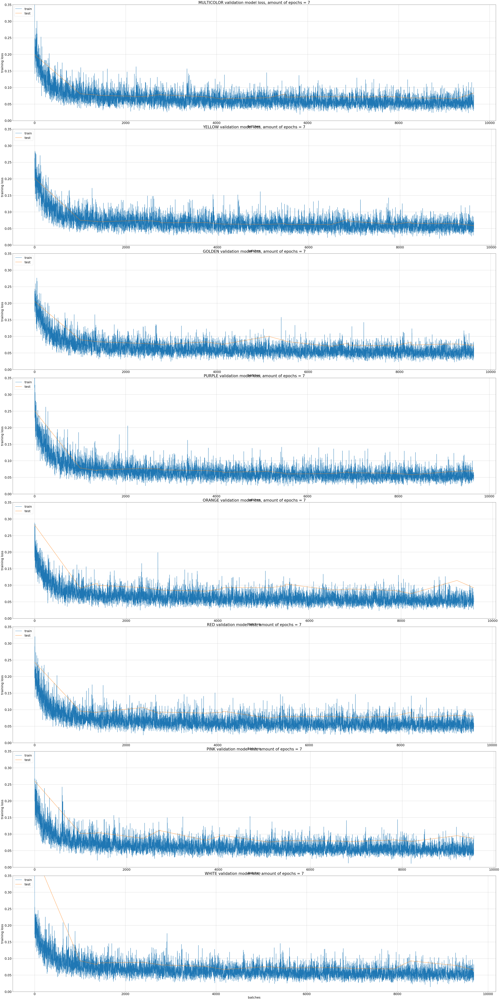

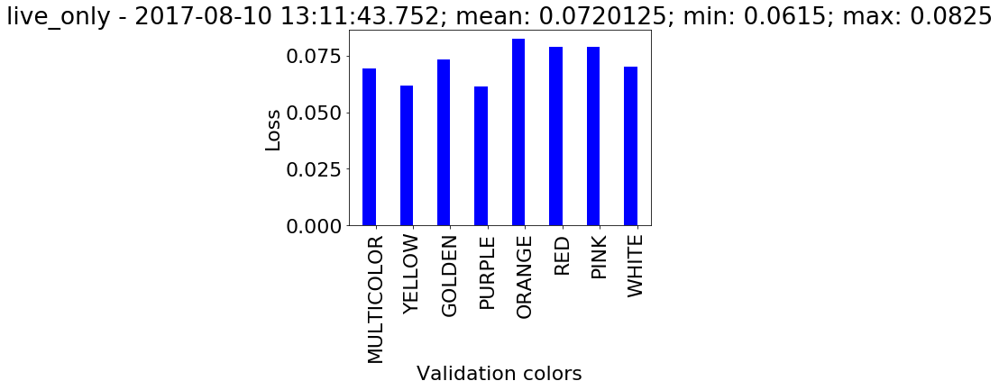

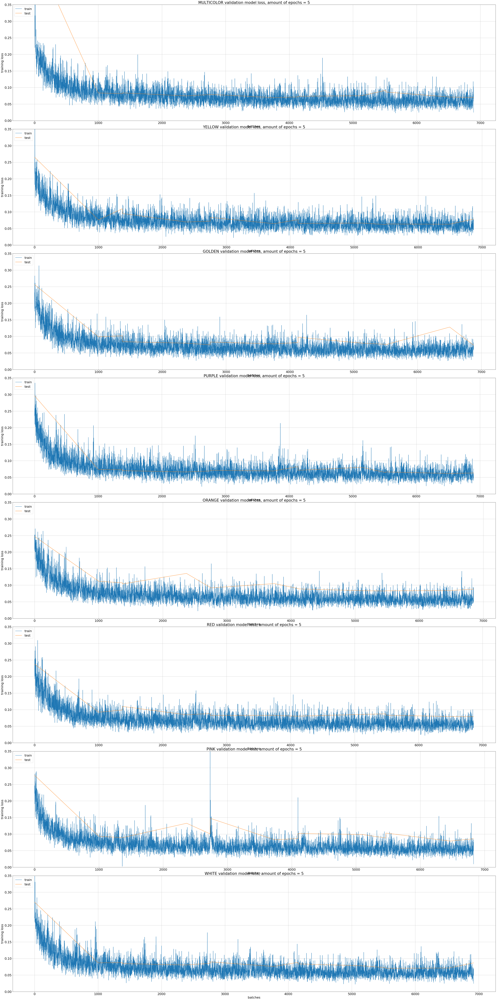

In [30]:
model_name = "live_only"            

training_timestamps = get_training_timestamps_for_model(TRAINING_DATA_FOLDER, model_name)

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, training_timestamps)

for timestamp, training_params_set in training_params_sets.items():
    barplot_losses(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)
    display_loss_graphs(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)

## Show results of the best live only NN

TRAINING RUN - 2017-08-10 20:19:13.952
MERGE_MODE - CONCATENATE
EPOCHS - 7
FCC_SIZE_ARRAY - [32, 16, 16]
OPTIMIZER - adam
BATCH_SIZE - 32
LOSS - mse
CALLBACK_REDUCE_RL_PLATEAU - False
AMOUNT_OF_ITERATIONS - 3
CALLBACK_LOSS_HISTORY - True
DROPOUT_USE - [False, False, False, False]
WEIGH_SAMPLES_BASED_ON_FREQUENCY - True
DATASET_TIMESTAMPS - {'PINK': '2017-08-10 19:50:37.899', 'GOLDEN': '2017-08-10 19:55:17.506', 'PURPLE': '2017-08-10 19:59:58.365', 'YELLOW': '2017-08-10 20:04:41.214', 'MULTICOLOR': '2017-08-10 20:09:22.348', 'ORANGE': '2017-08-10 20:14:02.678', 'WHITE': '2017-08-10 20:18:47.036'}
AFTER_HOW_MANY_BATCHES_EVALUATE_VAL - 1000
DROPOUT_PARAMS - [0.5, 0.2, 0.2, 0.2]
FCC_ACTIVATION - relu
L2_PARAMS - [0.01, 0.01, 0.01]
RECORD_BATCH_VAL_LOSS - True
NUM_ACTIONS - 2
VELOCITY_ACTIVATION - sigmoid
TURNING_ACTIVATION - tanh
L2_USE - [False, False, False]
TRAINING_COLORS - ['MULTICOLOR', 'YELLOW', 'GOLDEN', 'PURPLE', 'ORANGE', 'PINK', 'WHITE']
----------------------------------


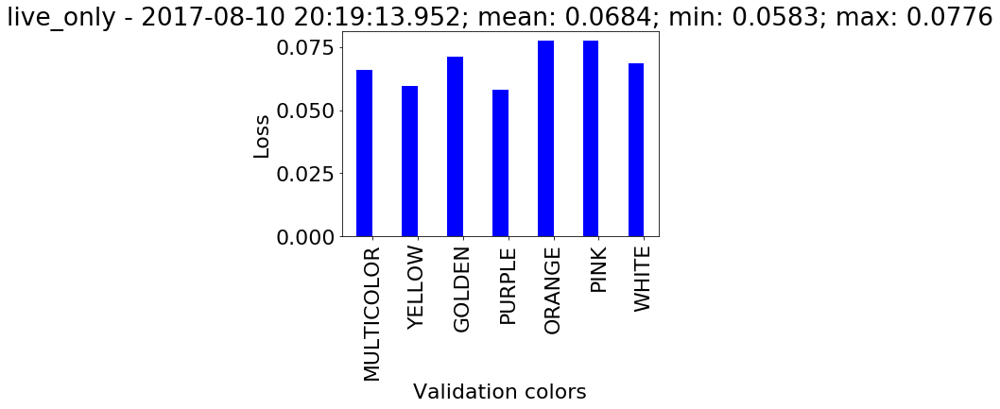

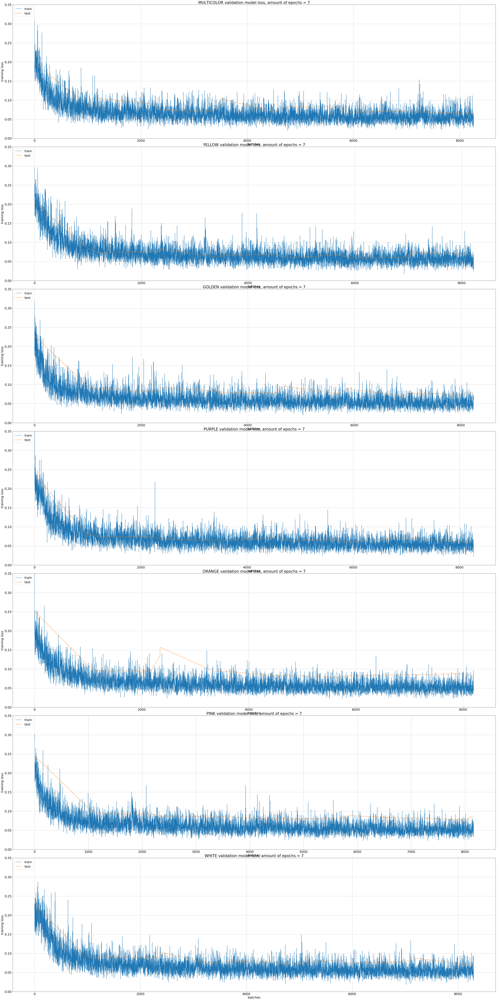

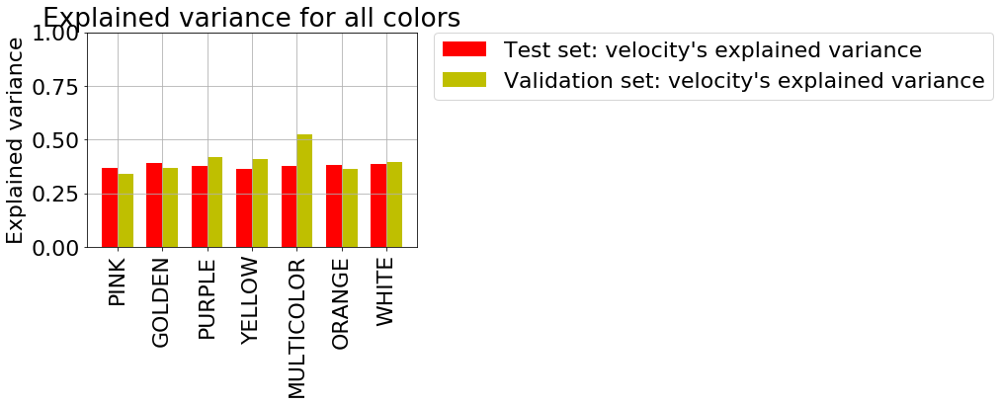

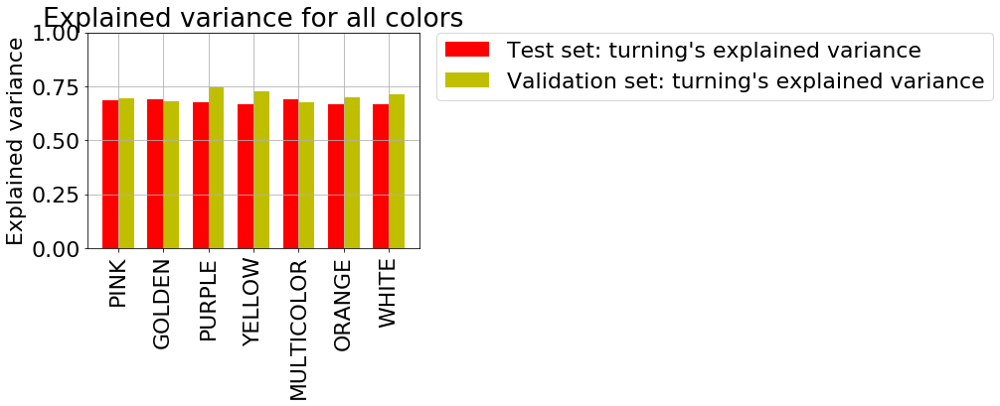

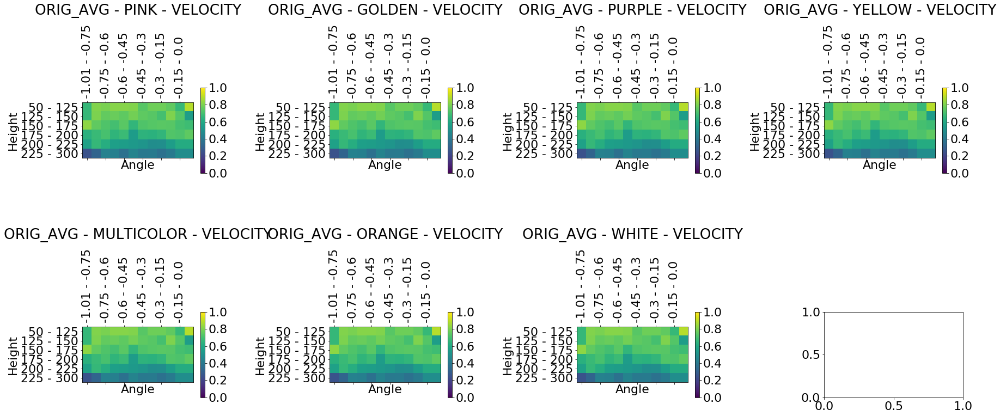

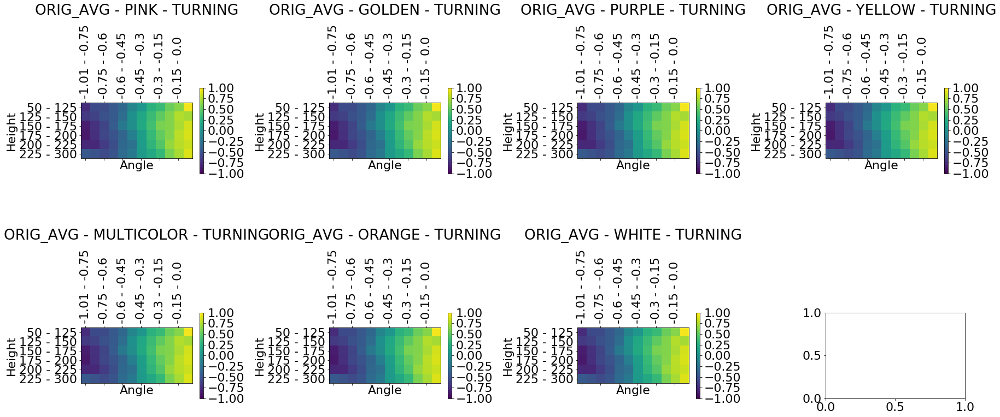

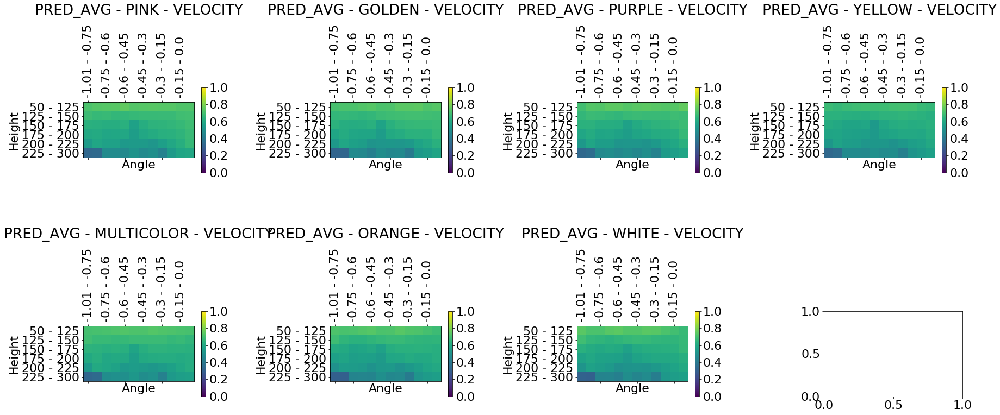

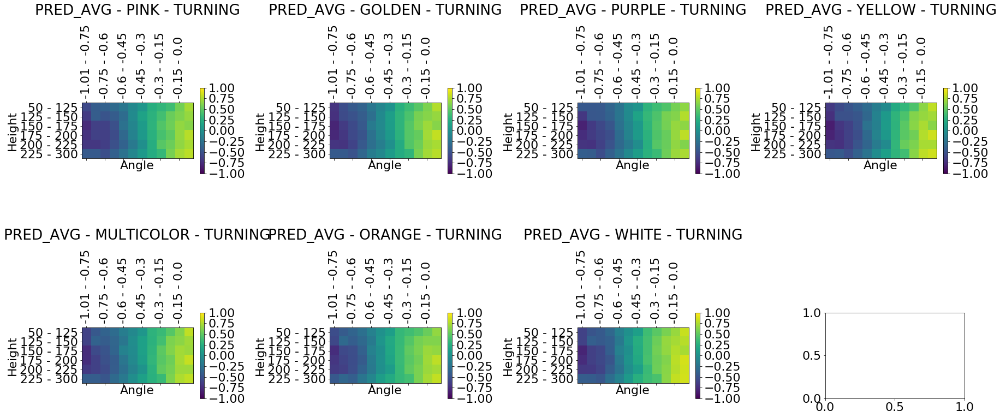

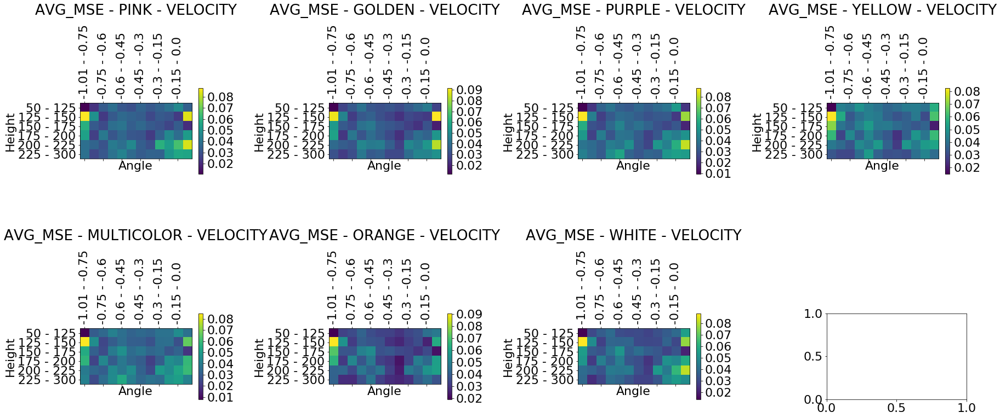

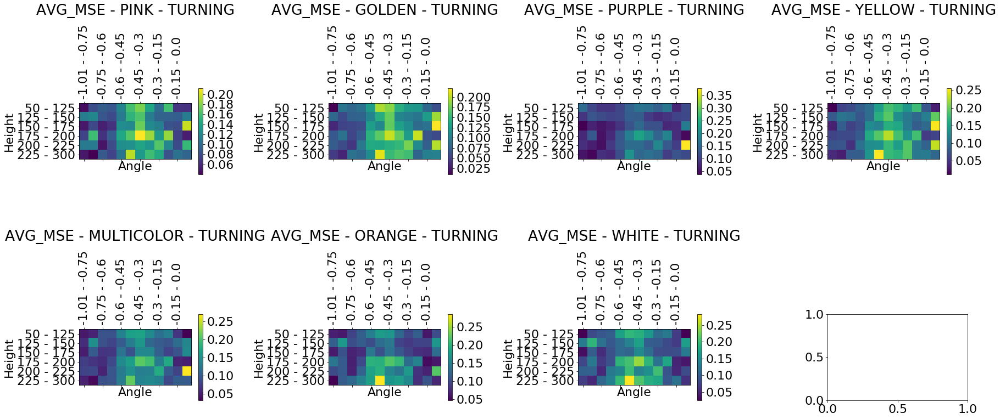

In [31]:
model_name = "live_only"
best_training_timestamp = "2017-08-10 20:19:13.952"#Hand picked
testing_colors = ["RED"]

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, [best_training_timestamp])
#Show performance
barplot_losses(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)
display_loss_graphs(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)

#Get testing dataset
one_validation_dataset_timestamp = training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"].values()[0]
validation_dataset_params = pickle.load(open(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER + "params_" +one_validation_dataset_timestamp + ".p", "rb" ))
training_colors = validation_dataset_params['TRAINING_COLORS'] + [validation_dataset_params['VAL_COLOR']]
test_dataset_timestamp = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=validation_dataset_params['DATA_CAP_THRESHOLD'], use_stay_imgs=validation_dataset_params['USE_STAY_IMGS'], which_model=validation_dataset_params['WHICH_MODEL'], which_targets_to_use=validation_dataset_params['WHICH_TARGETS_TO_USE'], target_folders=validation_dataset_params['TARGET_FOLDERS'],
                 use_extra_targets=validation_dataset_params['USE_EXTRA_TARGETS'], stay_data_compared_to_other_data=validation_dataset_params['STAY_DATA_COMPARED_TO_OTHER_DATA'], correct_target_angle_range=validation_dataset_params['CORRECT_TARGET_ANGLE_RANGE'],
                 correct_target_bbox_range=validation_dataset_params['CORRECT_TARGET_BBOX_RANGE'], weigh_samples_based_on_frequency=validation_dataset_params['WEIGH_SAMPLES_BASED_ON_FREQUENCY'], data_build_mode=validation_dataset_params['DATA_BUILD_MODE'],
                 training_colors=training_colors, val_color=None, testing_colors=testing_colors)

test_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, test_dataset_timestamp)
test_x = test_dataset[0]
test_y = test_dataset[1]
test_vel_bins = test_dataset[2]
test_turn_bins = test_dataset[3]
test_bbox_heights = test_dataset[4]
test_bbox_angles = test_dataset[5]

#Load neural network
live_NN = live_only_network(fcc_size_array=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY"], l2_use=training_params_sets[best_training_timestamp]["L2_USE"], l2_params=training_params_sets[best_training_timestamp]["L2_PARAMS"], 
                                  dropout_use=training_params_sets[best_training_timestamp]["DROPOUT_USE"], dropout_params=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS"], fcc_activation=training_params_sets[best_training_timestamp]["FCC_ACTIVATION"], 
                                  velocity_activation=training_params_sets[best_training_timestamp]["VELOCITY_ACTIVATION"], turning_activation=training_params_sets[best_training_timestamp]["TURNING_ACTIVATION"])
live_NN.compile(optimizer=training_params_sets[best_training_timestamp]["OPTIMIZER"], loss=training_params_sets[best_training_timestamp]["LOSS"], metrics=['mse', 'mae'])

val_NN_orig_commands = {}
test_NN_orig_commands = {}
val_NN_predictions = {}
test_NN_predictions = {}
val_NN_orig_and_pred_commands = {}
test_NN_orig_and_pred_commands = {}
val_NN_target_angles = {}
test_NN_target_angles = {}
val_NN_bbox_heights = {}
test_NN_bbox_heights = {}
weights_folder_path = TRAINING_DATA_FOLDER + model_name + "/" + best_training_timestamp + "/"
possible_weights_filenames = get_filenames_in_folder(weights_folder_path)
for validation_color in training_colors:
    for filename in possible_weights_filenames:
        if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
            live_NN.load_weights(weights_folder_path + filename)
            val_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"][validation_color])
            X_val = val_dataset[3]
            Y_val = val_dataset[4]
            val_bbox_heights = val_dataset[9]
            val_target_angles = val_dataset[10]
            val_y_pred = live_NN.predict(X_val)
            val_NN_orig_commands[validation_color] = Y_val
            val_NN_predictions[validation_color] = val_y_pred
            val_NN_orig_and_pred_commands[validation_color] = (Y_val, val_y_pred)
            val_NN_target_angles[validation_color] = val_target_angles
            val_NN_bbox_heights[validation_color] = val_bbox_heights
            test_y_pred = live_NN.predict(test_x)
            test_NN_orig_commands[validation_color] = test_y
            test_NN_predictions[validation_color] = test_y_pred
            test_NN_orig_and_pred_commands[validation_color] = (test_y, test_y_pred)
            test_NN_target_angles[validation_color] = test_bbox_angles
            test_NN_bbox_heights[validation_color] = test_bbox_heights

plot_validation_and_test_explained_variance(test_NN_orig_and_pred_commands, val_NN_orig_and_pred_commands)

#plot_original_and_predicted_command_distributions(val_NN_orig_commands, val_NN_predictions, val_NN_target_angles, val_NN_bbox_heights)
#plot_original_and_predicted_command_distributions(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights)

visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_AVG")
visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_AVG")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_VAR")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_VAR")
visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "AVG_MSE")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "EXPLAINED VARIANCE")


## Define comparison only networks

In [22]:
def euclidean_distance(vects):
    x, y = vects
    return K.sqrt(K.maximum(K.sum(K.square(x - y), axis=1, keepdims=True), K.epsilon()))


def eucl_dist_output_shape(shapes):
    shape1, shape2 = shapes
    return (shape1[0], 1)


def contrastive_loss(y_true, y_pred):
    '''Contrastive loss from Hadsell-et-al.'06
    http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    '''
    margin = 1
    return K.mean(y_true * K.square(y_pred) +
                  (1 - y_true) * K.square(K.maximum(margin - y_pred, 0)))


def create_pairs(x, digit_indices):
    '''Positive and negative pair creation.
    Alternates between positive and negative pairs.
    '''
    pairs = []
    labels = []
    n = min([len(digit_indices[d]) for d in range(10)]) - 1
    for d in range(10):
        for i in range(n):
            z1, z2 = digit_indices[d][i], digit_indices[d][i + 1]
            pairs += [[x[z1], x[z2]]]
            inc = random.randrange(1, 10)
            dn = (d + inc) % 10
            z1, z2 = digit_indices[d][i], digit_indices[dn][i]
            pairs += [[x[z1], x[z2]]]
            labels += [1, 0]
    return np.array(pairs), np.array(labels)


def create_base_network(input_dim):
    '''Base network to be shared (eq. to feature extraction).
    '''
    seq = Sequential()
    seq.add(Dense(128, input_shape=(input_dim,), activation='relu'))
    seq.add(Dropout(0.1))
    seq.add(Dense(128, activation='relu'))
    seq.add(Dropout(0.1))
    seq.add(Dense(128, activation='relu'))
    return seq


def compute_accuracy(predictions, labels):
    '''Compute classification accuracy with a fixed threshold on distances.
    '''
    new_pred = []
    for prediction in predictions:
        if prediction < 0.5:
            new_pred.append(1)
        else:
            new_pred.append(0)
    accuracy = accuracy_score(labels, new_pred)
    return accuracy

def compute_precision(predictions, labels, prediction_ground_truth):
    '''Compute classification accuracy with a fixed threshold on distances.
    '''
    labels = [item for sublist in labels for item in sublist]
    new_pred = []
    for prediction in predictions:
        if prediction < 0.5:
            new_pred.append(1)
        else:
            new_pred.append(0)
    predictions_equal_ground_truth = np.where(np.array(new_pred) == prediction_ground_truth)[0]
    assert(len(list(predictions_equal_ground_truth)) == len(new_pred))
    if prediction_ground_truth == 0:
        labels=list(np.ones_like(labels)-labels)
        new_pred=list(np.ones_like(new_pred)-new_pred)
    precision = precision_score(labels, new_pred)
    return precision

def compute_recall(predictions, labels, label_ground_truth):
    '''Compute classification accuracy with a fixed threshold on distances.
    '''
    labels = [item for sublist in labels for item in sublist]
    labels_equal_ground_truth = np.where(np.array(labels) == label_ground_truth)[0]
    assert(len(labels_equal_ground_truth) == len(labels))
    new_pred = []
    for prediction in predictions:
        if prediction < 0.5:
            new_pred.append(1)
        else:
            new_pred.append(0)
    if label_ground_truth == 0:
        labels=list(np.ones_like(labels)-labels)
        new_pred=list(np.ones_like(new_pred)-new_pred)
    recall = recall_score(labels, new_pred)
    return recall

def define_siamese_euc_configurable(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                      dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, fcc_activation=FCC_ACTIVATION):
    assert len(fcc_size_array) == len(l2_use) and len(fcc_size_array) == len(l2_params) and (len(fcc_size_array)+1) == len(dropout_use) and (len(fcc_size_array)+1) == len(dropout_params)
    
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    base_input = Input(shape=(1, 1, 2048))
    current_layer = Flatten()(base_input)
    if dropout_use[0]:
        current_layer = Dropout(dropout_params[0])(current_layer)
    for index, fcc_size in enumerate(fcc_size_array):
        if l2_use[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use[index+1]:
            current_layer = Dropout(dropout_params[index+1])(current_layer)
    base_dense = current_layer
    
    base_model = Model(inputs=base_input, outputs=base_dense)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    distance = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([target_leg, live_leg])

    model = Model(inputs=input_convs, outputs=distance)
    return model

## Train comparison only network

In [ ]:
print_training_params()

In [ ]:
FCC_SIZE_ARRAY = [32,32]
L2_USE = [True, True]
L2_PARAMS = [0.01, 0.01]

model_name = "euc_distance"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 3
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)

for i in range(AMOUNT_OF_ITERATIONS):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))

    for validation_color in TRAINING_COLORS:    
        #Get model
        siamese_euc_network = define_siamese_euc_configurable(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                      dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, fcc_activation=FCC_ACTIVATION)
        siamese_euc_network.compile(loss=contrastive_loss, optimizer="adam")
        print(siamese_euc_network.summary())
        
        #Get data for training
        dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
        X = dataset[0]
        Y = dataset[1]
        X_val = dataset[2]
        Y_val = dataset[3]
        val_bbox_heights = dataset[4]
        val_bbox_angles = dataset[5]
        
        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        
        if CALLBACK_REDUCE_RL_PLATEAU:
            reduce_rl_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, verbose=1, mode='auto', epsilon=0.0001, cooldown=0, min_lr=0)
            callbacks_for_fitting.append(reduce_rl_callback)

        print(validation_color)
        validation_data = (X_val, Y_val)

        siamese_euc_network.fit(X, Y, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting)
        
        # compute final accuracy on training and test sets
        pred = siamese_euc_network.predict(X)
        tr_acc = compute_accuracy(pred, Y)
        pred = siamese_euc_network.predict(X_val)
        val_acc = compute_accuracy(pred, Y_val)
        
        print('* Accuracy on training set: %0.2f%%' % (100 * tr_acc))
        print('* Accuracy on validation set: %0.2f%%' % (100 * val_acc))

## Show results of all comparison only NN training 

In [ ]:
model_name = "euc_distance"            

training_timestamps = get_training_timestamps_for_model(TRAINING_DATA_FOLDER, model_name)

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, training_timestamps)

for timestamp, training_params_set in training_params_sets.items():
    barplot_losses(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)
    display_loss_graphs(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)

## Show results of the best comparison only NN

In [ ]:
model_name = "euc_distance"
best_training_timestamp = "2017-08-11 20:20:25.455"#Hand picked
testing_colors = ["RED"]

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, [best_training_timestamp])
#Show performance
barplot_losses(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)
display_loss_graphs(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)

#Get testing dataset
one_validation_dataset_timestamp = training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"].values()[0]
validation_dataset_params = pickle.load(open(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER + "params_" +one_validation_dataset_timestamp + ".p", "rb" ))
training_colors = validation_dataset_params['TRAINING_COLORS'] + [validation_dataset_params['VAL_COLOR']]
test_dataset_timestamp = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=validation_dataset_params['DATA_CAP_THRESHOLD'], use_stay_imgs=validation_dataset_params['USE_STAY_IMGS'], which_model=validation_dataset_params['WHICH_MODEL'], which_targets_to_use=validation_dataset_params['WHICH_TARGETS_TO_USE'], target_folders=validation_dataset_params['TARGET_FOLDERS'],
                 use_extra_targets=validation_dataset_params['USE_EXTRA_TARGETS'], stay_data_compared_to_other_data=validation_dataset_params['STAY_DATA_COMPARED_TO_OTHER_DATA'], correct_target_angle_range=validation_dataset_params['CORRECT_TARGET_ANGLE_RANGE'],
                 correct_target_bbox_range=validation_dataset_params['CORRECT_TARGET_BBOX_RANGE'], weigh_samples_based_on_frequency=validation_dataset_params['WEIGH_SAMPLES_BASED_ON_FREQUENCY'], data_build_mode=validation_dataset_params['DATA_BUILD_MODE'],
                 training_colors=training_colors, val_color=None, testing_colors=testing_colors)

test_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, test_dataset_timestamp)
test_x = test_dataset[0]
test_y = test_dataset[1]
test_bbox_heights = test_dataset[2]
test_bbox_angles = test_dataset[3]

#Load neural network
siamese_euc_network = define_siamese_euc_configurable(fcc_size_array=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY"], l2_use=training_params_sets[best_training_timestamp]["L2_USE"], l2_params=training_params_sets[best_training_timestamp]["L2_PARAMS"], 
                                                      dropout_use=training_params_sets[best_training_timestamp]["DROPOUT_USE"], dropout_params=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS"], fcc_activation=training_params_sets[best_training_timestamp]["FCC_ACTIVATION"])
siamese_euc_network.compile(loss=contrastive_loss, optimizer=training_params_sets[best_training_timestamp]["OPTIMIZER"])

val_NN_orig_classes = {}
test_NN_orig_classes = {}
val_NN_predictions = {}
test_NN_predictions = {}
val_NN_orig_and_pred_classes = {}
test_NN_orig_and_pred_classes = {}
val_NN_target_angles = {}
test_NN_target_angles = {}
val_NN_bbox_heights = {}
test_NN_bbox_heights = {}
weights_folder_path = TRAINING_DATA_FOLDER + model_name + "/" + best_training_timestamp + "/"
possible_weights_filenames = get_filenames_in_folder(weights_folder_path)
for validation_color in training_colors:
    for filename in possible_weights_filenames:
        if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
            siamese_euc_network.load_weights(weights_folder_path + filename)
            val_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"][validation_color])
            X_val = val_dataset[2]
            Y_val = val_dataset[3]
            val_bbox_heights = val_dataset[4]
            val_target_angles = val_dataset[5]
            val_y_pred = siamese_euc_network.predict(X_val)
            val_NN_orig_classes[validation_color] = Y_val
            val_NN_predictions[validation_color] = val_y_pred
            val_NN_orig_and_pred_classes[validation_color] = (Y_val, val_y_pred)
            val_NN_target_angles[validation_color] = val_target_angles
            val_NN_bbox_heights[validation_color] = val_bbox_heights
            test_y_pred = siamese_euc_network.predict(test_x)
            test_NN_orig_classes[validation_color] = test_y
            test_NN_predictions[validation_color] = test_y_pred
            test_NN_orig_and_pred_classes[validation_color] = (test_y, test_y_pred)
            test_NN_target_angles[validation_color] = test_bbox_angles
            test_NN_bbox_heights[validation_color] = test_bbox_heights
            
plot_comparison_validation_and_test_metrics(test_NN_orig_classes, test_NN_predictions, val_NN_orig_classes, val_NN_predictions)

visualize_classification_performance_in_target_bins(test_NN_orig_classes, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)


## Define vel turn only neural network

In [23]:
def behavioral_siamese(fcc_size_array, num_actions, merge_mode, fcc_activation="relu"):
    assert len(fcc_size_array) > 0, 'There has to be atleast 1 FCC layer'
    assert len(fcc_size_array) == len(L2_USE) and len(fcc_size_array) == len(L2_PARAMS) and (len(fcc_size_array)+1) == len(DROPOUT_USE) and (len(fcc_size_array)+1) == len(DROPOUT_PARAMS)

    input_convs = []
    target_inputs = []
    for i in range(HOW_MANY_TARGETS_THERE_ARE):
        if i in WHICH_TARGETS_TO_USE:
            target_input = Input(shape=(1, 1, 2048))#Dimension from output of resnet50
            target_inputs.append(target_input)
    live_input = Input(shape=(1, 1, 2048))#Dimension from output of resnet50
    input_convs += target_inputs
    input_convs.append(live_input)
    

    merged_network = None
    if merge_mode == "MULTIPLY":
        if AVERAGE_TARGET_CONVS:
            averaged_target = average(target_inputs)
            merged_network = multiply([averaged_target, live_input])
        else:
            merged_network = multiply(input_convs)
    elif merge_mode == "CONCATENATE":
        if AVERAGE_TARGET_CONVS:
            averaged_target = average(target_inputs)
            merged_network = concatenate([averaged_target, live_input])
        else:
            merged_network = concatenate(input_convs)

    currentlayer = Flatten()(merged_network)
    if DROPOUT_USE[0]:
        currentlayer = Dropout(DROPOUT_PARAMS[0])(currentlayer)
    
    for index in range(len(fcc_size_array)):
        fcc_size = fcc_size_array[index]
        if L2_USE[index]:
            currentlayer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(L2_PARAMS[index]))(currentlayer)
        else:
            currentlayer = Dense(fcc_size, activation=fcc_activation)(currentlayer)
        if DROPOUT_USE[index+1]:
            currentlayer = Dropout(DROPOUT_PARAMS[index+1])(currentlayer)
            
    vel_pred = Dense(1, activation="sigmoid")(currentlayer)
    turn_pred = Dense(1, activation="tanh")(currentlayer)

    predictions = concatenate([vel_pred, turn_pred])

    model = Model(inputs=input_convs, outputs=predictions)
    return model

def behavioral_siamese_mod2(fcc_size_array, num_actions, merge_mode, fcc_activation="relu"):
    assert len(fcc_size_array) > 0, 'There has to be atleast 1 FCC layer'
    assert len(fcc_size_array) == len(L2_USE) and len(fcc_size_array) == len(L2_PARAMS) and (len(fcc_size_array)+1) == len(DROPOUT_USE) and (len(fcc_size_array)+1) == len(DROPOUT_PARAMS)

    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    base_input = Input(shape=(1, 1, 2048))
    base_flatten = Flatten()(base_input)
    base_dense = Dense(32, activation='relu')(base_flatten)

    base_model = Model(inputs=base_input, outputs=base_dense)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    currentlayer = concatenate([target_leg, live_leg])

    #currentlayer = Flatten()(merged_network)
    if DROPOUT_USE[0]:
        currentlayer = Dropout(DROPOUT_PARAMS[0])(currentlayer)
    
    for index in range(len(fcc_size_array)):
        fcc_size = fcc_size_array[index]
        if L2_USE[index]:
            currentlayer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(L2_PARAMS[index]))(currentlayer)
        else:
            currentlayer = Dense(fcc_size, activation=fcc_activation)(currentlayer)
        if DROPOUT_USE[index+1]:
            currentlayer = Dropout(DROPOUT_PARAMS[index+1])(currentlayer)
            
    vel_pred = Dense(1, activation="linear")(currentlayer)
    turn_pred = Dense(1, activation="linear")(currentlayer)

    predictions = concatenate([vel_pred, turn_pred])

    model = Model(inputs=input_convs, outputs=predictions)
    return model

def behavioral_siamese_mod3(fcc_size_array, num_actions, merge_mode, fcc_activation="relu"):
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    """
    base_input = Input(shape=(1, 1, 2048))
    base_flatten = Flatten()(base_input)
    base_dense = Dense(512, activation='relu')(base_flatten)

    base_model = Model(inputs=base_input, outputs=base_dense)
    """
    base_input = Input(shape=(1, 1, 2048))
    base_flatten = Flatten()(base_input)
    base_dropout = Dropout(0.5)(base_flatten)
    base_dense = Dense(16, activation='elu', W_regularizer=l2(0.01))(base_dropout)
    #base_dense = Dropout(0.2)(base_dense)
    base_dense = Dense(16, activation='elu', W_regularizer=l2(0.01))(base_dense)
    base_model = Model(inputs=base_input, outputs=base_dense)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    #currentlayer = concatenate([target_leg, live_leg, distance])
    currentlayer = concatenate([target_leg, live_leg])
    
    #currentlayer = Dense(32, activation="elu")(currentlayer)
    currentlayer = Dense(16, activation="elu")(currentlayer)
    currentlayer = Dense(16, activation="elu")(currentlayer)
    
    vel_pred = Dense(1, activation="linear")(currentlayer)
    turn_pred = Dense(1, activation="linear")(currentlayer)

    command_predictions = concatenate([vel_pred, turn_pred])
    model = Model(inputs=input_convs, outputs=command_predictions)
    return model

def behavioral_siamese_vel_turn_only_configurable(fcc_size_array=None, l2_use=None, l2_params=None, dropout_use=None, dropout_params=None, 
                                     fcc_size_array_after_merge=None, l2_use_after_merge=None, l2_params_after_merge=None, dropout_use_after_merge=None, dropout_params_after_merge=None, 
                                     merge_mode=None, fcc_activation=None, velocity_activation=None, turning_activation=None, separate_outputs=False):
    assert len(fcc_size_array) == len(l2_use) and len(fcc_size_array) == len(l2_params) and (len(fcc_size_array)+1) == len(dropout_use) and (len(fcc_size_array)+1) == len(dropout_params)
    assert len(fcc_size_array_after_merge) == len(l2_use_after_merge) and len(fcc_size_array_after_merge) == len(l2_params_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_use_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_params_after_merge)
    
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    base_input = Input(shape=(1, 1, 2048))
    current_layer = Flatten()(base_input)
    
    if dropout_use[0]:
        current_layer = Dropout(dropout_params[0])(current_layer)
    for index, fcc_size in enumerate(fcc_size_array):
        if l2_use[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use[index+1]:
            current_layer = Dropout(dropout_params[index+1])(current_layer)
    
    base_model = Model(inputs=base_input, outputs=current_layer)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    merge_layer=None
    if merge_mode == "CONCATENATE":
        merge_layer = concatenate([target_leg, live_leg])
    elif merge_mode == "MULTIPLY":
        merge_layer = multiply([target_leg, live_leg])
    else:
        raise Exception('THIS MERGE MODE DOES NOT EXIST')
        
    current_layer=merge_layer
    if DROPOUT_USE[0]:
        currentlayer = Dropout(DROPOUT_PARAMS[0])(current_layer)
    
    for index in range(len(fcc_size_array_after_merge)):
        fcc_size = fcc_size_array_after_merge[index]
        if l2_use_after_merge[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params_after_merge[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use_after_merge[index+1]:
            current_layer = Dropout(dropout_params_after_merge[index+1])(current_layer)
            
    vel_pred = Dense(1, activation=velocity_activation)(current_layer)
    turn_pred = Dense(1, activation=turning_activation)(current_layer)
    
    if separate_outputs:
        model = Model(inputs=input_convs, outputs=[vel_pred,turn_pred])
    else:
        predictions = concatenate([vel_pred, turn_pred])
        model = Model(inputs=input_convs, outputs=predictions)
    return model

def behavioral_siamese_vel_turn_only_configurable_separating(fcc_size_array=None, l2_use=None, l2_params=None, dropout_use=None, dropout_params=None, 
                                     fcc_size_array_after_merge=None, l2_use_after_merge=None, l2_params_after_merge=None, dropout_use_after_merge=None, dropout_params_after_merge=None, 
                                     merge_mode=None, fcc_activation=None, velocity_activation=None, turning_activation=None, separate_outputs=False):
    assert len(fcc_size_array) == len(l2_use) and len(fcc_size_array) == len(l2_params) and (len(fcc_size_array)+1) == len(dropout_use) and (len(fcc_size_array)+1) == len(dropout_params)
    assert len(fcc_size_array_after_merge) == len(l2_use_after_merge) and len(fcc_size_array_after_merge) == len(l2_params_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_use_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_params_after_merge)
    
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    base_input = Input(shape=(1, 1, 2048))
    current_layer = Flatten()(base_input)
    
    if dropout_use[0]:
        current_layer = Dropout(dropout_params[0])(current_layer)
    for index, fcc_size in enumerate(fcc_size_array):
        if l2_use[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use[index+1]:
            current_layer = Dropout(dropout_params[index+1])(current_layer)
    
    base_model = Model(inputs=base_input, outputs=current_layer)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    merge_layer=None
    if merge_mode == "CONCATENATE":
        merge_layer = concatenate([target_leg, live_leg])
    elif merge_mode == "MULTIPLY":
        merge_layer = multiply([target_leg, live_leg])
    else:
        raise Exception('THIS MERGE MODE DOES NOT EXIST')
        
    current_layer=merge_layer
    
    after_merge_base = Input(shape=(64,))
    current_layer = after_merge_base
    
    if DROPOUT_USE[0]:
        currentlayer = Dropout(DROPOUT_PARAMS[0])(current_layer)
    
    for index in range(len(fcc_size_array_after_merge)):
        fcc_size = fcc_size_array_after_merge[index]
        if l2_use_after_merge[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params_after_merge[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use_after_merge[index+1]:
            current_layer = Dropout(dropout_params_after_merge[index+1])(current_layer)
    
    separate_model = Model(inputs=after_merge_base, outputs=current_layer)
    
    separate_vel = separate_model(merge_layer)
    separate_turn = separate_model(merge_layer)
            
    vel_pred = Dense(1, activation=velocity_activation)(separate_vel)
    turn_pred = Dense(1, activation=turning_activation)(separate_turn)
    
    model = Model(inputs=input_convs, outputs=[vel_pred,turn_pred])
    return model

## Train vel turn only neural networks

In [30]:
print_training_params()

FCC_SIZE_ARRAY - [32, 32]
NUM_ACTIONS - 2
MERGE_MODE - CONCATENATE
L2_USE - [True, True]
L2_PARAMS - [0.01, 0.01]
DROPOUT_USE - [False, False, False]
DROPOUT_PARAMS - [0.5, 0.2, 0.2]
AMOUNT_OF_ITERATIONS - 3
WEIGH_SAMPLES_BASED_ON_FREQUENCY - True
CALLBACK_MODEL_CHECKPOINT - False ||| MODEL_CHECKPOINT_FILEPATH - training_results/weights.{epoch:02d}-{val_loss:.2f}.hdf5 ||| MODEL_CHECKPOINT_MONITOR - val_loss ||| MODEL_CHECKPOINT_SAVE_BEST_ONLY - True
CALLBACK_LOSS_HISTORY - True ||| RECORD_BATCH_VAL_LOSS - True ||| AFTER_HOW_MANY_BATCHES_EVALUATE_VAL - 1000
CALLBACK_REDUCE_RL_PLATEAU - False
LOSS - mse
OPTIMIZER - adam
FCC_ACTIVATION - elu
VELOCITY_ACTIVATION - sigmoid
TURNING_ACTIVATION - tanh
TRAINING_COLORS - ['MULTICOLOR', 'YELLOW', 'GOLDEN']
TESTING_COLORS - ['RED']
BATCH_SIZE - 32
EPOCHS - 5
FCC_SIZE_ARRAY_AFTER_MERGE - [32, 16, 16]
L2_USE_AFTER_MERGE - [False, False, False]
L2_PARAMS_AFTER_MERGE - [0.01, 0.01, 0.01]
DROPOUT_USE_AFTER_MERGE - [False, False, False, False]
DROPOUT_P

In [ ]:
model_name = "vel_turn_only"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 1
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS,
                                          fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, 
                                          dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE)

current_datasets = {}
for i in range(AMOUNT_OF_ITERATIONS):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))

    for validation_color in TRAINING_COLORS:   
        #Get model
        behavioral_siamese_network = behavioral_siamese_vel_turn_only_configurable(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, 
                                     fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE, 
                                     merge_mode=MERGE_MODE, fcc_activation=FCC_ACTIVATION, velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION)
        behavioral_siamese_network.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=['mse', 'mae'])
        print(behavioral_siamese_network.summary())
        
        dataset = None
        #Get data for training
        if validation_color in current_datasets.keys():
            dataset = current_datasets[validation_color]
        else:
            dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
            current_datasets[validation_color] = dataset
        X = dataset[0]
        Y = dataset[1]
        weights_for_samples = dataset[2]
        X_val = dataset[3]
        Y_val = dataset[4]
        val_vel_bins = dataset[5]
        val_turn_bins = dataset[6]
        train_bbox_heights = dataset[7]
        train_bbox_angles = dataset[8]
        val_bbox_heights = dataset[9]
        val_bbox_angles = dataset[10]

        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        if WEIGH_SAMPLES_BASED_ON_FREQUENCY:
            weights_for_samples = np.array(weights_for_samples)

        print(validation_color)
        validation_data = (X_val, Y_val)
        loss, mse, mae = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        print('\nValidation loss: {}, mae: {}\n'.format(loss, mae))
        behavioral_siamese_network.fit(X, Y, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting, sample_weight=weights_for_samples)
        
        # compute final accuracy on training and test sets
        pred = behavioral_siamese_network.predict(X_val)
        same_pred_indices = []
        diff_pred_indices = []
        for i in range(len(Y_val)):
            if i % 2 == 0:
                same_pred_indices.append(i)
            else:
                diff_pred_indices.append(i)
        same_velocity = []
        same_turning = []
        different_velocity = []
        different_turning = []
        for same_index in same_pred_indices:
            same_velocity.append(pred[same_index][0])
            same_turning.append(pred[same_index][1])
        for diff_index in diff_pred_indices:
            different_velocity.append(pred[diff_index][0])
            different_turning.append(pred[diff_index][1])
        same_velocity = np.array(same_velocity)
        same_turning = np.array(same_turning)
        different_velocity = np.array(different_velocity)
        different_turning = np.array(different_turning)

        f, ax = plt.subplots(1, 4, figsize=(24, 9))
        ax[0].hist(same_velocity, 50, facecolor='green')
        ax[0].set_xlabel('Velocity')
        ax[0].set_ylabel('Count')
        ax[0].set_title(validation_color + "-same_vel")
        ax[0].grid(True)
        ax[0].set_xlim(0.0,1.0)

        ax[1].hist(same_turning, 50, facecolor='green')
        ax[1].set_xlabel('Turning')
        ax[1].set_ylabel('Count')
        ax[1].set_title(validation_color + "-same_turn")
        ax[1].grid(True)
        ax[1].set_xlim(-1.0,1.0)

        ax[2].hist(different_velocity, 50, facecolor='green')
        ax[2].set_xlabel('Velocity')
        ax[2].set_ylabel('Count')
        ax[2].set_title(validation_color + "-diff_vel")
        ax[2].grid(True)
        ax[2].set_xlim(0.0,1.0)

        ax[3].hist(different_turning, 50, facecolor='green')
        ax[3].set_xlabel('Turning')
        ax[3].set_ylabel('Count')
        ax[3].set_title(validation_color + "-diff_turn")
        ax[3].grid(True)
        ax[3].set_xlim(-1.0,1.0)

In [ ]:
AMOUNT_OF_ITERATIONS = 1
CALLBACK_LOSS_HISTORY = True
EPOCHS = 5
FCC_SIZE_ARRAY = [32]
L2_USE = [True]
L2_PARAMS = [0.01]
DROPOUT_USE = [False, False]
DROPOUT_PARAMS = [0.5, 0.2]
VELOCITY_ACTIVATION = "linear"


model_name = "vel_turn_only_separate_outputs"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 1
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS,
                                          fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, 
                                          dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE)
current_datasets = {}
for i in range(AMOUNT_OF_ITERATIONS):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))

    for validation_color in TRAINING_COLORS:   
        #Get model
        behavioral_siamese_network = behavioral_siamese_vel_turn_only_configurable(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, 
                                     fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE, 
                                     merge_mode=MERGE_MODE, fcc_activation=FCC_ACTIVATION, velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, separate_outputs=True)
        behavioral_siamese_network.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=['mse', 'mae'])
        print(behavioral_siamese_network.summary())

        dataset = None
        #Get data for training
        if validation_color in current_datasets.keys():
            dataset = current_datasets[validation_color]
        else:
            dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
            current_datasets[validation_color] = dataset
        X = dataset[0]
        Y = dataset[1]
        Y_vel = []
        Y_turn = []        
        for y in Y:
            Y_vel.append(y[0])
            Y_turn.append(y[1])
        Y = [np.array(Y_vel), np.array(Y_turn)]
        weights_for_samples = dataset[2]
        X_val = dataset[3]
        Y_val = dataset[4]
        Y_val_vel = []
        Y_val_turn = []        
        for y in Y_val:
            Y_val_vel.append(y[0])
            Y_val_turn.append(y[1])
        Y_val = [np.array(Y_val_vel), np.array(Y_val_turn)]
        val_vel_bins = dataset[5]
        val_turn_bins = dataset[6]

        train_vel_bins = np.digitize(Y_vel, VELOCITY_COMMAND_BIN_RANGES)
        train_turn_bins = np.digitize(Y_turn, TURNING_COMMAND_BIN_RANGES)
        sample_weights_vel = []
        sample_weights_turn = []
        
        for vel_bin in train_vel_bins:
            velocity_indices = np.where(train_vel_bins == vel_bin)[0]
            amount_in_bin = len(velocity_indices)
            sample_weights_vel.append(1-(amount_in_bin/float(len(train_vel_bins))))
            
        for turn_bin in train_turn_bins:
            turning_indices = np.where(train_turn_bins == turn_bin)[0]
            amount_in_bin = len(turning_indices)
            sample_weights_turn.append(1-(amount_in_bin/float(len(train_turn_bins))))

        sample_weights = [np.array(sample_weights_vel), np.array(sample_weights_turn)]
        
        train_bbox_heights = dataset[7]
        train_bbox_angles = dataset[8]
        val_bbox_heights = dataset[9]
        val_bbox_angles = dataset[10]

        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        weights_for_samples = None
        if WEIGH_SAMPLES_BASED_ON_FREQUENCY:
            weights_for_samples = sample_weights

        print(validation_color)
        validation_data = (X_val, Y_val)
        #loss, mse, mae = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        #print('\nValidation loss: {}, mae: {}\n'.format(loss, mae))
        loss = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        behavioral_siamese_network.fit(X, Y, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting, sample_weight=weights_for_samples)
        
        # compute final accuracy on training and test sets
        pred = behavioral_siamese_network.predict(X_val)
        same_pred_indices = []
        diff_pred_indices = []
        for i in range(len(list(Y_val[0]))):
            if i % 2 == 0:
                same_pred_indices.append(i)
            else:
                diff_pred_indices.append(i)
        same_velocity = []
        same_turning = []
        different_velocity = []
        different_turning = []
        for same_index in same_pred_indices:
            same_velocity.append(pred[0][same_index])
            same_turning.append(pred[1][same_index])
        for diff_index in diff_pred_indices:
            different_velocity.append(pred[0][diff_index])
            different_turning.append(pred[1][diff_index])
        same_velocity = np.array(same_velocity)
        same_turning = np.array(same_turning)
        different_velocity = np.array(different_velocity)
        different_turning = np.array(different_turning)

        f, ax = plt.subplots(1, 4, figsize=(24, 9))
        ax[0].hist(same_velocity, 50, facecolor='green')
        ax[0].set_xlabel('Velocity')
        ax[0].set_ylabel('Count')
        ax[0].set_title(validation_color + "-same_vel")
        ax[0].grid(True)
        ax[0].set_xlim(0.0,1.0)

        ax[1].hist(same_turning, 50, facecolor='green')
        ax[1].set_xlabel('Turning')
        ax[1].set_ylabel('Count')
        ax[1].set_title(validation_color + "-same_turn")
        ax[1].grid(True)
        ax[1].set_xlim(-1.0,1.0)

        ax[2].hist(different_velocity, 50, facecolor='green')
        ax[2].set_xlabel('Velocity')
        ax[2].set_ylabel('Count')
        ax[2].set_title(validation_color + "-diff_vel")
        ax[2].grid(True)
        ax[2].set_xlim(0.0,1.0)

        ax[3].hist(different_turning, 50, facecolor='green')
        ax[3].set_xlabel('Turning')
        ax[3].set_ylabel('Count')
        ax[3].set_title(validation_color + "-diff_turn")
        ax[3].grid(True)
        ax[3].set_xlim(-1.0,1.0)

In [ ]:
AMOUNT_OF_ITERATIONS = 1
CALLBACK_LOSS_HISTORY = True
EPOCHS = 5
FCC_SIZE_ARRAY = [32]
L2_USE = [True]
L2_PARAMS = [0.01]
DROPOUT_USE = [False, False]
DROPOUT_PARAMS = [0.5, 0.2]
VELOCITY_ACTIVATION = "linear"


model_name = "vel_turn_only_separate_outputs_separate_NNs"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 1
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS,
                                          fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, 
                                          dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE)
current_datasets = {}
for i in range(AMOUNT_OF_ITERATIONS):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))

    for validation_color in TRAINING_COLORS:   
        #Get model
        behavioral_siamese_network = behavioral_siamese_vel_turn_only_configurable_separating(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, 
                                     fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE, 
                                     merge_mode=MERGE_MODE, fcc_activation=FCC_ACTIVATION, velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, separate_outputs=True)
        behavioral_siamese_network.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=['mse', 'mae'])
        print(behavioral_siamese_network.summary())

        dataset = None
        #Get data for training
        if validation_color in current_datasets.keys():
            dataset = current_datasets[validation_color]
        else:
            dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
            current_datasets[validation_color] = dataset
        X = dataset[0]
        Y = dataset[1]
        Y_vel = []
        Y_turn = []        
        for y in Y:
            Y_vel.append(y[0])
            Y_turn.append(y[1])
        Y = [np.array(Y_vel), np.array(Y_turn)]
        weights_for_samples = dataset[2]
        X_val = dataset[3]
        Y_val = dataset[4]
        Y_val_vel = []
        Y_val_turn = []        
        for y in Y_val:
            Y_val_vel.append(y[0])
            Y_val_turn.append(y[1])
        Y_val = [np.array(Y_val_vel), np.array(Y_val_turn)]
        val_vel_bins = dataset[5]
        val_turn_bins = dataset[6]

        train_vel_bins = np.digitize(Y_vel, VELOCITY_COMMAND_BIN_RANGES)
        train_turn_bins = np.digitize(Y_turn, TURNING_COMMAND_BIN_RANGES)
        sample_weights_vel = []
        sample_weights_turn = []
        
        for vel_bin in train_vel_bins:
            velocity_indices = np.where(train_vel_bins == vel_bin)[0]
            amount_in_bin = len(velocity_indices)
            sample_weights_vel.append(1-(amount_in_bin/float(len(train_vel_bins))))
            
        for turn_bin in train_turn_bins:
            turning_indices = np.where(train_turn_bins == turn_bin)[0]
            amount_in_bin = len(turning_indices)
            sample_weights_turn.append(1-(amount_in_bin/float(len(train_turn_bins))))

        sample_weights = [np.array(sample_weights_vel), np.array(sample_weights_turn)]
        
        train_bbox_heights = dataset[7]
        train_bbox_angles = dataset[8]
        val_bbox_heights = dataset[9]
        val_bbox_angles = dataset[10]

        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        weights_for_samples = None
        if WEIGH_SAMPLES_BASED_ON_FREQUENCY:
            weights_for_samples = sample_weights

        print(validation_color)
        validation_data = (X_val, Y_val)
        #loss, mse, mae = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        #print('\nValidation loss: {}, mae: {}\n'.format(loss, mae))
        loss = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        behavioral_siamese_network.fit(X, Y, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting, sample_weight=weights_for_samples)
        
        # compute final accuracy on training and test sets
        pred = behavioral_siamese_network.predict(X_val)
        same_pred_indices = []
        diff_pred_indices = []
        for i in range(len(list(Y_val[0]))):
            if i % 2 == 0:
                same_pred_indices.append(i)
            else:
                diff_pred_indices.append(i)
        same_velocity = []
        same_turning = []
        different_velocity = []
        different_turning = []
        for same_index in same_pred_indices:
            same_velocity.append(pred[0][same_index])
            same_turning.append(pred[1][same_index])
        for diff_index in diff_pred_indices:
            different_velocity.append(pred[0][diff_index])
            different_turning.append(pred[1][diff_index])
        same_velocity = np.array(same_velocity)
        same_turning = np.array(same_turning)
        different_velocity = np.array(different_velocity)
        different_turning = np.array(different_turning)

        f, ax = plt.subplots(1, 4, figsize=(24, 9))
        ax[0].hist(same_velocity, 50, facecolor='green')
        ax[0].set_xlabel('Velocity')
        ax[0].set_ylabel('Count')
        ax[0].set_title(validation_color + "-same_vel")
        ax[0].grid(True)
        ax[0].set_xlim(0.0,1.0)

        ax[1].hist(same_turning, 50, facecolor='green')
        ax[1].set_xlabel('Turning')
        ax[1].set_ylabel('Count')
        ax[1].set_title(validation_color + "-same_turn")
        ax[1].grid(True)
        ax[1].set_xlim(-1.0,1.0)

        ax[2].hist(different_velocity, 50, facecolor='green')
        ax[2].set_xlabel('Velocity')
        ax[2].set_ylabel('Count')
        ax[2].set_title(validation_color + "-diff_vel")
        ax[2].grid(True)
        ax[2].set_xlim(0.0,1.0)

        ax[3].hist(different_turning, 50, facecolor='green')
        ax[3].set_xlabel('Turning')
        ax[3].set_ylabel('Count')
        ax[3].set_title(validation_color + "-diff_turn")
        ax[3].grid(True)
        ax[3].set_xlim(-1.0,1.0)
        #break

## Show results of all vel turn only NN training

In [ ]:
model_name = "vel_turn_only"            

training_timestamps = get_training_timestamps_for_model(TRAINING_DATA_FOLDER, model_name)

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, training_timestamps)

for timestamp, training_params_set in training_params_sets.items():
    barplot_losses(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)
    display_loss_graphs(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)

In [ ]:
model_name = "vel_turn_only_separate_outputs"            

training_timestamps = get_training_timestamps_for_model(TRAINING_DATA_FOLDER, model_name)

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, training_timestamps)

for timestamp, training_params_set in training_params_sets.items():
    barplot_losses(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)
    display_loss_graphs(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)

## Show results of the best vel turn only NN

In [ ]:
model_name = "vel_turn_only"
best_training_timestamp = "2017-08-12 11:17:36.833"#Hand picked
testing_colors = ["RED"]

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, [best_training_timestamp])
#Show performance
barplot_losses(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)
display_loss_graphs(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)

#Get testing dataset
one_validation_dataset_timestamp = training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"].values()[0]
validation_dataset_params = pickle.load(open(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER + "params_" +one_validation_dataset_timestamp + ".p", "rb" ))
training_colors = validation_dataset_params['TRAINING_COLORS'] + [validation_dataset_params['VAL_COLOR']]
test_dataset_timestamp = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=validation_dataset_params['DATA_CAP_THRESHOLD'], use_stay_imgs=validation_dataset_params['USE_STAY_IMGS'], which_model=validation_dataset_params['WHICH_MODEL'], which_targets_to_use=validation_dataset_params['WHICH_TARGETS_TO_USE'], target_folders=validation_dataset_params['TARGET_FOLDERS'],
                 use_extra_targets=validation_dataset_params['USE_EXTRA_TARGETS'], stay_data_compared_to_other_data=validation_dataset_params['STAY_DATA_COMPARED_TO_OTHER_DATA'], correct_target_angle_range=validation_dataset_params['CORRECT_TARGET_ANGLE_RANGE'],
                 correct_target_bbox_range=validation_dataset_params['CORRECT_TARGET_BBOX_RANGE'], weigh_samples_based_on_frequency=validation_dataset_params['WEIGH_SAMPLES_BASED_ON_FREQUENCY'], data_build_mode=validation_dataset_params['DATA_BUILD_MODE'],
                 training_colors=training_colors, val_color=None, testing_colors=testing_colors)

test_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, test_dataset_timestamp)
test_x = test_dataset[0]
test_y = test_dataset[1]
test_vel_bins = test_dataset[2]
test_turn_bins = test_dataset[3]
test_bbox_heights = test_dataset[4]
test_bbox_angles = test_dataset[5]

#Load neural network
behavioral_siamese_network = behavioral_siamese_vel_turn_only_configurable(fcc_size_array=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY"], l2_use=training_params_sets[best_training_timestamp]["L2_USE"], l2_params=training_params_sets[best_training_timestamp]["L2_PARAMS"], dropout_use=training_params_sets[best_training_timestamp]["DROPOUT_USE"], dropout_params=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS"], 
                                     fcc_size_array_after_merge=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY_AFTER_MERGE"], l2_use_after_merge=training_params_sets[best_training_timestamp]["L2_USE_AFTER_MERGE"], l2_params_after_merge=training_params_sets[best_training_timestamp]["L2_PARAMS_AFTER_MERGE"], dropout_use_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_USE_AFTER_MERGE"], dropout_params_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS_AFTER_MERGE"], 
                                     merge_mode=training_params_sets[best_training_timestamp]["MERGE_MODE"], fcc_activation=training_params_sets[best_training_timestamp]["FCC_ACTIVATION"], velocity_activation=training_params_sets[best_training_timestamp]["VELOCITY_ACTIVATION"], turning_activation=training_params_sets[best_training_timestamp]["TURNING_ACTIVATION"])
behavioral_siamese_network.compile(optimizer=training_params_sets[best_training_timestamp]["OPTIMIZER"], loss=training_params_sets[best_training_timestamp]["LOSS"], metrics=['mse', 'mae'])
print(behavioral_siamese_network.summary())

val_NN_orig_commands = {}
test_NN_orig_commands = {}
val_NN_predictions = {}
test_NN_predictions = {}
val_NN_orig_and_pred_commands = {}
test_NN_orig_and_pred_commands = {}
val_NN_target_angles = {}
test_NN_target_angles = {}
val_NN_bbox_heights = {}
test_NN_bbox_heights = {}
weights_folder_path = TRAINING_DATA_FOLDER + model_name + "/" + best_training_timestamp + "/"
possible_weights_filenames = get_filenames_in_folder(weights_folder_path)
for validation_color in training_colors:
    for filename in possible_weights_filenames:
        if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
            behavioral_siamese_network.load_weights(weights_folder_path + filename)
            val_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"][validation_color])
            X_val = val_dataset[3]
            Y_val = val_dataset[4]
            val_bbox_heights = val_dataset[9]
            val_target_angles = val_dataset[10]
            val_y_pred = behavioral_siamese_network.predict(X_val)
            val_NN_orig_commands[validation_color] = Y_val
            val_NN_predictions[validation_color] = val_y_pred
            val_NN_orig_and_pred_commands[validation_color] = (Y_val, val_y_pred)
            val_NN_target_angles[validation_color] = val_target_angles
            val_NN_bbox_heights[validation_color] = val_bbox_heights
            test_y_pred = behavioral_siamese_network.predict(test_x)
            test_NN_orig_commands[validation_color] = test_y
            test_NN_predictions[validation_color] = test_y_pred
            test_NN_orig_and_pred_commands[validation_color] = (test_y, test_y_pred)
            test_NN_target_angles[validation_color] = test_bbox_angles
            test_NN_bbox_heights[validation_color] = test_bbox_heights

same_val_NN_orig_commands = {}
same_test_NN_orig_commands = {}
same_val_NN_predictions = {}
same_test_NN_predictions = {}
same_val_NN_orig_and_pred_commands = {}
same_test_NN_orig_and_pred_commands = {}
same_val_NN_target_angles = {}
same_test_NN_target_angles = {}
same_val_NN_bbox_heights = {}
same_test_NN_bbox_heights = {}

diff_val_NN_orig_commands = {}
diff_test_NN_orig_commands = {}
diff_val_NN_predictions = {}
diff_test_NN_predictions = {}
diff_val_NN_orig_and_pred_commands = {}
diff_test_NN_orig_and_pred_commands = {}
diff_val_NN_target_angles = {}
diff_test_NN_target_angles = {}
diff_val_NN_bbox_heights = {}
diff_test_NN_bbox_heights = {}

for color in test_NN_orig_and_pred_commands.keys():
    same_test_NN_orig_commands[color] = []
    same_test_NN_predictions[color] = []
    same_test_NN_orig_and_pred_commands[color] = []
    same_test_NN_target_angles[color] = []
    same_test_NN_bbox_heights[color] = []
    diff_test_NN_orig_commands[color] = []
    diff_test_NN_predictions[color] = []
    diff_test_NN_orig_and_pred_commands[color] = []
    diff_test_NN_target_angles[color] = []
    diff_test_NN_bbox_heights[color] = []
    
    different_indices = []
    same_indices = []
    orig_commands = test_NN_orig_and_pred_commands[color][0]
    for idx, orig_command in enumerate(orig_commands):
        if orig_command[0] == 0.0 and orig_command[1] == 0.0:
            different_indices.append(idx)
        else:
            same_indices.append(idx)
    for index in same_indices:
        same_test_NN_orig_commands[color].append(test_NN_orig_and_pred_commands[color][0][index])
        same_test_NN_predictions[color].append(test_NN_orig_and_pred_commands[color][1][index])
        same_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        same_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    same_test_NN_orig_and_pred_commands[color] = (same_test_NN_orig_commands[color], np.array(same_test_NN_predictions[color]))
    for index in different_indices:
        diff_test_NN_orig_commands[color].append([0])
        if test_NN_orig_and_pred_commands[color][1][index][0] < 0.25 and test_NN_orig_and_pred_commands[color][1][index][1] < 0.25:
            diff_test_NN_predictions[color].append(1.0)
        else:
            diff_test_NN_predictions[color].append(0.0)
        diff_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        diff_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    diff_test_NN_orig_and_pred_commands[color] = (diff_test_NN_orig_commands[color], np.array(diff_test_NN_predictions[color]))
    diff_test_NN_predictions[color] = np.array(diff_test_NN_predictions[color])
        
for color in val_NN_orig_and_pred_commands.keys():
    same_val_NN_orig_commands[color] = []
    same_val_NN_predictions[color] = []
    same_val_NN_orig_and_pred_commands[color] = []
    same_val_NN_target_angles[color] = []
    same_val_NN_bbox_heights[color] = []
    diff_val_NN_orig_commands[color] = []
    diff_val_NN_predictions[color] = []
    diff_val_NN_orig_and_pred_commands[color] = []
    diff_val_NN_target_angles[color] = []
    diff_val_NN_bbox_heights[color] = []
    
    different_indices = []
    same_indices = []
    orig_commands = val_NN_orig_and_pred_commands[color][0]
    for idx, orig_command in enumerate(orig_commands):
        if orig_command[0] == 0.0 and orig_command[1] == 0.0:
            different_indices.append(idx)
        else:
            same_indices.append(idx)
    for index in same_indices:
        same_val_NN_orig_commands[color].append(val_NN_orig_and_pred_commands[color][0][index])
        same_val_NN_predictions[color].append(val_NN_orig_and_pred_commands[color][1][index])
        same_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        same_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    same_val_NN_orig_and_pred_commands[color] = (same_val_NN_orig_commands[color], np.array(same_val_NN_predictions[color]))
    for index in different_indices:
        diff_val_NN_orig_commands[color].append([0])
        if val_NN_orig_and_pred_commands[color][1][index][0] < 0.25 and val_NN_orig_and_pred_commands[color][1][index][1] < 0.25:
            diff_val_NN_predictions[color].append(1.0)
        else:
            diff_val_NN_predictions[color].append(0.0)
        diff_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        diff_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    diff_val_NN_orig_and_pred_commands[color] = (diff_val_NN_orig_commands[color], np.array(diff_val_NN_predictions[color]))
    diff_val_NN_predictions[color] = np.array(diff_val_NN_predictions[color])
            
#FOR THE COMMANDS WHERE IMAGES ARE ABOUT THE SAME TARGET
plot_validation_and_test_explained_variance(same_test_NN_orig_and_pred_commands, same_val_NN_orig_and_pred_commands)

plot_original_and_predicted_command_distributions(same_val_NN_orig_commands, same_val_NN_predictions, same_val_NN_target_angles, same_val_NN_bbox_heights)
plot_original_and_predicted_command_distributions(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights)

visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_AVG")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_AVG")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_VAR")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_VAR")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "AVG_MSE")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "EXPLAINED VARIANCE")

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT DIFFERENT TARGETS
plot_comparison_validation_and_test_metrics(diff_test_NN_orig_commands, diff_test_NN_predictions, diff_val_NN_orig_commands, diff_val_NN_predictions)

visualize_classification_performance_in_target_bins(diff_test_NN_orig_commands, diff_test_NN_predictions, diff_test_NN_target_angles, diff_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)

In [ ]:
model_name = "vel_turn_only_separate_outputs"
best_training_timestamp = "2017-08-13 15:17:11.584"#Hand picked
testing_colors = ["RED"]

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, [best_training_timestamp])
#Show performance
barplot_losses(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)
display_loss_graphs(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)

#Get testing dataset
one_validation_dataset_timestamp = training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"].values()[0]
validation_dataset_params = pickle.load(open(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER + "params_" +one_validation_dataset_timestamp + ".p", "rb" ))
training_colors = validation_dataset_params['TRAINING_COLORS'] + [validation_dataset_params['VAL_COLOR']]
test_dataset_timestamp = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=validation_dataset_params['DATA_CAP_THRESHOLD'], use_stay_imgs=validation_dataset_params['USE_STAY_IMGS'], which_model=validation_dataset_params['WHICH_MODEL'], which_targets_to_use=validation_dataset_params['WHICH_TARGETS_TO_USE'], target_folders=validation_dataset_params['TARGET_FOLDERS'],
                 use_extra_targets=validation_dataset_params['USE_EXTRA_TARGETS'], stay_data_compared_to_other_data=validation_dataset_params['STAY_DATA_COMPARED_TO_OTHER_DATA'], correct_target_angle_range=validation_dataset_params['CORRECT_TARGET_ANGLE_RANGE'],
                 correct_target_bbox_range=validation_dataset_params['CORRECT_TARGET_BBOX_RANGE'], weigh_samples_based_on_frequency=validation_dataset_params['WEIGH_SAMPLES_BASED_ON_FREQUENCY'], data_build_mode=validation_dataset_params['DATA_BUILD_MODE'],
                 training_colors=training_colors, val_color=None, testing_colors=testing_colors)

test_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, test_dataset_timestamp)
test_x = test_dataset[0]
test_y = test_dataset[1]
test_Y_vel = []
test_Y_turn = []        
for y in test_y:
    test_Y_vel.append(y[0])
    test_Y_turn.append(y[1])
test_y = [np.array(test_Y_vel), np.array(test_Y_turn)]
test_vel_bins = test_dataset[2]
test_turn_bins = test_dataset[3]
test_bbox_heights = test_dataset[4]
test_bbox_angles = test_dataset[5]

#Load neural network
behavioral_siamese_network = behavioral_siamese_vel_turn_only_configurable(fcc_size_array=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY"], l2_use=training_params_sets[best_training_timestamp]["L2_USE"], l2_params=training_params_sets[best_training_timestamp]["L2_PARAMS"], dropout_use=training_params_sets[best_training_timestamp]["DROPOUT_USE"], dropout_params=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS"], 
                                     fcc_size_array_after_merge=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY_AFTER_MERGE"], l2_use_after_merge=training_params_sets[best_training_timestamp]["L2_USE_AFTER_MERGE"], l2_params_after_merge=training_params_sets[best_training_timestamp]["L2_PARAMS_AFTER_MERGE"], dropout_use_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_USE_AFTER_MERGE"], dropout_params_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS_AFTER_MERGE"], 
                                     merge_mode=training_params_sets[best_training_timestamp]["MERGE_MODE"], fcc_activation=training_params_sets[best_training_timestamp]["FCC_ACTIVATION"], velocity_activation=training_params_sets[best_training_timestamp]["VELOCITY_ACTIVATION"], turning_activation=training_params_sets[best_training_timestamp]["TURNING_ACTIVATION"], separate_outputs=True)
behavioral_siamese_network.compile(optimizer=training_params_sets[best_training_timestamp]["OPTIMIZER"], loss=training_params_sets[best_training_timestamp]["LOSS"], metrics=['mse', 'mae'])
print(behavioral_siamese_network.summary())

val_NN_orig_commands = {}
test_NN_orig_commands = {}
val_NN_predictions = {}
test_NN_predictions = {}
val_NN_orig_and_pred_commands = {}
test_NN_orig_and_pred_commands = {}
val_NN_target_angles = {}
test_NN_target_angles = {}
val_NN_bbox_heights = {}
test_NN_bbox_heights = {}
weights_folder_path = TRAINING_DATA_FOLDER + model_name + "/" + best_training_timestamp + "/"
possible_weights_filenames = get_filenames_in_folder(weights_folder_path)
for validation_color in training_colors:
    for filename in possible_weights_filenames:
        if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
            behavioral_siamese_network.load_weights(weights_folder_path + filename)
            val_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"][validation_color])
            X_val = val_dataset[3]
            Y_val = val_dataset[4]
            val_Y_vel = []
            val_Y_turn = []        
            for y in Y_val:
                val_Y_vel.append(y[0])
                val_Y_turn.append(y[1])
            Y_val = [np.array(val_Y_vel), np.array(val_Y_turn)]
            val_bbox_heights = val_dataset[9]
            val_target_angles = val_dataset[10]
            val_y_pred = behavioral_siamese_network.predict(X_val)
            val_NN_orig_commands[validation_color] = Y_val
            val_NN_predictions[validation_color] = val_y_pred
            val_NN_orig_and_pred_commands[validation_color] = (Y_val, val_y_pred)
            val_NN_target_angles[validation_color] = val_target_angles
            val_NN_bbox_heights[validation_color] = val_bbox_heights
            test_y_pred = behavioral_siamese_network.predict(test_x)
            test_NN_orig_commands[validation_color] = test_y
            test_NN_predictions[validation_color] = test_y_pred
            test_NN_orig_and_pred_commands[validation_color] = (test_y, test_y_pred)
            test_NN_target_angles[validation_color] = test_bbox_angles
            test_NN_bbox_heights[validation_color] = test_bbox_heights

same_val_NN_orig_commands = {}
same_test_NN_orig_commands = {}
same_val_NN_predictions = {}
same_test_NN_predictions = {}
same_val_NN_orig_and_pred_commands = {}
same_test_NN_orig_and_pred_commands = {}
same_val_NN_target_angles = {}
same_test_NN_target_angles = {}
same_val_NN_bbox_heights = {}
same_test_NN_bbox_heights = {}

diff_val_NN_orig_commands = {}
diff_test_NN_orig_commands = {}
diff_val_NN_predictions = {}
diff_test_NN_predictions = {}
diff_val_NN_orig_and_pred_commands = {}
diff_test_NN_orig_and_pred_commands = {}
diff_val_NN_target_angles = {}
diff_test_NN_target_angles = {}
diff_val_NN_bbox_heights = {}
diff_test_NN_bbox_heights = {}

for color in test_NN_orig_and_pred_commands.keys():
    same_test_NN_orig_commands[color] = []
    same_test_NN_predictions[color] = []
    same_test_NN_orig_and_pred_commands[color] = []
    same_test_NN_target_angles[color] = []
    same_test_NN_bbox_heights[color] = []
    diff_test_NN_orig_commands[color] = []
    diff_test_NN_predictions[color] = []
    diff_test_NN_orig_and_pred_commands[color] = []
    diff_test_NN_target_angles[color] = []
    diff_test_NN_bbox_heights[color] = []
    
    different_indices = []
    same_indices = []
    
    for i in range(len(test_NN_orig_and_pred_commands[color][0][0])):
        if i % 2 == 0:
            same_indices.append(i)
        else:
            different_indices.append(i)
    for index in same_indices:
        same_test_NN_orig_commands[color].append((test_NN_orig_and_pred_commands[color][0][0][index], test_NN_orig_and_pred_commands[color][0][1][index]))
        same_test_NN_predictions[color].append([test_NN_orig_and_pred_commands[color][1][0][index][0], test_NN_orig_and_pred_commands[color][1][1][index][0]])
        same_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        same_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    same_test_NN_orig_and_pred_commands[color] = (same_test_NN_orig_commands[color], np.array(same_test_NN_predictions[color]))
    for index in different_indices:
        diff_test_NN_orig_commands[color].append([0])
        if test_NN_orig_and_pred_commands[color][1][0][index] < 0.25 and test_NN_orig_and_pred_commands[color][1][1][index] < 0.25:
            diff_test_NN_predictions[color].append(1.0)
        else:
            diff_test_NN_predictions[color].append(0.0)
        diff_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        diff_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    diff_test_NN_orig_and_pred_commands[color] = (diff_test_NN_orig_commands[color], np.array(diff_test_NN_predictions[color]))
    diff_test_NN_predictions[color] = np.array(diff_test_NN_predictions[color])
        
for color in val_NN_orig_and_pred_commands.keys():
    same_val_NN_orig_commands[color] = []
    same_val_NN_predictions[color] = []
    same_val_NN_orig_and_pred_commands[color] = []
    same_val_NN_target_angles[color] = []
    same_val_NN_bbox_heights[color] = []
    diff_val_NN_orig_commands[color] = []
    diff_val_NN_predictions[color] = []
    diff_val_NN_orig_and_pred_commands[color] = []
    diff_val_NN_target_angles[color] = []
    diff_val_NN_bbox_heights[color] = []
            
    different_indices = []
    same_indices = []
    for i in range(len(val_NN_orig_and_pred_commands[color][0][0])):
        if i % 2 == 0:
            same_indices.append(i)
        else:
            different_indices.append(i)
    for index in same_indices:
        same_val_NN_orig_commands[color].append((val_NN_orig_and_pred_commands[color][0][0][index], val_NN_orig_and_pred_commands[color][0][1][index]))
        same_val_NN_predictions[color].append([val_NN_orig_and_pred_commands[color][1][0][index][0], val_NN_orig_and_pred_commands[color][1][1][index][0]])
        same_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        same_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    same_val_NN_orig_and_pred_commands[color] = (same_val_NN_orig_commands[color], np.array(same_val_NN_predictions[color]))
    for index in different_indices:
        diff_val_NN_orig_commands[color].append([0])
        if val_NN_orig_and_pred_commands[color][1][0][index] < 0.25 and val_NN_orig_and_pred_commands[color][1][1][index] < 0.25:
            diff_val_NN_predictions[color].append(1.0)
        else:
            diff_val_NN_predictions[color].append(0.0)
        diff_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        diff_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    diff_val_NN_orig_and_pred_commands[color] = (diff_val_NN_orig_commands[color], np.array(diff_val_NN_predictions[color]))
    diff_val_NN_predictions[color] = np.array(diff_val_NN_predictions[color])

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT THE SAME TARGET
plot_validation_and_test_explained_variance(same_test_NN_orig_and_pred_commands, same_val_NN_orig_and_pred_commands)

plot_original_and_predicted_command_distributions(same_val_NN_orig_commands, same_val_NN_predictions, same_val_NN_target_angles, same_val_NN_bbox_heights)
plot_original_and_predicted_command_distributions(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights)

visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_AVG")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_AVG")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_VAR")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_VAR")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "AVG_MSE")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "EXPLAINED VARIANCE")

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT DIFFERENT TARGETS
plot_comparison_validation_and_test_metrics(diff_test_NN_orig_commands, diff_test_NN_predictions, diff_val_NN_orig_commands, diff_val_NN_predictions)

visualize_classification_performance_in_target_bins(diff_test_NN_orig_commands, diff_test_NN_predictions, diff_test_NN_target_angles, diff_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)

In [ ]:
model_name = "vel_turn_only_separate_outputs_separate_NNs"
best_training_timestamp = "2017-08-13 20:35:25.261"#Hand picked
testing_colors = ["RED"]

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, [best_training_timestamp])
#Show performance
barplot_losses(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)
display_loss_graphs(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)

#Get testing dataset
one_validation_dataset_timestamp = training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"].values()[0]
validation_dataset_params = pickle.load(open(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER + "params_" +one_validation_dataset_timestamp + ".p", "rb" ))
training_colors = validation_dataset_params['TRAINING_COLORS'] + [validation_dataset_params['VAL_COLOR']]
test_dataset_timestamp = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=validation_dataset_params['DATA_CAP_THRESHOLD'], use_stay_imgs=validation_dataset_params['USE_STAY_IMGS'], which_model=validation_dataset_params['WHICH_MODEL'], which_targets_to_use=validation_dataset_params['WHICH_TARGETS_TO_USE'], target_folders=validation_dataset_params['TARGET_FOLDERS'],
                 use_extra_targets=validation_dataset_params['USE_EXTRA_TARGETS'], stay_data_compared_to_other_data=validation_dataset_params['STAY_DATA_COMPARED_TO_OTHER_DATA'], correct_target_angle_range=validation_dataset_params['CORRECT_TARGET_ANGLE_RANGE'],
                 correct_target_bbox_range=validation_dataset_params['CORRECT_TARGET_BBOX_RANGE'], weigh_samples_based_on_frequency=validation_dataset_params['WEIGH_SAMPLES_BASED_ON_FREQUENCY'], data_build_mode=validation_dataset_params['DATA_BUILD_MODE'],
                 training_colors=training_colors, val_color=None, testing_colors=testing_colors)

test_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, test_dataset_timestamp)
test_x = test_dataset[0]
test_y = test_dataset[1]
test_Y_vel = []
test_Y_turn = []        
for y in test_y:
    test_Y_vel.append(y[0])
    test_Y_turn.append(y[1])
test_y = [np.array(test_Y_vel), np.array(test_Y_turn)]
test_vel_bins = test_dataset[2]
test_turn_bins = test_dataset[3]
test_bbox_heights = test_dataset[4]
test_bbox_angles = test_dataset[5]

#Load neural network
behavioral_siamese_network = behavioral_siamese_vel_turn_only_configurable_separating(fcc_size_array=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY"], l2_use=training_params_sets[best_training_timestamp]["L2_USE"], l2_params=training_params_sets[best_training_timestamp]["L2_PARAMS"], dropout_use=training_params_sets[best_training_timestamp]["DROPOUT_USE"], dropout_params=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS"], 
                                     fcc_size_array_after_merge=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY_AFTER_MERGE"], l2_use_after_merge=training_params_sets[best_training_timestamp]["L2_USE_AFTER_MERGE"], l2_params_after_merge=training_params_sets[best_training_timestamp]["L2_PARAMS_AFTER_MERGE"], dropout_use_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_USE_AFTER_MERGE"], dropout_params_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS_AFTER_MERGE"], 
                                     merge_mode=training_params_sets[best_training_timestamp]["MERGE_MODE"], fcc_activation=training_params_sets[best_training_timestamp]["FCC_ACTIVATION"], velocity_activation=training_params_sets[best_training_timestamp]["VELOCITY_ACTIVATION"], turning_activation=training_params_sets[best_training_timestamp]["TURNING_ACTIVATION"], separate_outputs=True)
behavioral_siamese_network.compile(optimizer=training_params_sets[best_training_timestamp]["OPTIMIZER"], loss=training_params_sets[best_training_timestamp]["LOSS"], metrics=['mse', 'mae'])
print(behavioral_siamese_network.summary())

val_NN_orig_commands = {}
test_NN_orig_commands = {}
val_NN_predictions = {}
test_NN_predictions = {}
val_NN_orig_and_pred_commands = {}
test_NN_orig_and_pred_commands = {}
val_NN_target_angles = {}
test_NN_target_angles = {}
val_NN_bbox_heights = {}
test_NN_bbox_heights = {}
weights_folder_path = TRAINING_DATA_FOLDER + model_name + "/" + best_training_timestamp + "/"
possible_weights_filenames = get_filenames_in_folder(weights_folder_path)
for validation_color in training_colors:
    for filename in possible_weights_filenames:
        if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
            behavioral_siamese_network.load_weights(weights_folder_path + filename)
            val_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"][validation_color])
            X_val = val_dataset[3]
            Y_val = val_dataset[4]
            val_Y_vel = []
            val_Y_turn = []        
            for y in Y_val:
                val_Y_vel.append(y[0])
                val_Y_turn.append(y[1])
            Y_val = [np.array(val_Y_vel), np.array(val_Y_turn)]
            val_bbox_heights = val_dataset[9]
            val_target_angles = val_dataset[10]
            val_y_pred = behavioral_siamese_network.predict(X_val)
            val_NN_orig_commands[validation_color] = Y_val
            val_NN_predictions[validation_color] = val_y_pred
            val_NN_orig_and_pred_commands[validation_color] = (Y_val, val_y_pred)
            val_NN_target_angles[validation_color] = val_target_angles
            val_NN_bbox_heights[validation_color] = val_bbox_heights
            test_y_pred = behavioral_siamese_network.predict(test_x)
            test_NN_orig_commands[validation_color] = test_y
            test_NN_predictions[validation_color] = test_y_pred
            test_NN_orig_and_pred_commands[validation_color] = (test_y, test_y_pred)
            test_NN_target_angles[validation_color] = test_bbox_angles
            test_NN_bbox_heights[validation_color] = test_bbox_heights

same_val_NN_orig_commands = {}
same_test_NN_orig_commands = {}
same_val_NN_predictions = {}
same_test_NN_predictions = {}
same_val_NN_orig_and_pred_commands = {}
same_test_NN_orig_and_pred_commands = {}
same_val_NN_target_angles = {}
same_test_NN_target_angles = {}
same_val_NN_bbox_heights = {}
same_test_NN_bbox_heights = {}

diff_val_NN_orig_commands = {}
diff_test_NN_orig_commands = {}
diff_val_NN_predictions = {}
diff_test_NN_predictions = {}
diff_val_NN_orig_and_pred_commands = {}
diff_test_NN_orig_and_pred_commands = {}
diff_val_NN_target_angles = {}
diff_test_NN_target_angles = {}
diff_val_NN_bbox_heights = {}
diff_test_NN_bbox_heights = {}

for color in test_NN_orig_and_pred_commands.keys():
    same_test_NN_orig_commands[color] = []
    same_test_NN_predictions[color] = []
    same_test_NN_orig_and_pred_commands[color] = []
    same_test_NN_target_angles[color] = []
    same_test_NN_bbox_heights[color] = []
    diff_test_NN_orig_commands[color] = []
    diff_test_NN_predictions[color] = []
    diff_test_NN_orig_and_pred_commands[color] = []
    diff_test_NN_target_angles[color] = []
    diff_test_NN_bbox_heights[color] = []
    
    different_indices = []
    same_indices = []
    
    for i in range(len(test_NN_orig_and_pred_commands[color][0][0])):
        if i % 2 == 0:
            same_indices.append(i)
        else:
            different_indices.append(i)
    for index in same_indices:
        same_test_NN_orig_commands[color].append((test_NN_orig_and_pred_commands[color][0][0][index], test_NN_orig_and_pred_commands[color][0][1][index]))
        same_test_NN_predictions[color].append([test_NN_orig_and_pred_commands[color][1][0][index][0], test_NN_orig_and_pred_commands[color][1][1][index][0]])
        same_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        same_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    same_test_NN_orig_and_pred_commands[color] = (same_test_NN_orig_commands[color], np.array(same_test_NN_predictions[color]))
    for index in different_indices:
        diff_test_NN_orig_commands[color].append([0])
        if test_NN_orig_and_pred_commands[color][1][0][index] < 0.25 and test_NN_orig_and_pred_commands[color][1][1][index] < 0.25:
            diff_test_NN_predictions[color].append(1.0)
        else:
            diff_test_NN_predictions[color].append(0.0)
        diff_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        diff_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    diff_test_NN_orig_and_pred_commands[color] = (diff_test_NN_orig_commands[color], np.array(diff_test_NN_predictions[color]))
    diff_test_NN_predictions[color] = np.array(diff_test_NN_predictions[color])
        
for color in val_NN_orig_and_pred_commands.keys():
    same_val_NN_orig_commands[color] = []
    same_val_NN_predictions[color] = []
    same_val_NN_orig_and_pred_commands[color] = []
    same_val_NN_target_angles[color] = []
    same_val_NN_bbox_heights[color] = []
    diff_val_NN_orig_commands[color] = []
    diff_val_NN_predictions[color] = []
    diff_val_NN_orig_and_pred_commands[color] = []
    diff_val_NN_target_angles[color] = []
    diff_val_NN_bbox_heights[color] = []
            
    different_indices = []
    same_indices = []
    for i in range(len(val_NN_orig_and_pred_commands[color][0][0])):
        if i % 2 == 0:
            same_indices.append(i)
        else:
            different_indices.append(i)
    for index in same_indices:
        same_val_NN_orig_commands[color].append((val_NN_orig_and_pred_commands[color][0][0][index], val_NN_orig_and_pred_commands[color][0][1][index]))
        same_val_NN_predictions[color].append([val_NN_orig_and_pred_commands[color][1][0][index][0], val_NN_orig_and_pred_commands[color][1][1][index][0]])
        same_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        same_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    same_val_NN_orig_and_pred_commands[color] = (same_val_NN_orig_commands[color], np.array(same_val_NN_predictions[color]))
    for index in different_indices:
        diff_val_NN_orig_commands[color].append([0])
        if val_NN_orig_and_pred_commands[color][1][0][index] < 0.25 and val_NN_orig_and_pred_commands[color][1][1][index] < 0.25:
            diff_val_NN_predictions[color].append(1.0)
        else:
            diff_val_NN_predictions[color].append(0.0)
        diff_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        diff_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    diff_val_NN_orig_and_pred_commands[color] = (diff_val_NN_orig_commands[color], np.array(diff_val_NN_predictions[color]))
    diff_val_NN_predictions[color] = np.array(diff_val_NN_predictions[color])

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT THE SAME TARGET
plot_validation_and_test_explained_variance(same_test_NN_orig_and_pred_commands, same_val_NN_orig_and_pred_commands)

plot_original_and_predicted_command_distributions(same_val_NN_orig_commands, same_val_NN_predictions, same_val_NN_target_angles, same_val_NN_bbox_heights)
plot_original_and_predicted_command_distributions(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights)

visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_AVG")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_AVG")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_VAR")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_VAR")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "AVG_MSE")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "EXPLAINED VARIANCE")

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT DIFFERENT TARGETS
plot_comparison_validation_and_test_metrics(diff_test_NN_orig_commands, diff_test_NN_predictions, diff_val_NN_orig_commands, diff_val_NN_predictions)

visualize_classification_performance_in_target_bins(diff_test_NN_orig_commands, diff_test_NN_predictions, diff_test_NN_target_angles, diff_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)

## Define vel, turn and comparison neural network

In [24]:
def define_siamese_euc_behavioral():
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    """
    base_input = Input(shape=(1, 1, 2048))
    base_flatten = Flatten()(base_input)
    base_dense = Dense(512, activation='relu')(base_flatten)

    base_model = Model(inputs=base_input, outputs=base_dense)
    """
    base_input = Input(shape=(1, 1, 2048))
    base_flatten = Flatten()(base_input)
    base_dropout = Dropout(0.5)(base_flatten)
    base_dense = Dense(16, activation='elu', W_regularizer=l2(0.01))(base_dropout)
    #base_dense = Dropout(0.2)(base_dense)
    base_dense = Dense(16, activation='elu', W_regularizer=l2(0.01))(base_dense)
    base_model = Model(inputs=base_input, outputs=base_dense)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    distance = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([target_leg, live_leg])
    
    #currentlayer = concatenate([target_leg, live_leg, distance])
    currentlayer = concatenate([target_leg, live_leg])
    
    #currentlayer = Dense(32, activation="elu")(currentlayer)
    currentlayer = Dense(16, activation="elu")(currentlayer)
    currentlayer = Dense(8, activation="elu")(currentlayer)
    
    vel_pred = Dense(1, activation="linear")(currentlayer)
    turn_pred = Dense(1, activation="tanh", W_regularizer=l2(0.001))(currentlayer)

    command_predictions = concatenate([vel_pred, turn_pred])
    model = Model(inputs=input_convs, outputs=[distance,command_predictions])
    return model

def define_siamese_euc_behavioral_double():
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    """
    base_input = Input(shape=(1, 1, 2048))
    base_flatten = Flatten()(base_input)
    base_dense = Dense(512, activation='relu')(base_flatten)

    base_model = Model(inputs=base_input, outputs=base_dense)
    """
    base_input = Input(shape=(1, 1, 2048))
    base_flatten = Flatten()(base_input)
    base_dropout = Dropout(0.5)(base_flatten)
    base_dense = Dense(16, activation='elu', W_regularizer=l2(0.01))(base_dropout)
    #base_dense = Dropout(0.2)(base_dense)
    base_dense = Dense(16, activation='elu', W_regularizer=l2(0.01))(base_dense)
    base_model = Model(inputs=base_input, outputs=base_dense)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    distance = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([target_leg, live_leg])
    
    #target_flatten = Flatten()(target_input)
    live_flatten = Flatten()(live_input)
    
    #currentlayer = concatenate([target_leg, live_leg, distance]
    currentlayer = concatenate([live_flatten, target_leg, live_leg])
    
    #currentlayer = Dense(32, activation="elu")(currentlayer)
    currentlayer = Dense(16, activation="elu")(currentlayer)
    #currentlayer = Dense(16, activation="elu")(currentlayer)
    
    vel_pred = Dense(1, activation="linear")(currentlayer)
    turn_pred = Dense(1, activation="tanh")(currentlayer)

    command_predictions = concatenate([vel_pred, turn_pred])
    model = Model(inputs=input_convs, outputs=[distance,command_predictions])
    return model

def define_siamese_euc_behavioral_configurable(fcc_size_array=None, l2_use=None, l2_params=None, dropout_use=None, dropout_params=None, 
                                     fcc_size_array_after_merge=None, l2_use_after_merge=None, l2_params_after_merge=None, dropout_use_after_merge=None, dropout_params_after_merge=None, 
                                     merge_mode=None, fcc_activation=None, velocity_activation=None, turning_activation=None, separate_outputs=False):
    assert len(fcc_size_array) == len(l2_use) and len(fcc_size_array) == len(l2_params) and (len(fcc_size_array)+1) == len(dropout_use) and (len(fcc_size_array)+1) == len(dropout_params)
    assert len(fcc_size_array_after_merge) == len(l2_use_after_merge) and len(fcc_size_array_after_merge) == len(l2_params_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_use_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_params_after_merge)
    
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    base_input = Input(shape=(1, 1, 2048))
    current_layer = Flatten()(base_input)
    
    if dropout_use[0]:
        current_layer = Dropout(dropout_params[0])(current_layer)
    for index, fcc_size in enumerate(fcc_size_array):
        if l2_use[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use[index+1]:
            current_layer = Dropout(dropout_params[index+1])(current_layer)
    
    base_model = Model(inputs=base_input, outputs=current_layer)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    distance = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([target_leg, live_leg])
    
    merge_layer=None
    if merge_mode == "CONCATENATE":
        merge_layer = concatenate([target_leg, live_leg])
    elif merge_mode == "MULTIPLY":
        merge_layer = multiply([target_leg, live_leg])
    else:
        raise Exception('THIS MERGE MODE DOES NOT EXIST')
        
    current_layer=merge_layer
    if DROPOUT_USE[0]:
        currentlayer = Dropout(DROPOUT_PARAMS[0])(current_layer)
    
    for index in range(len(fcc_size_array_after_merge)):
        fcc_size = fcc_size_array_after_merge[index]
        if l2_use_after_merge[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params_after_merge[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use_after_merge[index+1]:
            current_layer = Dropout(dropout_params_after_merge[index+1])(current_layer)
            
    vel_pred = Dense(1, activation=velocity_activation)(current_layer)
    turn_pred = Dense(1, activation=turning_activation)(current_layer)

    model=None
    if separate_outputs:
        model = Model(inputs=input_convs, outputs=[distance,vel_pred,turn_pred])
    else:
        command_predictions = concatenate([vel_pred, turn_pred])
        model = Model(inputs=input_convs, outputs=[distance,command_predictions])
    return model

def define_siamese_euc_behavioral_configurable_separate_NNs(fcc_size_array=None, l2_use=None, l2_params=None, dropout_use=None, dropout_params=None, 
                                     fcc_size_array_after_merge=None, l2_use_after_merge=None, l2_params_after_merge=None, dropout_use_after_merge=None, dropout_params_after_merge=None, 
                                     merge_mode=None, fcc_activation=None, velocity_activation=None, turning_activation=None, separate_outputs=False):
    assert len(fcc_size_array) == len(l2_use) and len(fcc_size_array) == len(l2_params) and (len(fcc_size_array)+1) == len(dropout_use) and (len(fcc_size_array)+1) == len(dropout_params)
    assert len(fcc_size_array_after_merge) == len(l2_use_after_merge) and len(fcc_size_array_after_merge) == len(l2_params_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_use_after_merge) and (len(fcc_size_array_after_merge)+1) == len(dropout_params_after_merge)
    
    input_convs = []
    target_input = Input(shape=(1, 1, 2048))
    live_input = Input(shape=(1, 1, 2048))
    input_convs.append(target_input)
    input_convs.append(live_input)
    
    base_input = Input(shape=(1, 1, 2048))
    current_layer = Flatten()(base_input)
    
    if dropout_use[0]:
        current_layer = Dropout(dropout_params[0])(current_layer)
    for index, fcc_size in enumerate(fcc_size_array):
        if l2_use[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use[index+1]:
            current_layer = Dropout(dropout_params[index+1])(current_layer)
    
    base_model = Model(inputs=base_input, outputs=current_layer)
    
    target_leg = base_model(target_input)
    live_leg = base_model(live_input)
    
    distance = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([target_leg, live_leg])
    
    merge_layer=None
    if merge_mode == "CONCATENATE":
        merge_layer = concatenate([target_leg, live_leg])
    elif merge_mode == "MULTIPLY":
        merge_layer = multiply([target_leg, live_leg])
    else:
        raise Exception('THIS MERGE MODE DOES NOT EXIST')
        
    current_layer=merge_layer
    
    after_merge_base = Input(shape=(64,))
    current_layer = after_merge_base
    
    if DROPOUT_USE[0]:
        currentlayer = Dropout(DROPOUT_PARAMS[0])(current_layer)
    
    for index in range(len(fcc_size_array_after_merge)):
        fcc_size = fcc_size_array_after_merge[index]
        if l2_use_after_merge[index]:
            current_layer = Dense(fcc_size, activation=fcc_activation, W_regularizer=l2(l2_params_after_merge[index]))(current_layer)
        else:
            current_layer = Dense(fcc_size, activation=fcc_activation)(current_layer)
        if dropout_use_after_merge[index+1]:
            current_layer = Dropout(dropout_params_after_merge[index+1])(current_layer)
    
    vel_separate_model = Model(inputs=after_merge_base, outputs=current_layer)
    turn_separate_model = Model(inputs=after_merge_base, outputs=current_layer)
    
    separate_vel = vel_separate_model(merge_layer)
    separate_turn = turn_separate_model(merge_layer)
            
    vel_pred = Dense(1, activation=velocity_activation)(separate_vel)
    turn_pred = Dense(1, activation=turning_activation)(separate_turn)
    
    model = Model(inputs=input_convs, outputs=[distance,vel_pred,turn_pred])
    return model

## Train vel, turn and comparison neural network

In [58]:
print_training_params()

FCC_SIZE_ARRAY - [32, 32]
NUM_ACTIONS - 2
MERGE_MODE - CONCATENATE
L2_USE - [True, True]
L2_PARAMS - [0.01, 0.01]
DROPOUT_USE - [False, False, False]
DROPOUT_PARAMS - [0.5, 0.2, 0.2]
AMOUNT_OF_ITERATIONS - 3
WEIGH_SAMPLES_BASED_ON_FREQUENCY - True
CALLBACK_MODEL_CHECKPOINT - False ||| MODEL_CHECKPOINT_FILEPATH - training_results/weights.{epoch:02d}-{val_loss:.2f}.hdf5 ||| MODEL_CHECKPOINT_MONITOR - val_loss ||| MODEL_CHECKPOINT_SAVE_BEST_ONLY - True
CALLBACK_LOSS_HISTORY - True ||| RECORD_BATCH_VAL_LOSS - True ||| AFTER_HOW_MANY_BATCHES_EVALUATE_VAL - 1000
CALLBACK_REDUCE_RL_PLATEAU - False
LOSS - mse
OPTIMIZER - adam
FCC_ACTIVATION - elu
VELOCITY_ACTIVATION - sigmoid
TURNING_ACTIVATION - tanh
TRAINING_COLORS - ['MULTICOLOR', 'YELLOW', 'GOLDEN']
TESTING_COLORS - ['RED']
BATCH_SIZE - 32
EPOCHS - 5
FCC_SIZE_ARRAY_AFTER_MERGE - [32, 16, 16]
L2_USE_AFTER_MERGE - [False, False, False]
L2_PARAMS_AFTER_MERGE - [0.01, 0.01, 0.01]
DROPOUT_USE_AFTER_MERGE - [False, False, False, False]
DROPOUT_P

In [ ]:
model_name = "vel_turn_comparison"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 0
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS,
                                          fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, 
                                          dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE)

for i in range(1):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))

    for validation_color in TRAINING_COLORS:    
        #Get model
        behavioral_siamese_network = define_siamese_euc_behavioral_configurable(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, 
                                     fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE, 
                                     merge_mode=MERGE_MODE, fcc_activation=FCC_ACTIVATION, velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION)
        behavioral_siamese_network.compile(loss=[contrastive_loss,LOSS], optimizer=OPTIMIZER, loss_weights=[2.0,1.0])
        print(behavioral_siamese_network.summary())
        
        #Get data for training
        dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
        X = dataset[0]
        Y = dataset[1]
        sample_weights = dataset[2]
        X_val = dataset[3]
        Y_val = dataset[4]
        val_vel_bins = dataset[5]
        val_turn_bins = dataset[6]
        train_bbox_heights = dataset[7]
        train_bbox_angles = dataset[8]
        val_bbox_heights = dataset[9]
        val_bbox_angles = dataset[10]
        
        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        weights_for_samples = None
        if WEIGH_SAMPLES_BASED_ON_FREQUENCY:
            weights_for_samples = sample_weights

        print(validation_color)
        validation_data = (X_val, Y_val)
        loss, lambda_loss, concatenate_loss = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        print('Validation loss: {}, lambda_loss: {}, concatenate_loss: {}\n'.format(loss, lambda_loss, concatenate_loss))
        behavioral_siamese_network.fit(X, Y, epochs=3, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting, sample_weight=weights_for_samples)
        
        # compute final accuracy on training and test sets
        pred = behavioral_siamese_network.predict(X)
        tr_acc = compute_accuracy(pred[0], Y[0])
        pred = behavioral_siamese_network.predict(X_val)
        te_acc = compute_accuracy(pred[0], Y_val[0])
        same_pred_indices = np.where(Y_val[0] == 1.0)[0]
        diff_pred_indices = np.where(Y_val[0] == 0.0)[0]
        same_preds = []
        for same_index in same_pred_indices:
            same_preds.append(pred[1][same_index])
        diff_preds = []
        for diff_index in diff_pred_indices:
            diff_preds.append(pred[1][diff_index])
        same_velocity = np.array(same_preds)[:,0]
        same_turning = np.array(same_preds)[:,1]
        different_velocity = np.array(diff_preds)[:,0]
        different_turning = np.array(diff_preds)[:,1]
        
        f, ax = plt.subplots(1, 4, figsize=(24, 9))
        ax[0].hist(same_velocity, 50, facecolor='green')
        ax[0].set_xlabel('Velocity')
        ax[0].set_ylabel('Count')
        ax[0].set_title(validation_color + "-same_vel")
        ax[0].grid(True)
        ax[0].set_xlim(0.0,1.0)

        ax[1].hist(same_turning, 50, facecolor='green')
        ax[1].set_xlabel('Turning')
        ax[1].set_ylabel('Count')
        ax[1].set_title(validation_color + "-same_turn")
        ax[1].grid(True)
        ax[1].set_xlim(-1.0,1.0)
        ax[1].set_ylim(0.0,100.0)

        ax[2].hist(different_velocity, 50, facecolor='green')
        ax[2].set_xlabel('Velocity')
        ax[2].set_ylabel('Count')
        ax[2].set_title(validation_color + "-diff_vel")
        ax[2].grid(True)
        ax[2].set_xlim(0.0,1.0)

        ax[3].hist(different_turning, 50, facecolor='green')
        ax[3].set_xlabel('Turning')
        ax[3].set_ylabel('Count')
        ax[3].set_title(validation_color + "-diff_turn")
        ax[3].grid(True)
        ax[3].set_xlim(-1.0,1.0)
        ax[3].set_ylim(0.0,100.0)

        print('* Accuracy on training set: %0.2f%%' % (100 * tr_acc))
        print('* Accuracy on test set: %0.2f%%' % (100 * te_acc))

In [ ]:
AMOUNT_OF_ITERATIONS = 1
CALLBACK_LOSS_HISTORY = True
EPOCHS = 5
FCC_SIZE_ARRAY = [32]
L2_USE = [True]
L2_PARAMS = [0.01]
DROPOUT_USE = [False, False]
DROPOUT_PARAMS = [0.5, 0.2]
VELOCITY_ACTIVATION = "linear"

model_name = "vel_turn_comparison_separate_outputs"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 0
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS,
                                          fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, 
                                          dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE)

current_datasets = {}
for i in range(AMOUNT_OF_ITERATIONS):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))

    for validation_color in TRAINING_COLORS:    
        #Get model
        behavioral_siamese_network = define_siamese_euc_behavioral_configurable(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, 
                                     fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE, 
                                     merge_mode=MERGE_MODE, fcc_activation=FCC_ACTIVATION, velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, separate_outputs=True)
        behavioral_siamese_network.compile(loss=[contrastive_loss,LOSS,LOSS], optimizer=OPTIMIZER, loss_weights=[1.0,1.0,1.0])
        print(behavioral_siamese_network.summary())
        
        dataset = None
        #Get data for training
        if validation_color in current_datasets.keys():
            dataset = current_datasets[validation_color]
        else:
            dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
            current_datasets[validation_color] = dataset
        X = dataset[0]
        Y = dataset[1]
        Y_vel = []
        Y_turn = []        
        for y in Y[1]:
            Y_vel.append(y[0])
            Y_turn.append(y[1])
        Y = [Y[0], np.array(Y_vel), np.array(Y_turn)]
        weights_for_samples = dataset[2]
        X_val = dataset[3]
        Y_val = dataset[4]
        Y_val_vel = []
        Y_val_turn = []        
        for y in Y_val[1]:
            Y_val_vel.append(y[0])
            Y_val_turn.append(y[1])
        Y_val = [Y_val[0], np.array(Y_val_vel), np.array(Y_val_turn)]
        val_vel_bins = dataset[5]
        val_turn_bins = dataset[6]

        train_vel_bins = np.digitize(Y_vel, VELOCITY_COMMAND_BIN_RANGES)
        train_turn_bins = np.digitize(Y_turn, TURNING_COMMAND_BIN_RANGES)
        sample_weights_vel = []
        sample_weights_turn = []
        
        for vel_bin in train_vel_bins:
            velocity_indices = np.where(train_vel_bins == vel_bin)[0]
            amount_in_bin = len(velocity_indices)
            sample_weights_vel.append(1-(amount_in_bin/float(len(train_vel_bins))))
            
        for turn_bin in train_turn_bins:
            turning_indices = np.where(train_turn_bins == turn_bin)[0]
            amount_in_bin = len(turning_indices)
            sample_weights_turn.append(1-(amount_in_bin/float(len(train_turn_bins))))

        sample_weights = [np.array([1.0]*len(Y[0])), np.array(sample_weights_vel), np.array(sample_weights_turn)]
        
        train_bbox_heights = dataset[7]
        train_bbox_angles = dataset[8]
        val_bbox_heights = dataset[9]
        val_bbox_angles = dataset[10]
        
        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        weights_for_samples = None
        if WEIGH_SAMPLES_BASED_ON_FREQUENCY:
            weights_for_samples = sample_weights

        print(validation_color)
        validation_data = (X_val, Y_val)
        loss = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        print(loss)
        behavioral_siamese_network.fit(X, Y, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting, sample_weight=weights_for_samples)
        
        # compute final accuracy on training and test sets
        pred = behavioral_siamese_network.predict(X)
        tr_acc = compute_accuracy(pred[0], Y[0])
        pred = behavioral_siamese_network.predict(X_val)
        te_acc = compute_accuracy(pred[0], Y_val[0])
        same_pred_indices = np.where(Y_val[0] == 1.0)[0]
        diff_pred_indices = np.where(Y_val[0] == 0.0)[0]
        same_preds = []
        for same_index in same_pred_indices:
            same_preds.append((pred[1][same_index], pred[2][same_index]))
        diff_preds = []
        for diff_index in diff_pred_indices:
            diff_preds.append((pred[1][diff_index], pred[2][diff_index]))
        same_velocity = np.array(same_preds)[:,0]
        same_turning = np.array(same_preds)[:,1]
        different_velocity = np.array(diff_preds)[:,0]
        different_turning = np.array(diff_preds)[:,1]
        
        f, ax = plt.subplots(1, 4, figsize=(24, 9))
        ax[0].hist(same_velocity, 50, facecolor='green')
        ax[0].set_xlabel('Velocity')
        ax[0].set_ylabel('Count')
        ax[0].set_title(validation_color + "-same_vel")
        ax[0].grid(True)
        ax[0].set_xlim(0.0,1.0)

        ax[1].hist(same_turning, 50, facecolor='green')
        ax[1].set_xlabel('Turning')
        ax[1].set_ylabel('Count')
        ax[1].set_title(validation_color + "-same_turn")
        ax[1].grid(True)
        ax[1].set_xlim(-1.0,1.0)
        ax[1].set_ylim(0.0,100.0)

        ax[2].hist(different_velocity, 50, facecolor='green')
        ax[2].set_xlabel('Velocity')
        ax[2].set_ylabel('Count')
        ax[2].set_title(validation_color + "-diff_vel")
        ax[2].grid(True)
        ax[2].set_xlim(0.0,1.0)

        ax[3].hist(different_turning, 50, facecolor='green')
        ax[3].set_xlabel('Turning')
        ax[3].set_ylabel('Count')
        ax[3].set_title(validation_color + "-diff_turn")
        ax[3].grid(True)
        ax[3].set_xlim(-1.0,1.0)
        ax[3].set_ylim(0.0,100.0)

        print('* Accuracy on training set: %0.2f%%' % (100 * tr_acc))
        print('* Accuracy on test set: %0.2f%%' % (100 * te_acc))

In [ ]:
AMOUNT_OF_ITERATIONS = 1
CALLBACK_LOSS_HISTORY = False
EPOCHS = 3
FCC_SIZE_ARRAY = [32]
L2_USE = [True]
L2_PARAMS = [0.01]
DROPOUT_USE = [False, False]
DROPOUT_PARAMS = [0.5, 0.2]
VELOCITY_ACTIVATION = "linear"

model_name = "vel_turn_comparison_separate_outputs_separate_NNs"
if not folder_exists(TRAINING_DATA_FOLDER + model_name):
    create_folder(TRAINING_DATA_FOLDER + model_name)
DATA_BUILD = 0
DATA_BUILD_MODE = DATA_BUILD_MODES[DATA_BUILD]

dataset_timestamps = {}

for validation_color in TRAINING_COLORS:
    training_colors_without_validation = training_data.keys()[:]
    training_colors_without_validation.remove(validation_color)
    dataset_timestamps[validation_color] = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=DATA_CAP_THRESHOLD, use_stay_imgs=USE_STAY_IMGS, which_model=WHICH_MODEL, which_targets_to_use=WHICH_TARGETS_TO_USE, target_folders=TARGET_FOLDERS,
                 use_extra_targets=USE_EXTRA_TARGETS, stay_data_compared_to_other_data=STAY_DATA_COMPARED_TO_OTHER_DATA, correct_target_angle_range=CORRECT_TARGET_ANGLE_RANGE,
                 correct_target_bbox_range=CORRECT_TARGET_BBOX_RANGE, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY, data_build_mode=DATA_BUILD_MODE,
                 training_colors=training_colors_without_validation, val_color=validation_color, testing_colors=[])

training_timestamp = find_training_timestamp_with_same_params(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS)
if training_timestamp is None:
    training_timestamp = save_training_params_create_folder_and_return_timestamp(training_folder=TRAINING_DATA_FOLDER, model_name=model_name, training_colors=TRAINING_COLORS, dataset_timestamps=dataset_timestamps, 
                                          fcc_size_array=FCC_SIZE_ARRAY, num_actions=NUM_ACTIONS, merge_mode=MERGE_MODE, l2_use=L2_USE, l2_params=L2_PARAMS, 
                                          dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, amount_of_iterations=AMOUNT_OF_ITERATIONS, weigh_samples_based_on_frequency=WEIGH_SAMPLES_BASED_ON_FREQUENCY,
                                          callback_loss_history=CALLBACK_LOSS_HISTORY, record_batch_val_loss=RECORD_BATCH_VAL_LOSS,
                                          after_how_many_batches_evaluate_val=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL, callback_reduce_rl_plateau=CALLBACK_REDUCE_RL_PLATEAU,
                                          loss=LOSS, optimizer=OPTIMIZER, fcc_activation=FCC_ACTIVATION, 
                                          velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION, batch_size=BATCH_SIZE, epochs=EPOCHS,
                                          fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, 
                                          dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE)

current_datasets = {}
for i in range(AMOUNT_OF_ITERATIONS):
    print("ITERATION " + str(i+1) + " OUT OF " + str(AMOUNT_OF_ITERATIONS))

    for validation_color in TRAINING_COLORS:  
        #if validation_color == "PURPLE" or validation_color == "YELLOW" or validation_color == "WHITE" or validation_color == "MULTICOLOR" or validation_color == "PINK" or validation_color == "ORANGE":
        #    continue
        #Get model 
        behavioral_siamese_network = define_siamese_euc_behavioral_configurable_separate_NNs(fcc_size_array=FCC_SIZE_ARRAY, l2_use=L2_USE, l2_params=L2_PARAMS, dropout_use=DROPOUT_USE, dropout_params=DROPOUT_PARAMS, 
                                     fcc_size_array_after_merge=FCC_SIZE_ARRAY_AFTER_MERGE, l2_use_after_merge=L2_USE_AFTER_MERGE, l2_params_after_merge=L2_PARAMS_AFTER_MERGE, dropout_use_after_merge=DROPOUT_USE_AFTER_MERGE, dropout_params_after_merge=DROPOUT_PARAMS_AFTER_MERGE, 
                                     merge_mode=MERGE_MODE, fcc_activation=FCC_ACTIVATION, velocity_activation=VELOCITY_ACTIVATION, turning_activation=TURNING_ACTIVATION)
        behavioral_siamese_network.compile(loss=[contrastive_loss,LOSS,LOSS], optimizer=OPTIMIZER, loss_weights=[1.0,1.0,2.0])
        print(behavioral_siamese_network.summary())
        
        dataset = None
        #Get data for training
        if validation_color in current_datasets.keys():
            dataset = current_datasets[validation_color]
        else:
            dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, dataset_timestamps[validation_color])
            current_datasets[validation_color] = dataset
        X = dataset[0]
        Y = dataset[1]
        Y_vel = []
        Y_turn = []        
        for y in Y[1]:
            Y_vel.append(y[0])
            Y_turn.append(y[1])
        Y = [Y[0], np.array(Y_vel), np.array(Y_turn)]
        weights_for_samples = dataset[2]
        X_val = dataset[3]
        Y_val = dataset[4]
        Y_val_vel = []
        Y_val_turn = []        
        for y in Y_val[1]:
            Y_val_vel.append(y[0])
            Y_val_turn.append(y[1])
        Y_val = [Y_val[0], np.array(Y_val_vel), np.array(Y_val_turn)]
        val_vel_bins = dataset[5]
        val_turn_bins = dataset[6]

        train_vel_bins = np.digitize(Y_vel, VELOCITY_COMMAND_BIN_RANGES)
        train_turn_bins = np.digitize(Y_turn, TURNING_COMMAND_BIN_RANGES)
        sample_weights_vel = []
        sample_weights_turn = []
        
        for vel_bin in train_vel_bins:
            velocity_indices = np.where(train_vel_bins == vel_bin)[0]
            amount_in_bin = len(velocity_indices)
            sample_weights_vel.append(1-(amount_in_bin/float(len(train_vel_bins))))
            
        for turn_bin in train_turn_bins:
            turning_indices = np.where(train_turn_bins == turn_bin)[0]
            amount_in_bin = len(turning_indices)
            sample_weights_turn.append(1-(amount_in_bin/float(len(train_turn_bins))))

        sample_weights = [np.array([1.0]*len(Y[0])), np.array(sample_weights_vel), np.array(sample_weights_turn)]
        
        train_bbox_heights = dataset[7]
        train_bbox_angles = dataset[8]
        val_bbox_heights = dataset[9]
        val_bbox_angles = dataset[10]
        
        callbacks_for_fitting = []
        if CALLBACK_MODEL_CHECKPOINT:
            checkpoint_callback = ModelCheckpoint(filepath=MODEL_CHECKPOINT_FILEPATH, monitor=MODEL_CHECKPOINT_MONITOR, save_best_only=MODEL_CHECKPOINT_SAVE_BEST_ONLY)
            callbacks_for_fitting.append(checkpoint_callback)
        if CALLBACK_LOSS_HISTORY:
            loss_history_callback = LossHistory(TRAINING_DATA_FOLDER, model_name, training_timestamp, X_val, Y_val, validation_color, RECORD_BATCH_VAL_LOSS, evaluate_after_n_batches=AFTER_HOW_MANY_BATCHES_EVALUATE_VAL)
            callbacks_for_fitting.append(loss_history_callback)
        weights_for_samples = None
        if WEIGH_SAMPLES_BASED_ON_FREQUENCY:
            weights_for_samples = sample_weights

        print(validation_color)
        validation_data = (X_val, Y_val)
        loss = behavioral_siamese_network.evaluate(X_val, Y_val, batch_size=BATCH_SIZE, verbose=0)
        print(loss)
        behavioral_siamese_network.fit(X, Y, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validation_data, verbose=2, callbacks=callbacks_for_fitting, sample_weight=weights_for_samples)
        behavioral_siamese_network.save_weights(validation_color + "_VEL_TURN_COMPARISON.h5")
        # compute final accuracy on training and test sets
        pred = behavioral_siamese_network.predict(X)
        tr_acc = compute_accuracy(pred[0], Y[0])
        pred = behavioral_siamese_network.predict(X_val)
        te_acc = compute_accuracy(pred[0], Y_val[0])
        same_pred_indices = np.where(Y_val[0] == 1.0)[0]
        diff_pred_indices = np.where(Y_val[0] == 0.0)[0]
        same_preds = []
        for same_index in same_pred_indices:
            same_preds.append((pred[1][same_index], pred[2][same_index]))
        diff_preds = []
        for diff_index in diff_pred_indices:
            diff_preds.append((pred[1][diff_index], pred[2][diff_index]))
        same_velocity = np.array(same_preds)[:,0]
        same_turning = np.array(same_preds)[:,1]
        different_velocity = np.array(diff_preds)[:,0]
        different_turning = np.array(diff_preds)[:,1]
        
        f, ax = plt.subplots(1, 4, figsize=(24, 9))
        ax[0].hist(same_velocity, 50, facecolor='green')
        ax[0].set_xlabel('Velocity')
        ax[0].set_ylabel('Count')
        ax[0].set_title(validation_color + "-same_vel")
        ax[0].grid(True)
        ax[0].set_xlim(0.0,1.0)

        ax[1].hist(same_turning, 50, facecolor='green')
        ax[1].set_xlabel('Turning')
        ax[1].set_ylabel('Count')
        ax[1].set_title(validation_color + "-same_turn")
        ax[1].grid(True)
        ax[1].set_xlim(-1.0,1.0)

        ax[2].hist(different_velocity, 50, facecolor='green')
        ax[2].set_xlabel('Velocity')
        ax[2].set_ylabel('Count')
        ax[2].set_title(validation_color + "-diff_vel")
        ax[2].grid(True)
        ax[2].set_xlim(0.0,1.0)

        ax[3].hist(different_turning, 50, facecolor='green')
        ax[3].set_xlabel('Turning')
        ax[3].set_ylabel('Count')
        ax[3].set_title(validation_color + "-diff_turn")
        ax[3].grid(True)
        ax[3].set_xlim(-1.0,1.0)

        print('* Accuracy on training set: %0.2f%%' % (100 * tr_acc))
        print('* Accuracy on test set: %0.2f%%' % (100 * te_acc))

## Show results of all vel turn comparison NN training

In [ ]:
model_name = "vel_turn_comparison"            

training_timestamps = get_training_timestamps_for_model(TRAINING_DATA_FOLDER, model_name)

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, training_timestamps)

for timestamp, training_params_set in training_params_sets.items():
    barplot_losses(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp)
    display_loss_graphs(training_params_set, TRAINING_DATA_FOLDER, model_name, timestamp, y_lim_upper=2.0)

## Show results of the best vel turn comparison NN

In [ ]:
model_name = "vel_turn_comparison"
best_training_timestamp = "2017-08-12 17:54:03.944"#Hand picked
testing_colors = ["RED"]

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, [best_training_timestamp])
#Show performance
barplot_losses(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)
display_loss_graphs(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp, y_lim_upper=2.0)

#Get testing dataset
one_validation_dataset_timestamp = training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"].values()[0]
validation_dataset_params = pickle.load(open(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER + "params_" +one_validation_dataset_timestamp + ".p", "rb" ))
training_colors = validation_dataset_params['TRAINING_COLORS'] + [validation_dataset_params['VAL_COLOR']]
test_dataset_timestamp = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=validation_dataset_params['DATA_CAP_THRESHOLD'], use_stay_imgs=validation_dataset_params['USE_STAY_IMGS'], which_model=validation_dataset_params['WHICH_MODEL'], which_targets_to_use=validation_dataset_params['WHICH_TARGETS_TO_USE'], target_folders=validation_dataset_params['TARGET_FOLDERS'],
                 use_extra_targets=validation_dataset_params['USE_EXTRA_TARGETS'], stay_data_compared_to_other_data=validation_dataset_params['STAY_DATA_COMPARED_TO_OTHER_DATA'], correct_target_angle_range=validation_dataset_params['CORRECT_TARGET_ANGLE_RANGE'],
                 correct_target_bbox_range=validation_dataset_params['CORRECT_TARGET_BBOX_RANGE'], weigh_samples_based_on_frequency=validation_dataset_params['WEIGH_SAMPLES_BASED_ON_FREQUENCY'], data_build_mode=validation_dataset_params['DATA_BUILD_MODE'],
                 training_colors=training_colors, val_color=None, testing_colors=testing_colors)

test_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, test_dataset_timestamp)
test_x = test_dataset[0]
test_y = test_dataset[1]
test_vel_bins = test_dataset[2]
test_turn_bins = test_dataset[3]
test_bbox_heights = test_dataset[4]
test_bbox_angles = test_dataset[5]

#Load neural network
behavioral_siamese_network = define_siamese_euc_behavioral_configurable(fcc_size_array=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY"], l2_use=training_params_sets[best_training_timestamp]["L2_USE"], l2_params=training_params_sets[best_training_timestamp]["L2_PARAMS"], dropout_use=training_params_sets[best_training_timestamp]["DROPOUT_USE"], dropout_params=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS"], 
                                     fcc_size_array_after_merge=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY_AFTER_MERGE"], l2_use_after_merge=training_params_sets[best_training_timestamp]["L2_USE_AFTER_MERGE"], l2_params_after_merge=training_params_sets[best_training_timestamp]["L2_PARAMS_AFTER_MERGE"], dropout_use_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_USE_AFTER_MERGE"], dropout_params_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS_AFTER_MERGE"], 
                                     merge_mode=training_params_sets[best_training_timestamp]["MERGE_MODE"], fcc_activation=training_params_sets[best_training_timestamp]["FCC_ACTIVATION"], velocity_activation=training_params_sets[best_training_timestamp]["VELOCITY_ACTIVATION"], turning_activation=training_params_sets[best_training_timestamp]["TURNING_ACTIVATION"])
behavioral_siamese_network.compile(optimizer=training_params_sets[best_training_timestamp]["OPTIMIZER"], loss=training_params_sets[best_training_timestamp]["LOSS"], metrics=['mse', 'mae'])
print(behavioral_siamese_network.summary())

val_NN_orig_commands = {}
test_NN_orig_commands = {}
val_NN_predictions = {}
test_NN_predictions = {}
val_NN_orig_and_pred_commands = {}
test_NN_orig_and_pred_commands = {}
val_NN_target_angles = {}
test_NN_target_angles = {}
val_NN_bbox_heights = {}
test_NN_bbox_heights = {}
weights_folder_path = TRAINING_DATA_FOLDER + model_name + "/" + best_training_timestamp + "/"
possible_weights_filenames = get_filenames_in_folder(weights_folder_path)
for validation_color in training_colors:
    for filename in possible_weights_filenames:
        if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
            behavioral_siamese_network.load_weights(weights_folder_path + filename)
            val_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"][validation_color])
            X_val = val_dataset[3]
            Y_val = val_dataset[4]
            val_bbox_heights = val_dataset[9]
            val_target_angles = val_dataset[10]
            val_y_pred = behavioral_siamese_network.predict(X_val)
            val_NN_orig_commands[validation_color] = Y_val
            val_NN_predictions[validation_color] = val_y_pred
            val_NN_orig_and_pred_commands[validation_color] = (Y_val, val_y_pred)
            val_NN_target_angles[validation_color] = val_target_angles
            val_NN_bbox_heights[validation_color] = val_bbox_heights
            test_y_pred = behavioral_siamese_network.predict(test_x)
            test_NN_orig_commands[validation_color] = test_y
            test_NN_predictions[validation_color] = test_y_pred
            test_NN_orig_and_pred_commands[validation_color] = (test_y, test_y_pred)
            test_NN_target_angles[validation_color] = test_bbox_angles
            test_NN_bbox_heights[validation_color] = test_bbox_heights

same_val_NN_orig_commands = {}
same_test_NN_orig_commands = {}
same_val_NN_predictions = {}
same_test_NN_predictions = {}
same_val_NN_orig_and_pred_commands = {}
same_test_NN_orig_and_pred_commands = {}
same_val_NN_target_angles = {}
same_test_NN_target_angles = {}
same_val_NN_bbox_heights = {}
same_test_NN_bbox_heights = {}

diff_val_NN_orig_commands = {}
diff_test_NN_orig_commands = {}
diff_val_NN_predictions_from_classes = {}
diff_val_NN_predictions_from_commands = {}
diff_test_NN_predictions_from_classes = {}
diff_test_NN_predictions_from_commands = {}
diff_val_NN_orig_and_pred_commands = {}
diff_test_NN_orig_and_pred_commands = {}
diff_val_NN_target_angles = {}
diff_test_NN_target_angles = {}
diff_val_NN_bbox_heights = {}
diff_test_NN_bbox_heights = {}

for color in test_NN_orig_and_pred_commands.keys():
    same_test_NN_orig_commands[color] = []
    same_test_NN_predictions[color] = []
    same_test_NN_orig_and_pred_commands[color] = []
    same_test_NN_target_angles[color] = []
    same_test_NN_bbox_heights[color] = []
    diff_test_NN_orig_commands[color] = []
    diff_test_NN_predictions_from_classes[color] =[]
    diff_test_NN_predictions_from_commands[color] = []
    diff_test_NN_orig_and_pred_commands[color] = []
    diff_test_NN_target_angles[color] = []
    diff_test_NN_bbox_heights[color] = []
    
    different_indices = []
    same_indices = []
    orig_commands = test_NN_orig_and_pred_commands[color][0]
    for idx, orig_class in enumerate(orig_commands[0]):
        if orig_class == 0.0:
            different_indices.append(idx)
        else:
            same_indices.append(idx)
    for index in same_indices:
        same_test_NN_orig_commands[color].append(test_NN_orig_and_pred_commands[color][0][1][index])
        same_test_NN_predictions[color].append(test_NN_orig_and_pred_commands[color][1][1][index])
        same_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        same_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    same_test_NN_orig_and_pred_commands[color] = (same_test_NN_orig_commands[color], np.array(same_test_NN_predictions[color]))
    for index in different_indices:
        diff_test_NN_orig_commands[color].append([0])
        if test_NN_orig_and_pred_commands[color][1][1][index][0] < 0.25 and test_NN_orig_and_pred_commands[color][1][1][index][1] < 0.25:
            diff_test_NN_predictions_from_commands[color].append(1.0)
        else:
            diff_test_NN_predictions_from_commands[color].append(0.0)
        diff_test_NN_predictions_from_classes[color].append(test_NN_orig_and_pred_commands[color][1][0][index])
        diff_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        diff_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    diff_test_NN_orig_and_pred_commands[color] = (diff_test_NN_orig_commands[color], np.array(diff_test_NN_predictions_from_commands[color]))
    diff_test_NN_predictions_from_classes[color] = np.array(diff_test_NN_predictions_from_classes[color])
    diff_test_NN_predictions_from_commands[color] = np.array(diff_test_NN_predictions_from_commands[color])
        
for color in val_NN_orig_and_pred_commands.keys():
    same_val_NN_orig_commands[color] = []
    same_val_NN_predictions[color] = []
    same_val_NN_orig_and_pred_commands[color] = []
    same_val_NN_target_angles[color] = []
    same_val_NN_bbox_heights[color] = []
    diff_val_NN_orig_commands[color] = []
    diff_val_NN_predictions_from_classes[color] = []
    diff_val_NN_predictions_from_commands[color] = []
    diff_val_NN_orig_and_pred_commands[color] = []
    diff_val_NN_target_angles[color] = []
    diff_val_NN_bbox_heights[color] = []
    
    different_indices = []
    same_indices = []
    orig_commands = val_NN_orig_and_pred_commands[color][0]
    for idx, orig_class in enumerate(orig_commands[0]):
        if orig_class == 0.0:
            different_indices.append(idx)
        else:
            same_indices.append(idx)
    for index in same_indices:
        same_val_NN_orig_commands[color].append(val_NN_orig_and_pred_commands[color][0][1][index])
        same_val_NN_predictions[color].append(val_NN_orig_and_pred_commands[color][1][1][index])
        same_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        same_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    same_val_NN_orig_and_pred_commands[color] = (same_val_NN_orig_commands[color], np.array(same_val_NN_predictions[color]))
    for index in different_indices:
        diff_val_NN_orig_commands[color].append([0])
        if val_NN_orig_and_pred_commands[color][1][1][index][0] < 0.25 and val_NN_orig_and_pred_commands[color][1][1][index][1] < 0.25:
            diff_val_NN_predictions_from_commands[color].append(1.0)
        else:
            diff_val_NN_predictions_from_commands[color].append(0.0)
        diff_val_NN_predictions_from_classes[color].append(val_NN_orig_and_pred_commands[color][1][0][index])
        diff_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        diff_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    diff_val_NN_orig_and_pred_commands[color] = (diff_val_NN_orig_commands[color], np.array(diff_val_NN_predictions_from_commands[color]))
    diff_val_NN_predictions_from_classes[color] = np.array(diff_val_NN_predictions_from_classes[color])
    diff_val_NN_predictions_from_commands[color] = np.array(diff_val_NN_predictions_from_commands[color])

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT THE SAME TARGET
plot_validation_and_test_explained_variance(same_test_NN_orig_and_pred_commands, same_val_NN_orig_and_pred_commands)

plot_original_and_predicted_command_distributions(same_val_NN_orig_commands, same_val_NN_predictions, same_val_NN_target_angles, same_val_NN_bbox_heights)
plot_original_and_predicted_command_distributions(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights)

visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_AVG")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_AVG")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_VAR")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_VAR")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "AVG_MSE")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "EXPLAINED VARIANCE")

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT DIFFERENT TARGETS
plot_comparison_validation_and_test_metrics(diff_test_NN_orig_commands, diff_test_NN_predictions_from_commands, diff_val_NN_orig_commands, diff_val_NN_predictions_from_commands)

visualize_classification_performance_in_target_bins(diff_test_NN_orig_commands, diff_test_NN_predictions_from_commands, diff_test_NN_target_angles, diff_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)

plot_comparison_validation_and_test_metrics(diff_test_NN_orig_commands, diff_test_NN_predictions_from_classes, diff_val_NN_orig_commands, diff_val_NN_predictions_from_classes)

visualize_classification_performance_in_target_bins(diff_test_NN_orig_commands, diff_test_NN_predictions_from_classes, diff_test_NN_target_angles, diff_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)

In [ ]:
model_name = "vel_turn_comparison_separate_outputs_separate_NNs"
#best_training_timestamp = "2017-08-15 07:26:31.645"#Hand picked
best_training_timestamp = "2017-08-15 11:29:15.426"#Hand picked
testing_colors = ["RED"]

training_params_sets = return_and_print_training_params(TRAINING_DATA_FOLDER, model_name, [best_training_timestamp])
#Show performance
#barplot_losses(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp)
#display_loss_graphs(training_params_sets[best_training_timestamp], TRAINING_DATA_FOLDER, model_name, best_training_timestamp, y_lim_upper=2.0)

#Get testing dataset
one_validation_dataset_timestamp = training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"].values()[0]
validation_dataset_params = pickle.load(open(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER + "params_" +one_validation_dataset_timestamp + ".p", "rb" ))
training_colors = validation_dataset_params['TRAINING_COLORS'] + [validation_dataset_params['VAL_COLOR']]
test_dataset_timestamp = get_dataset_timestamp(data_folder=PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, data_cap_threshold=validation_dataset_params['DATA_CAP_THRESHOLD'], use_stay_imgs=validation_dataset_params['USE_STAY_IMGS'], which_model=validation_dataset_params['WHICH_MODEL'], which_targets_to_use=validation_dataset_params['WHICH_TARGETS_TO_USE'], target_folders=validation_dataset_params['TARGET_FOLDERS'],
                 use_extra_targets=validation_dataset_params['USE_EXTRA_TARGETS'], stay_data_compared_to_other_data=validation_dataset_params['STAY_DATA_COMPARED_TO_OTHER_DATA'], correct_target_angle_range=validation_dataset_params['CORRECT_TARGET_ANGLE_RANGE'],
                 correct_target_bbox_range=validation_dataset_params['CORRECT_TARGET_BBOX_RANGE'], weigh_samples_based_on_frequency=validation_dataset_params['WEIGH_SAMPLES_BASED_ON_FREQUENCY'], data_build_mode=validation_dataset_params['DATA_BUILD_MODE'],
                 training_colors=training_colors, val_color=None, testing_colors=testing_colors)

test_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, test_dataset_timestamp)
test_x = test_dataset[0]
test_y = test_dataset[1]
Y_vel = []
Y_turn = []        
for y in test_y[1]:
    Y_vel.append(y[0])
    Y_turn.append(y[1])
test_y = [test_y[0], np.array(Y_vel), np.array(Y_turn)]
test_vel_bins = test_dataset[2]
test_turn_bins = test_dataset[3]
test_bbox_heights = test_dataset[4]
test_bbox_angles = test_dataset[5]

#Load neural network
behavioral_siamese_network = define_siamese_euc_behavioral_configurable_separate_NNs(fcc_size_array=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY"], l2_use=training_params_sets[best_training_timestamp]["L2_USE"], l2_params=training_params_sets[best_training_timestamp]["L2_PARAMS"], dropout_use=training_params_sets[best_training_timestamp]["DROPOUT_USE"], dropout_params=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS"], 
                                     fcc_size_array_after_merge=training_params_sets[best_training_timestamp]["FCC_SIZE_ARRAY_AFTER_MERGE"], l2_use_after_merge=training_params_sets[best_training_timestamp]["L2_USE_AFTER_MERGE"], l2_params_after_merge=training_params_sets[best_training_timestamp]["L2_PARAMS_AFTER_MERGE"], dropout_use_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_USE_AFTER_MERGE"], dropout_params_after_merge=training_params_sets[best_training_timestamp]["DROPOUT_PARAMS_AFTER_MERGE"], 
                                     merge_mode=training_params_sets[best_training_timestamp]["MERGE_MODE"], fcc_activation=training_params_sets[best_training_timestamp]["FCC_ACTIVATION"], velocity_activation=training_params_sets[best_training_timestamp]["VELOCITY_ACTIVATION"], turning_activation=training_params_sets[best_training_timestamp]["TURNING_ACTIVATION"], separate_outputs=True)
behavioral_siamese_network.compile(optimizer=training_params_sets[best_training_timestamp]["OPTIMIZER"], loss=training_params_sets[best_training_timestamp]["LOSS"], metrics=['mse', 'mae'])
print(behavioral_siamese_network.summary())

val_NN_orig_commands = {}
test_NN_orig_commands = {}
val_NN_predictions = {}
test_NN_predictions = {}
val_NN_orig_and_pred_commands = {}
test_NN_orig_and_pred_commands = {}
val_NN_target_angles = {}
test_NN_target_angles = {}
val_NN_bbox_heights = {}
test_NN_bbox_heights = {}
weights_folder_path = TRAINING_DATA_FOLDER + model_name + "/" + best_training_timestamp + "/"
possible_weights_filenames = get_filenames_in_folder(weights_folder_path)
for validation_color in training_colors:
    for filename in possible_weights_filenames:
        if filename.startswith(validation_color + "_") and filename.endswith(".h5"):
            #behavioral_siamese_network.load_weights(weights_folder_path + filename)
            behavioral_siamese_network.load_weights(validation_color + "_VEL_TURN_COMPARISON.h5")
            val_dataset = load_dataset(PICKLED_VALIDATION_AND_TEST_SETS_FOLDER, training_params_sets[best_training_timestamp]["DATASET_TIMESTAMPS"][validation_color])
            X_val = val_dataset[3]
            Y_val = val_dataset[4]
            Y_val_vel = []
            Y_val_turn = []        
            for y in Y_val[1]:
                Y_val_vel.append(y[0])
                Y_val_turn.append(y[1])
            Y_val = [Y_val[0], np.array(Y_val_vel), np.array(Y_val_turn)]
            val_bbox_heights = val_dataset[9]
            val_target_angles = val_dataset[10]
            val_y_pred = behavioral_siamese_network.predict(X_val)
            val_NN_orig_commands[validation_color] = Y_val
            val_NN_predictions[validation_color] = val_y_pred
            val_NN_orig_and_pred_commands[validation_color] = (Y_val, val_y_pred)
            val_NN_target_angles[validation_color] = val_target_angles
            val_NN_bbox_heights[validation_color] = val_bbox_heights
            test_y_pred = behavioral_siamese_network.predict(test_x)
            test_NN_orig_commands[validation_color] = test_y
            test_NN_predictions[validation_color] = test_y_pred
            test_NN_orig_and_pred_commands[validation_color] = (test_y, test_y_pred)
            test_NN_target_angles[validation_color] = test_bbox_angles
            test_NN_bbox_heights[validation_color] = test_bbox_heights

same_val_NN_orig_commands = {}
same_test_NN_orig_commands = {}
same_val_NN_predictions = {}
same_test_NN_predictions = {}
same_val_NN_orig_and_pred_commands = {}
same_test_NN_orig_and_pred_commands = {}
same_val_NN_target_angles = {}
same_test_NN_target_angles = {}
same_val_NN_bbox_heights = {}
same_test_NN_bbox_heights = {}

diff_val_NN_orig_commands = {}
diff_test_NN_orig_commands = {}
diff_val_NN_predictions_from_classes = {}
diff_val_NN_predictions_from_commands = {}
diff_test_NN_predictions_from_classes = {}
diff_test_NN_predictions_from_commands = {}
diff_val_NN_orig_and_pred_commands = {}
diff_test_NN_orig_and_pred_commands = {}
diff_val_NN_target_angles = {}
diff_test_NN_target_angles = {}
diff_val_NN_bbox_heights = {}
diff_test_NN_bbox_heights = {}

diff_test_NN_orig_commands_plotting = {}
diff_test_NN_predictions_plotting = {}
diff_val_NN_orig_commands_plotting = {}
diff_val_NN_predictions_plotting = {}

for color in test_NN_orig_and_pred_commands.keys():
    same_test_NN_orig_commands[color] = []
    same_test_NN_predictions[color] = []
    same_test_NN_orig_and_pred_commands[color] = []
    same_test_NN_target_angles[color] = []
    same_test_NN_bbox_heights[color] = []
    diff_test_NN_orig_commands[color] = []
    diff_test_NN_predictions_from_classes[color] =[]
    diff_test_NN_predictions_from_commands[color] = []
    diff_test_NN_orig_and_pred_commands[color] = []
    diff_test_NN_target_angles[color] = []
    diff_test_NN_bbox_heights[color] = []
    
    diff_test_NN_orig_commands_plotting[color] = []
    diff_test_NN_predictions_plotting[color] = []
    
    different_indices = []
    same_indices = []
    orig_commands = test_NN_orig_and_pred_commands[color][0]
    for idx, orig_class in enumerate(orig_commands[0]):
        if orig_class == 0.0:
            different_indices.append(idx)
        else:
            same_indices.append(idx)
    for index in same_indices:
        same_test_NN_orig_commands[color].append((test_NN_orig_and_pred_commands[color][0][1][index], test_NN_orig_and_pred_commands[color][0][2][index]))
        same_test_NN_predictions[color].append([test_NN_orig_and_pred_commands[color][1][1][index][0], test_NN_orig_and_pred_commands[color][1][2][index][0]])
        same_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        same_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    same_test_NN_orig_and_pred_commands[color] = (same_test_NN_orig_commands[color], np.array(same_test_NN_predictions[color]))
    for index in different_indices:
        diff_test_NN_orig_commands_plotting[color].append((test_NN_orig_and_pred_commands[color][0][1][index], test_NN_orig_and_pred_commands[color][0][2][index]))
        diff_test_NN_predictions_plotting[color].append([test_NN_orig_and_pred_commands[color][1][1][index][0], test_NN_orig_and_pred_commands[color][1][2][index][0]])
        diff_test_NN_orig_commands[color].append([0])
        if test_NN_orig_and_pred_commands[color][1][1][index] < 0.25 and test_NN_orig_and_pred_commands[color][1][2][index] < 0.25:
            diff_test_NN_predictions_from_commands[color].append(1.0)
        else:
            diff_test_NN_predictions_from_commands[color].append(0.0)
        diff_test_NN_predictions_from_classes[color].append(test_NN_orig_and_pred_commands[color][1][0][index])
        diff_test_NN_target_angles[color].append(test_NN_target_angles[color][index])
        diff_test_NN_bbox_heights[color].append(test_NN_bbox_heights[color][index])
    diff_test_NN_orig_and_pred_commands[color] = (diff_test_NN_orig_commands[color], np.array(diff_test_NN_predictions_from_commands[color]))
    diff_test_NN_predictions_from_classes[color] = np.array(diff_test_NN_predictions_from_classes[color])
    diff_test_NN_predictions_from_commands[color] = np.array(diff_test_NN_predictions_from_commands[color])
        
for color in val_NN_orig_and_pred_commands.keys():
    same_val_NN_orig_commands[color] = []
    same_val_NN_predictions[color] = []
    same_val_NN_orig_and_pred_commands[color] = []
    same_val_NN_target_angles[color] = []
    same_val_NN_bbox_heights[color] = []
    diff_val_NN_orig_commands[color] = []
    diff_val_NN_predictions_from_classes[color] = []
    diff_val_NN_predictions_from_commands[color] = []
    diff_val_NN_orig_and_pred_commands[color] = []
    diff_val_NN_target_angles[color] = []
    diff_val_NN_bbox_heights[color] = []
    
    diff_val_NN_orig_commands_plotting[color] = []
    diff_val_NN_predictions_plotting[color] = []
    
    different_indices = []
    same_indices = []
    orig_commands = val_NN_orig_and_pred_commands[color][0]
    for idx, orig_class in enumerate(orig_commands[0]):
        if orig_class == 0.0:
            different_indices.append(idx)
        else:
            same_indices.append(idx)
    for index in same_indices:
        same_val_NN_orig_commands[color].append((val_NN_orig_and_pred_commands[color][0][1][index], val_NN_orig_and_pred_commands[color][0][2][index]))
        same_val_NN_predictions[color].append([val_NN_orig_and_pred_commands[color][1][1][index][0], val_NN_orig_and_pred_commands[color][1][2][index][0]])
        same_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        same_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    same_val_NN_orig_and_pred_commands[color] = (same_val_NN_orig_commands[color], np.array(same_val_NN_predictions[color]))
    for index in different_indices:
        diff_val_NN_orig_commands_plotting[color].append((val_NN_orig_and_pred_commands[color][0][1][index], val_NN_orig_and_pred_commands[color][0][2][index]))
        diff_val_NN_predictions_plotting[color].append([val_NN_orig_and_pred_commands[color][1][1][index][0], val_NN_orig_and_pred_commands[color][1][2][index][0]])
        diff_val_NN_orig_commands[color].append([0])
        if val_NN_orig_and_pred_commands[color][1][1][index] < 0.25 and val_NN_orig_and_pred_commands[color][1][2][index] < 0.25:
            diff_val_NN_predictions_from_commands[color].append(1.0)
        else:
            diff_val_NN_predictions_from_commands[color].append(0.0)
        diff_val_NN_predictions_from_classes[color].append(val_NN_orig_and_pred_commands[color][1][0][index])
        diff_val_NN_target_angles[color].append(val_NN_target_angles[color][index])
        diff_val_NN_bbox_heights[color].append(val_NN_bbox_heights[color][index])
    diff_val_NN_orig_and_pred_commands[color] = (diff_val_NN_orig_commands[color], np.array(diff_val_NN_predictions_from_commands[color]))
    diff_val_NN_predictions_from_classes[color] = np.array(diff_val_NN_predictions_from_classes[color])
    diff_val_NN_predictions_from_commands[color] = np.array(diff_val_NN_predictions_from_commands[color])

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT THE SAME TARGET
plot_validation_and_test_explained_variance(same_test_NN_orig_and_pred_commands, same_val_NN_orig_and_pred_commands)

print(same_val_NN_orig_commands["GOLDEN"][0])
print(same_val_NN_predictions["GOLDEN"][0])
plot_original_and_predicted_command_distributions(same_val_NN_orig_commands, same_val_NN_predictions, same_val_NN_target_angles, same_val_NN_bbox_heights)
plot_original_and_predicted_command_distributions(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights)

visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_AVG")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_AVG")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "ORIG_VAR")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "PRED_VAR")
visualize_vel_turn_performance_in_target_bins(same_test_NN_orig_commands, same_test_NN_predictions, same_test_NN_target_angles, same_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "AVG_MSE")
#visualize_vel_turn_performance_in_target_bins(test_NN_orig_commands, test_NN_predictions, test_NN_target_angles, test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES, "EXPLAINED VARIANCE")

#FOR THE COMMANDS WHERE IMAGES ARE ABOUT DIFFERENT TARGETS
plot_comparison_validation_and_test_metrics(diff_test_NN_orig_commands, diff_test_NN_predictions_from_commands, diff_val_NN_orig_commands, diff_val_NN_predictions_from_commands)

visualize_classification_performance_in_target_bins(diff_test_NN_orig_commands, diff_test_NN_predictions_from_commands, diff_test_NN_target_angles, diff_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)

plot_comparison_validation_and_test_metrics(diff_test_NN_orig_commands, diff_test_NN_predictions_from_classes, diff_val_NN_orig_commands, diff_val_NN_predictions_from_classes)

visualize_classification_performance_in_target_bins(diff_test_NN_orig_commands, diff_test_NN_predictions_from_classes, diff_test_NN_target_angles, diff_test_NN_bbox_heights, TARGET_ANGLE_BIN_RANGES, TARGET_BOUNDING_BOX_BIN_RANGES)

test_orig_cmds = {}
val_orig_cmds = {}
test_pred_cmds = {}
val_pred_cmds = {}
for color in diff_test_NN_orig_commands.keys():
    test_orig_cmds[color] = [[x] for x in test_NN_orig_and_pred_commands[color][0][0]]
    val_orig_cmds[color] = [[x] for x in val_NN_orig_and_pred_commands[color][0][0]]
    test_pred_cmds[color] = test_NN_orig_and_pred_commands[color][1][0]
    val_pred_cmds[color] = val_NN_orig_and_pred_commands[color][1][0]
plot_comparison_validation_and_test_metrics(test_orig_cmds, test_pred_cmds, val_orig_cmds, val_pred_cmds)

#plot_original_and_predicted_command_distributions(diff_val_NN_orig_commands_plotting, diff_val_NN_predictions_plotting, diff_val_NN_target_angles, diff_val_NN_bbox_heights)
#plot_original_and_predicted_command_distributions(diff_test_NN_orig_commands_plotting, diff_test_NN_predictions_plotting, diff_test_NN_target_angles, diff_test_NN_bbox_heights)

######

matplotlib.rcParams.update({'font.size': 15})
f, ax = plt.subplots(2, len(diff_test_NN_predictions_plotting.keys()), figsize=(24, 9))
f.tight_layout(pad=1.0, w_pad=1.0, h_pad=3.0)
color_counter = 0

for color in diff_test_NN_predictions_plotting.keys():
    print(color)
    predicted_velocity_commands = []
    predicted_turning_commands = []
    for pred in diff_test_NN_predictions_plotting[color]:
        predicted_velocity_commands.append(pred[0])
        predicted_turning_commands.append(pred[1])

    ax[0][color_counter].hist(predicted_velocity_commands, 50, facecolor='green')
    ax[0][color_counter].set_xlabel('Velocity')
    ax[0][color_counter].set_ylabel('Count')
    ax[0][color_counter].set_title(color + "-orig_vel")
    ax[0][color_counter].grid(True)
    ax[0][color_counter].set_xlim(0.0,1.0)

    ax[1][color_counter].hist(predicted_turning_commands, 50, facecolor='green')
    ax[1][color_counter].set_xlabel('Turning')
    ax[1][color_counter].set_ylabel('Count')
    ax[1][color_counter].set_title(color + "-orig_turn")
    ax[1][color_counter].grid(True)
    ax[1][color_counter].set_xlim(-1.0,1.0)
    color_counter += 1
